In [1]:
import os
import VGG_help_v2
from VGG_help_v2 import prepare_dataset, test_on_data, plot_train_history, plot_confusion_matrix
# from VGG_help_v2 import vgg_model, resnet_model, swin_transformer_model, cv_train_model, cv_train_vgg_model
from VGG_help_v2 import vgg_model, resnet_model, cv_train_and_evaluate_model


# from tensorflow.keras.models import load_model

2024-12-28 11:36:41.472581: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-28 11:36:43.279894: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-28 11:36:43.279962: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-28 11:36:43.283465: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-28 11:36:43.989715: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-28 11:36:43.992687: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

In [2]:
VGG_help_v2.sns.set_theme()
path_dir = VGG_help_v2.os.getcwd()
VGG_help_v2.np.random.seed(123)
VGG_help_v2.tf.random.set_seed(123)


# Train on Selected Data

In [3]:
path_dir = r"/users/PCS0229/imankhazrak/DDPM_L/Classification"
# path_dir = r"/content/drive/MyDrive/2. Data_Science/DDPM - Laryngeal/2. DDPM_Laryngeal_lesions/Codes/Classification"
# path_dir = r"DDPM_L/Classification"

In [4]:
dataset_dir_org = f'{path_dir}/10_percent/Original'
sorted(os.listdir(dataset_dir_org))

['Cyct',
 'Granuloma',
 'Keratosis',
 'Nodule',
 'Polyp',
 'Reinke’s Edema',
 'Sulcus Vocalis']

In [5]:
dataset_dir_org = f'{path_dir}/10_percent/Original'
dataset_dir_ddpm = f'{path_dir}/10_percent/Generated_CLEAN_1'

class_labels = sorted(os.listdir(dataset_dir_org))
# class_labels = ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']


print('class_labels: ', class_labels)
num_classes = len(class_labels)
print('Number of classes= ', num_classes)
input_shape=(128, 128, 3)

cv=1
epochs=20
batch_size=32
n = 1 # number of different runs

class_labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Number of classes=  7


In [6]:
import os

def remove_desktop_ini(root_dir):
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if file.lower() == "desktop.ini":
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    print(f"Removed: {file_path}")
                except Exception as e:
                    print(f"Error removing {file_path}: {e}")

# # Replace 'path_to_images' with the path to your image folders
# path_to_images = "path_to_your_image_folders"
# remove_desktop_ini(path_to_images)

dataset_dir_org = f'{path_dir}/Original'
dataset_dir_ddpm = f'{path_dir}/Generated_CLEAN_1'
remove_desktop_ini(dataset_dir_org)
remove_desktop_ini(dataset_dir_ddpm)
dataset_dir_org = f'{path_dir}/10_percent/Original'
dataset_dir_ddpm = f'{path_dir}/10_percent/Generated_CLEAN_1'
remove_desktop_ini(dataset_dir_org)
remove_desktop_ini(dataset_dir_ddpm)
dataset_dir_org = f'{path_dir}/50_percent/Original'
dataset_dir_ddpm = f'{path_dir}/50_percent/Generated_CLEAN_1'
remove_desktop_ini(dataset_dir_org)
remove_desktop_ini(dataset_dir_ddpm)

## VGG16

#### Train on Syn and test on entire Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 5.2607 - accuracy: 0.7418 - val_loss: 0.4412 - val_accuracy: 0.9000
Epoch 2/20
95/95 [==============================] - 28s 296ms/step - loss: 0.3237 - accuracy: 0.9170 - val_loss: 0.1845 - val_accuracy: 0.9500
Epoch 3/20
95/95 [==============================] - 28s 300ms/step - loss: 0.2316 - accuracy: 0.9391 - val_loss: 0.1569 - val_accuracy: 0.9592
Epoch 4/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1431 - accuracy: 0.9621 - val_loss: 0.1783 - val_accuracy: 0.9539
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1257 - accuracy: 0.9648 - val_loss: 0.1833 - val_accuracy: 0.9632
Epoch 6/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1941 - accuracy: 0.9549 - val_loss: 0.3729 - val_accuracy: 0.9487
Epoch 7/20
95/95 [===================

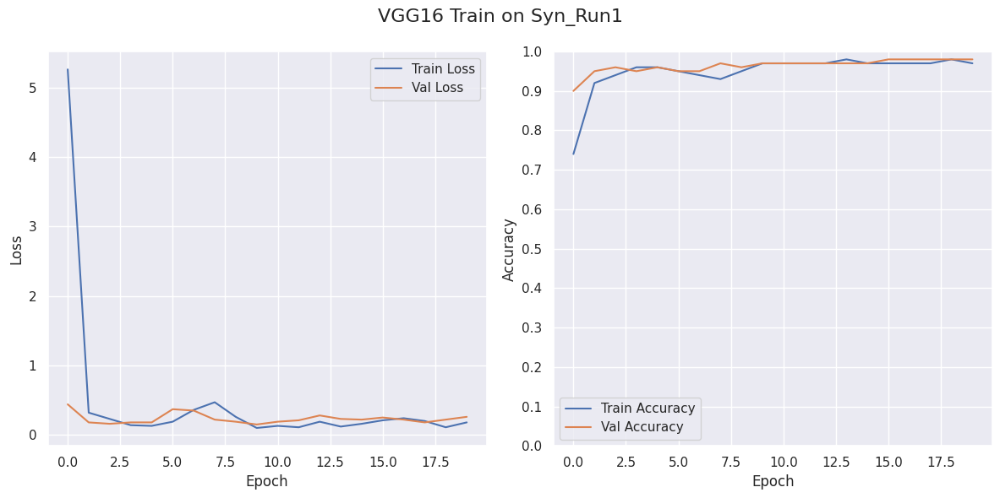

8/8 [==============================] - 2s 217ms/step
{'Test Loss': 2.1519, 'Test Accuracy': 0.8259, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.83, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


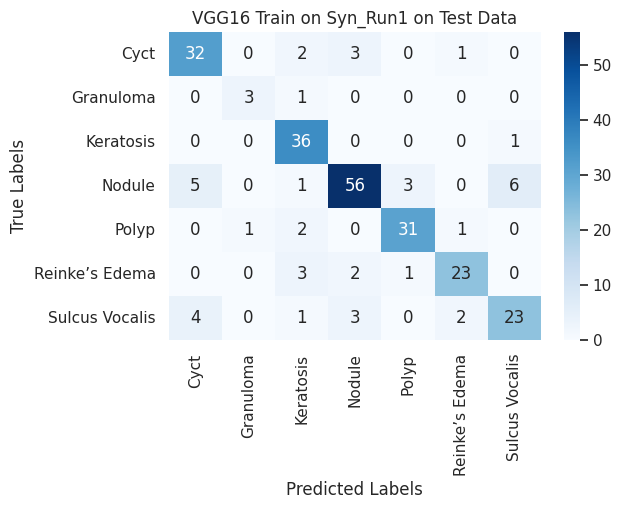

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 5.1536 - accuracy: 0.7342 - val_loss: 0.2426 - val_accuracy: 0.9329
Epoch 2/20
95/95 [==============================] - 28s 299ms/step - loss: 0.2865 - accuracy: 0.9193 - val_loss: 0.1876 - val_accuracy: 0.9553
Epoch 3/20
95/95 [==============================] - 28s 298ms/step - loss: 0.1817 - accuracy: 0.9496 - val_loss: 0.1591 - val_accuracy: 0.9671
Epoch 4/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1482 - accuracy: 0.9572 - val_loss: 0.1328 - val_accuracy: 0.9737
Epoch 5/20
95/95 [==============================] - 28s 298ms/step - loss: 0.1471 - accuracy: 0.9621 - val_loss: 0.1382 - val_accuracy: 0.9632
Epoch 6/20
95/95 [==============================] - 28s 297ms/step - loss: 0.1183 - accuracy: 0.9634 - val_loss: 0.1880 - val_accuracy: 0.9658
Epoch 7/20
95/95 [===================

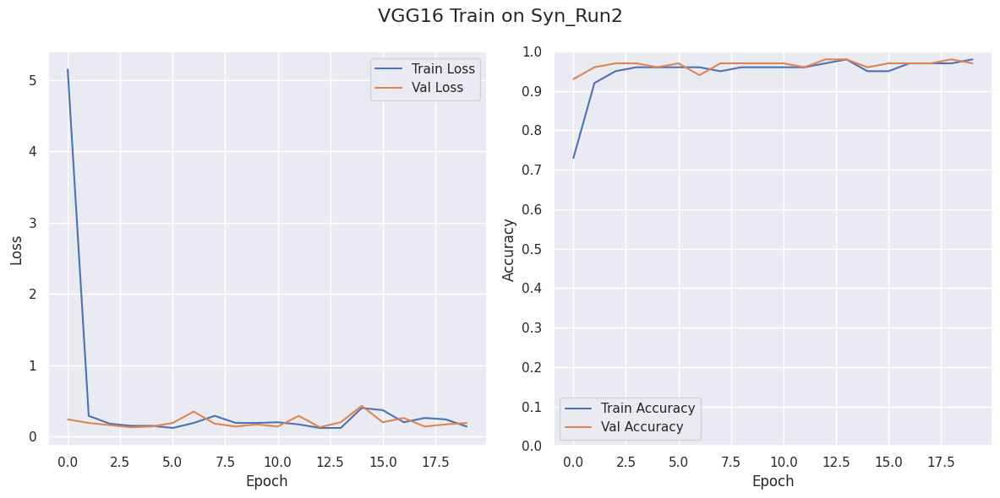

8/8 [==============================] - 2s 218ms/step
{'Test Loss': 3.1806, 'Test Accuracy': 0.7611, 'F1 Score': 0.75, 'Sensitivity (Recall)': 0.76, 'Precision': 0.79, 'Specificity (With Structural Pathology)': 0.96}


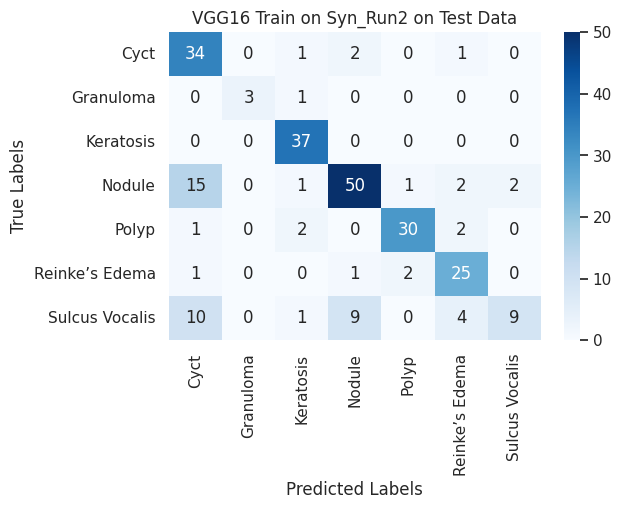

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 295ms/step - loss: 4.5909 - accuracy: 0.7477 - val_loss: 0.5338 - val_accuracy: 0.9066
Epoch 2/20
95/95 [==============================] - 28s 300ms/step - loss: 0.3564 - accuracy: 0.9186 - val_loss: 0.1507 - val_accuracy: 0.9671
Epoch 3/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1764 - accuracy: 0.9496 - val_loss: 0.2683 - val_accuracy: 0.9316
Epoch 4/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1793 - accuracy: 0.9536 - val_loss: 0.2026 - val_accuracy: 0.9579
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1616 - accuracy: 0.9569 - val_loss: 0.1903 - val_accuracy: 0.9618
Epoch 6/20
95/95 [==============================] - 28s 298ms/step - loss: 0.2084 - accuracy: 0.9536 - val_loss: 0.2287 - val_accuracy: 0.9592
Epoch 7/20
95/95 [===================

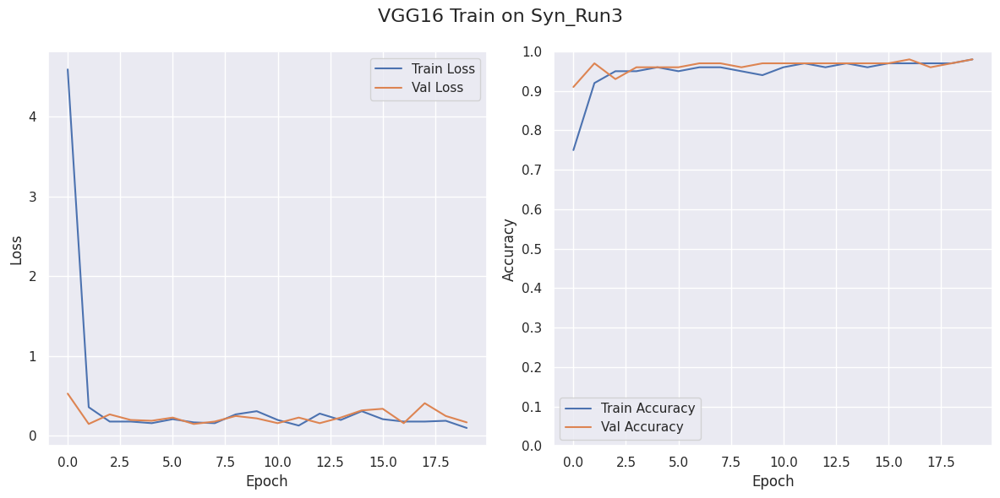

8/8 [==============================] - 2s 215ms/step
{'Test Loss': 2.9998, 'Test Accuracy': 0.8016, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.8, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


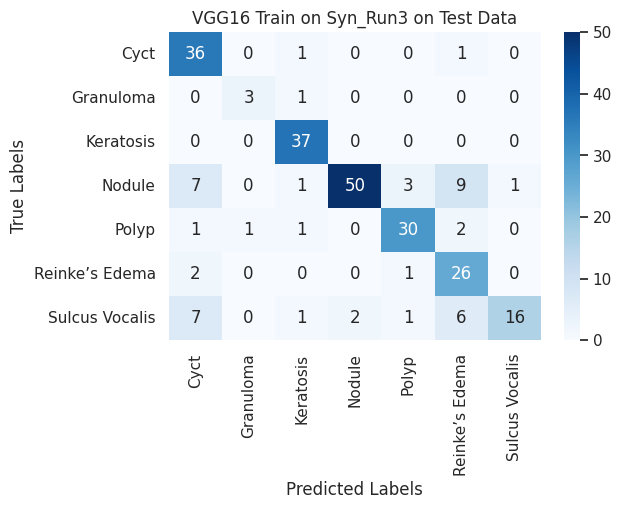

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 4.9913 - accuracy: 0.7358 - val_loss: 0.3140 - val_accuracy: 0.9118
Epoch 2/20
95/95 [==============================] - 28s 300ms/step - loss: 0.3049 - accuracy: 0.9203 - val_loss: 0.1291 - val_accuracy: 0.9645
Epoch 3/20
95/95 [==============================] - 28s 300ms/step - loss: 0.2359 - accuracy: 0.9374 - val_loss: 0.1845 - val_accuracy: 0.9487
Epoch 4/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1504 - accuracy: 0.9506 - val_loss: 0.1164 - val_accuracy: 0.9684
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1517 - accuracy: 0.9588 - val_loss: 0.1121 - val_accuracy: 0.9684
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1976 - accuracy: 0.9503 - val_loss: 0.1533 - val_accuracy: 0.9671
Epoch 7/20
95/95 [===================

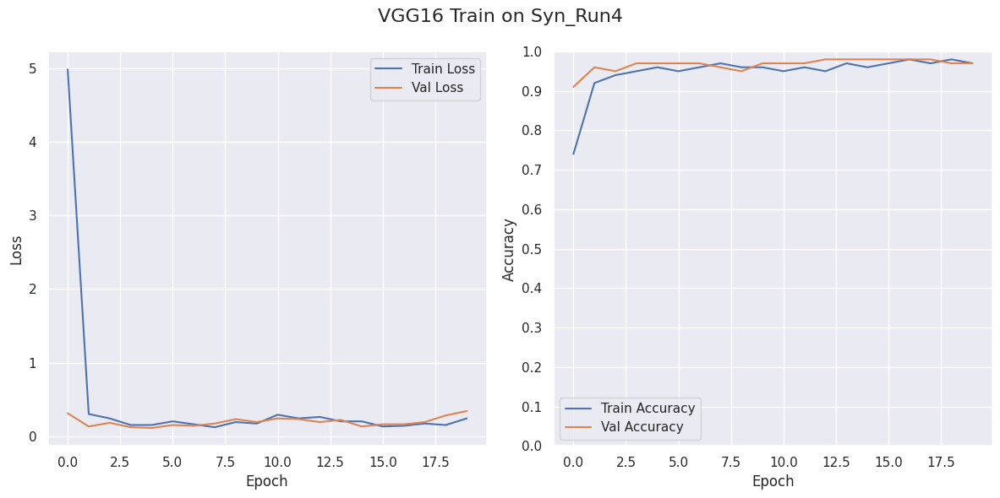

8/8 [==============================] - 2s 215ms/step
{'Test Loss': 3.1494, 'Test Accuracy': 0.7733, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.77, 'Precision': 0.8, 'Specificity (With Structural Pathology)': 0.96}


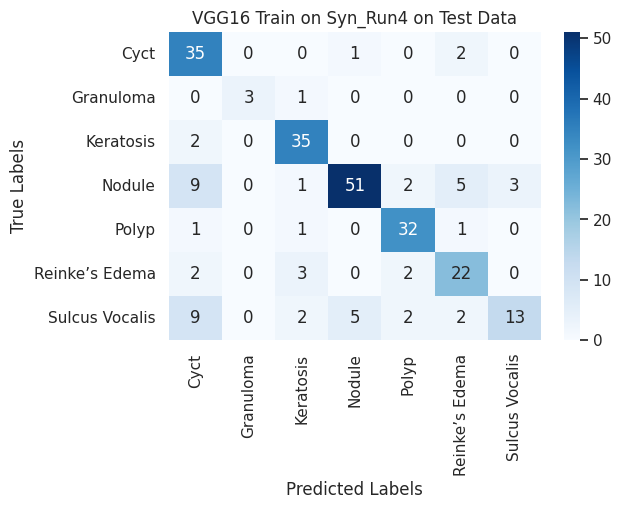

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 4.3527 - accuracy: 0.7421 - val_loss: 0.2766 - val_accuracy: 0.9224
Epoch 2/20
95/95 [==============================] - 28s 297ms/step - loss: 0.2899 - accuracy: 0.9134 - val_loss: 0.1508 - val_accuracy: 0.9368
Epoch 3/20
95/95 [==============================] - 28s 299ms/step - loss: 0.2072 - accuracy: 0.9397 - val_loss: 0.1277 - val_accuracy: 0.9711
Epoch 4/20
95/95 [==============================] - 28s 297ms/step - loss: 0.1746 - accuracy: 0.9516 - val_loss: 0.1123 - val_accuracy: 0.9697
Epoch 5/20
95/95 [==============================] - 29s 301ms/step - loss: 0.1822 - accuracy: 0.9532 - val_loss: 0.1587 - val_accuracy: 0.9658
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1358 - accuracy: 0.9621 - val_loss: 0.1234 - val_accuracy: 0.9724
Epoch 7/20
95/95 [===================

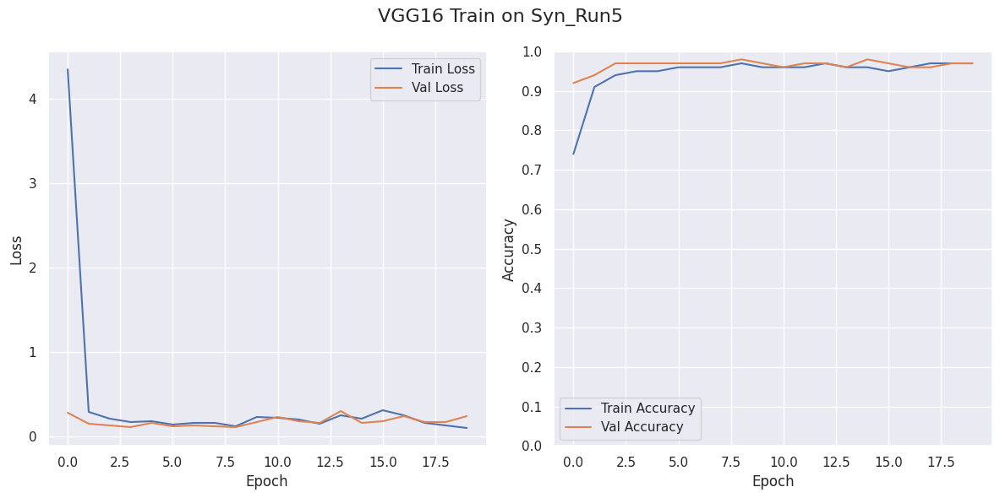

8/8 [==============================] - 2s 214ms/step
{'Test Loss': 1.8516, 'Test Accuracy': 0.8178, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.82, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


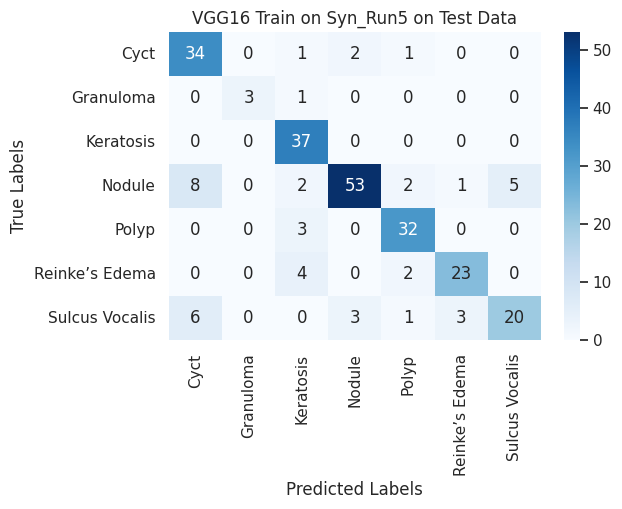

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 297ms/step - loss: 5.0114 - accuracy: 0.7454 - val_loss: 0.2859 - val_accuracy: 0.9316
Epoch 2/20
95/95 [==============================] - 28s 299ms/step - loss: 0.4088 - accuracy: 0.9160 - val_loss: 0.1749 - val_accuracy: 0.9618
Epoch 3/20
95/95 [==============================] - 28s 300ms/step - loss: 0.2107 - accuracy: 0.9447 - val_loss: 0.1973 - val_accuracy: 0.9553
Epoch 4/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1635 - accuracy: 0.9582 - val_loss: 0.1711 - val_accuracy: 0.9711
Epoch 5/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1589 - accuracy: 0.9677 - val_loss: 0.2054 - val_accuracy: 0.9645
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1380 - accuracy: 0.9667 - val_loss: 0.1820 - val_accuracy: 0.9658
Epoch 7/20
95/95 [===================

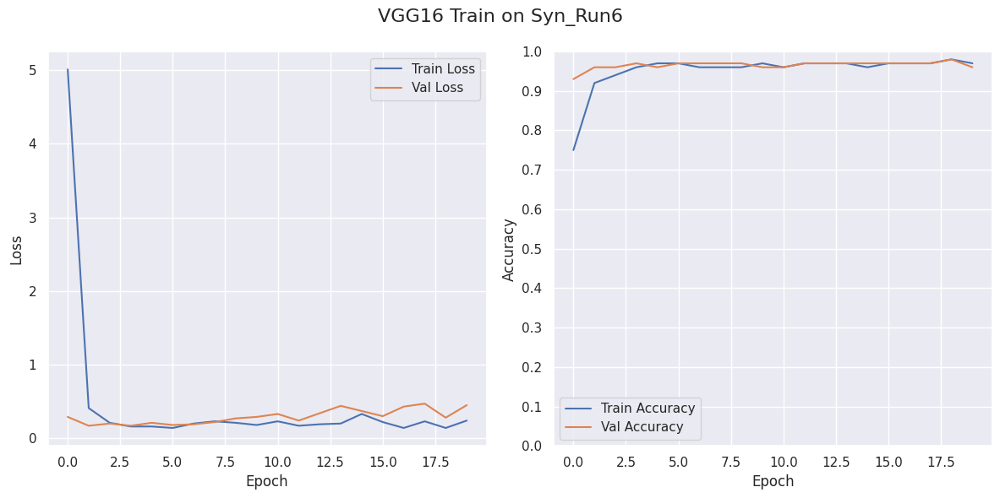

8/8 [==============================] - 2s 217ms/step
{'Test Loss': 5.3173, 'Test Accuracy': 0.7449, 'F1 Score': 0.72, 'Sensitivity (Recall)': 0.74, 'Precision': 0.78, 'Specificity (With Structural Pathology)': 0.96}


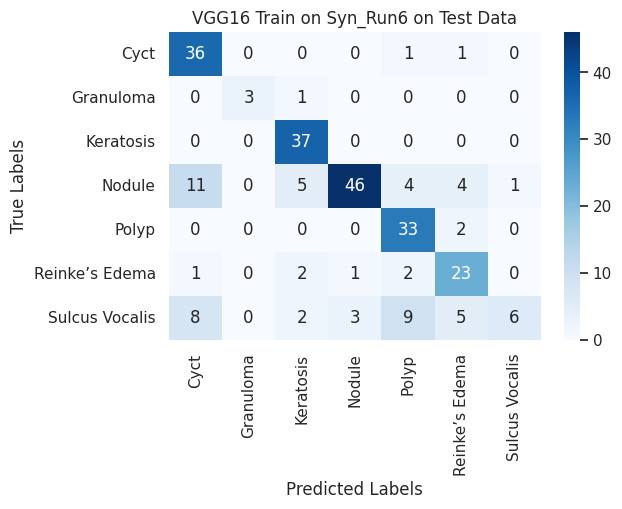

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 5.3654 - accuracy: 0.7332 - val_loss: 0.5522 - val_accuracy: 0.9250
Epoch 2/20
95/95 [==============================] - 28s 300ms/step - loss: 0.3080 - accuracy: 0.9262 - val_loss: 0.2048 - val_accuracy: 0.9566
Epoch 3/20
95/95 [==============================] - 28s 300ms/step - loss: 0.2032 - accuracy: 0.9417 - val_loss: 0.1697 - val_accuracy: 0.9605
Epoch 4/20
95/95 [==============================] - 28s 301ms/step - loss: 0.1452 - accuracy: 0.9595 - val_loss: 0.1764 - val_accuracy: 0.9605
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1681 - accuracy: 0.9545 - val_loss: 0.2131 - val_accuracy: 0.9592
Epoch 6/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1952 - accuracy: 0.9539 - val_loss: 0.1608 - val_accuracy: 0.9750
Epoch 7/20
95/95 [===================

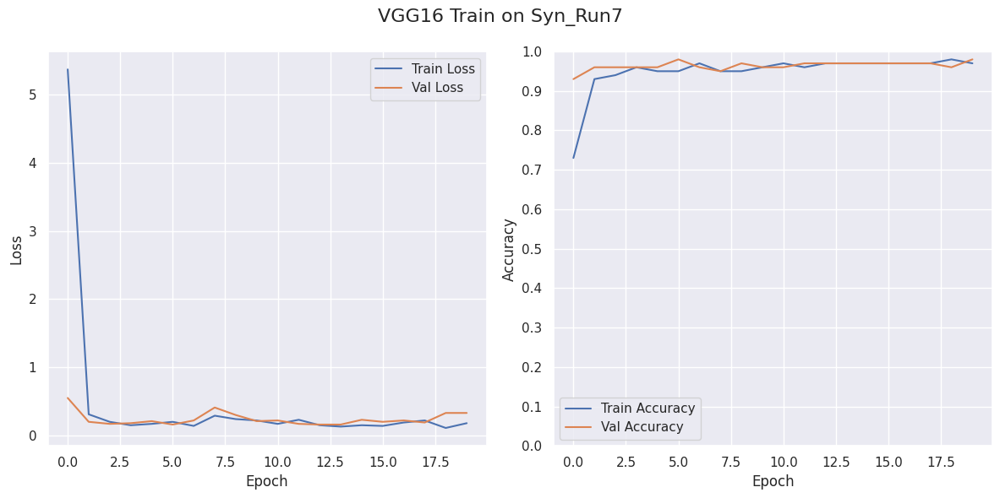

8/8 [==============================] - 2s 218ms/step
{'Test Loss': 3.4207, 'Test Accuracy': 0.7895, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.79, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


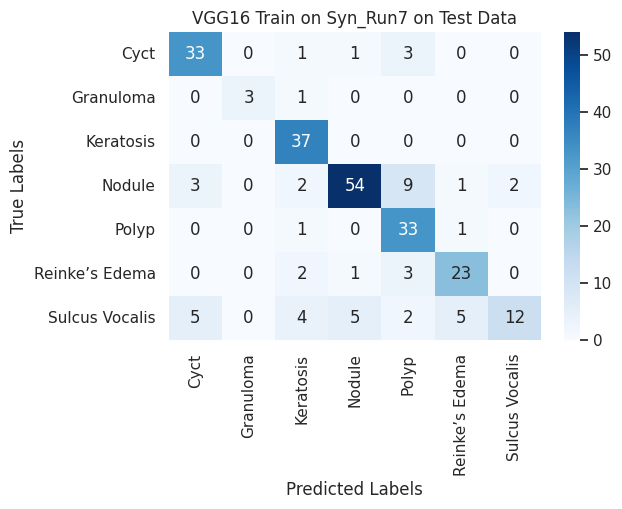

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 4.8623 - accuracy: 0.7516 - val_loss: 0.3196 - val_accuracy: 0.9368
Epoch 2/20
95/95 [==============================] - 28s 297ms/step - loss: 0.3745 - accuracy: 0.9140 - val_loss: 0.2018 - val_accuracy: 0.9461
Epoch 3/20
95/95 [==============================] - 28s 297ms/step - loss: 0.2412 - accuracy: 0.9460 - val_loss: 0.1879 - val_accuracy: 0.9632
Epoch 4/20
95/95 [==============================] - 28s 298ms/step - loss: 0.1959 - accuracy: 0.9529 - val_loss: 0.2171 - val_accuracy: 0.9592
Epoch 5/20
95/95 [==============================] - 28s 297ms/step - loss: 0.1820 - accuracy: 0.9569 - val_loss: 0.1584 - val_accuracy: 0.9750
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.3076 - accuracy: 0.9394 - val_loss: 0.2715 - val_accuracy: 0.9566
Epoch 7/20
95/95 [===================

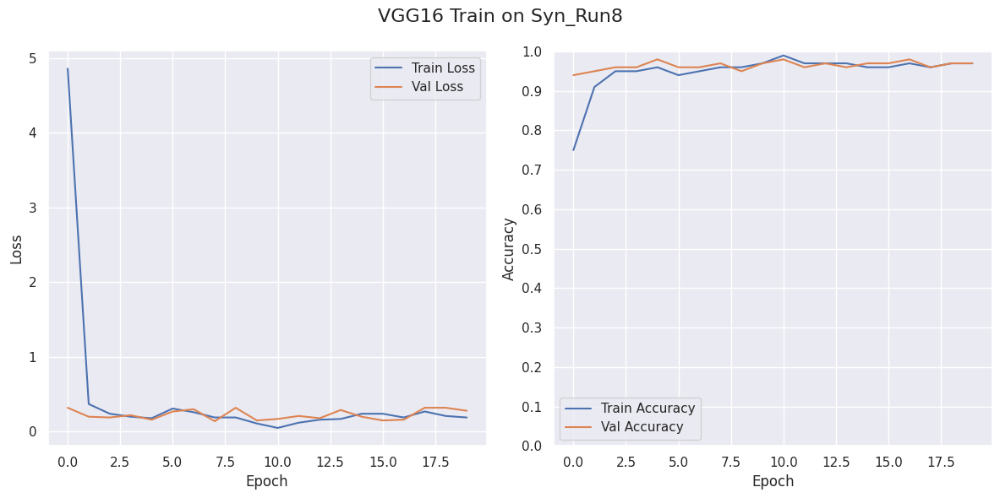

8/8 [==============================] - 2s 217ms/step
{'Test Loss': 3.1301, 'Test Accuracy': 0.7895, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.79, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


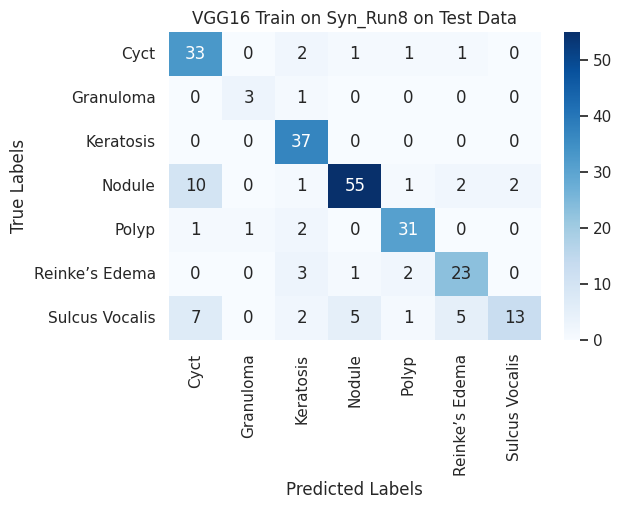

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 6.0340 - accuracy: 0.7401 - val_loss: 0.2717 - val_accuracy: 0.9434
Epoch 2/20
95/95 [==============================] - 28s 299ms/step - loss: 0.3307 - accuracy: 0.9180 - val_loss: 0.1816 - val_accuracy: 0.9579
Epoch 3/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1687 - accuracy: 0.9463 - val_loss: 0.1712 - val_accuracy: 0.9684
Epoch 4/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1642 - accuracy: 0.9588 - val_loss: 0.1886 - val_accuracy: 0.9671
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.1886 - accuracy: 0.9545 - val_loss: 0.1679 - val_accuracy: 0.9697
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1513 - accuracy: 0.9641 - val_loss: 0.2023 - val_accuracy: 0.9658
Epoch 7/20
95/95 [===================

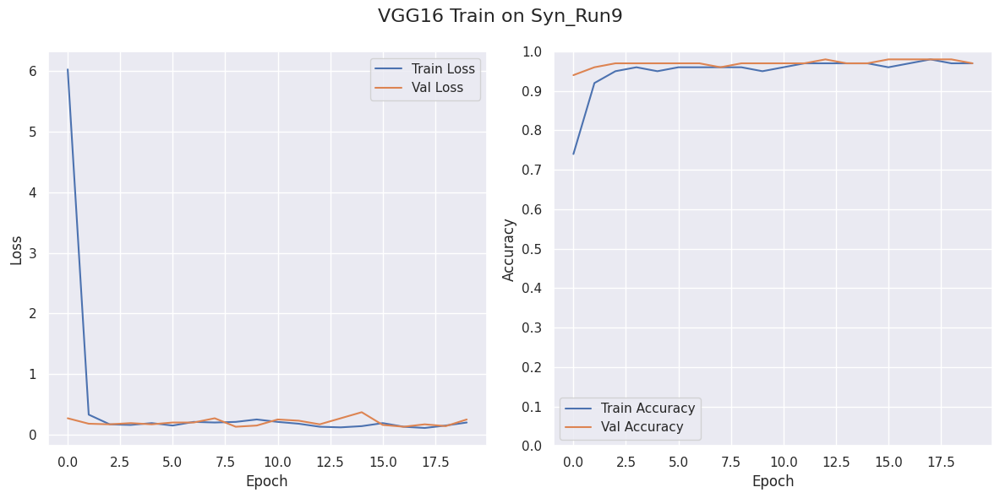

8/8 [==============================] - 2s 215ms/step
{'Test Loss': 3.0268, 'Test Accuracy': 0.7935, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.79, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.96}


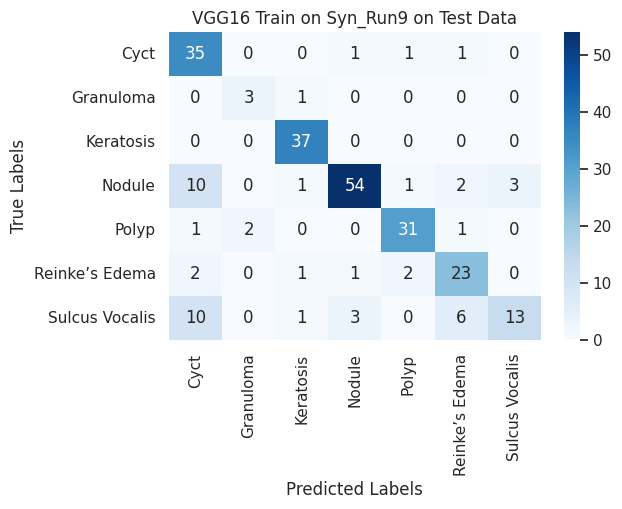

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 29s 296ms/step - loss: 5.1814 - accuracy: 0.7434 - val_loss: 0.4057 - val_accuracy: 0.9118
Epoch 2/20
95/95 [==============================] - 28s 298ms/step - loss: 0.3599 - accuracy: 0.9088 - val_loss: 0.2007 - val_accuracy: 0.9579
Epoch 3/20
95/95 [==============================] - 28s 299ms/step - loss: 0.2249 - accuracy: 0.9414 - val_loss: 0.3003 - val_accuracy: 0.9447
Epoch 4/20
95/95 [==============================] - 28s 298ms/step - loss: 0.2262 - accuracy: 0.9443 - val_loss: 0.2664 - val_accuracy: 0.9526
Epoch 5/20
95/95 [==============================] - 28s 300ms/step - loss: 0.2156 - accuracy: 0.9486 - val_loss: 0.2060 - val_accuracy: 0.9671
Epoch 6/20
95/95 [==============================] - 28s 299ms/step - loss: 0.1627 - accuracy: 0.9628 - val_loss: 0.1279 - val_accuracy: 0.9711
Epoch 7/20
95/95 [===================

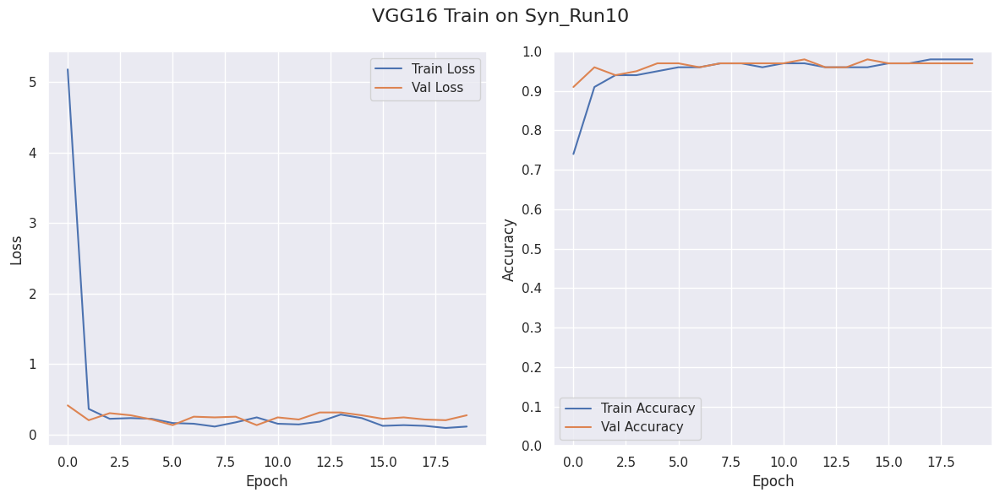

8/8 [==============================] - 2s 218ms/step
{'Test Loss': 2.3052, 'Test Accuracy': 0.7976, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.8, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.97}


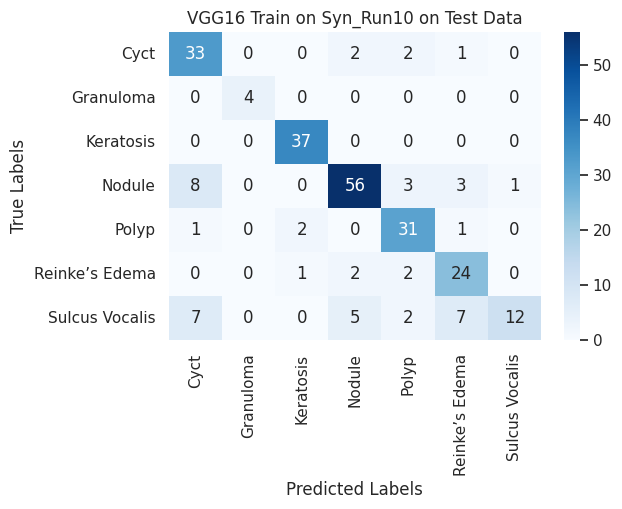

In [9]:
dataset_dir_org = f'{path_dir}/Original'
dataset_dir_ddpm = f'{path_dir}/Generated_CLEAN_1'

title = "VGG16 Train on Syn"
file_name = f"{path_dir}/Trained_Models/VGG16_training_history_plot_original_t.png"

n=10
epochs=20
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 10percent of Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 294ms/step - loss: 5.4114 - accuracy: 0.7247 - val_loss: 0.2604 - val_accuracy: 0.9451
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.3569 - accuracy: 0.9124 - val_loss: 0.2350 - val_accuracy: 0.9438
Epoch 3/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2520 - accuracy: 0.9412 - val_loss: 0.1501 - val_accuracy: 0.9673
Epoch 4/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1658 - accuracy: 0.9595 - val_loss: 0.1842 - val_accuracy: 0.9660
Epoch 5/20
96/96 [==============================] - 29s 298ms/step - loss: 0.1573 - accuracy: 0.9601 - val_loss: 0.2639 - val_accuracy: 0.9556
Epoch 6/20
96/96 [==============================] - 28s 297ms/step - loss: 0.1704 - accuracy: 0.9585 - val_loss: 0.1832 - val_accuracy: 0.9647
Epoch 7/20
96/96 [===================

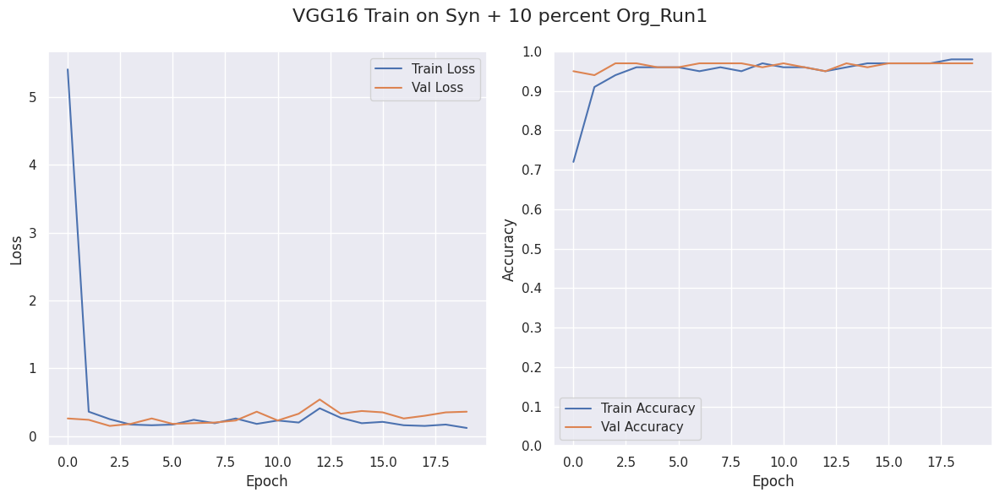

7/7 [==============================] - 2s 219ms/step
{'Test Loss': 3.1752, 'Test Accuracy': 0.8037, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.8, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.97}


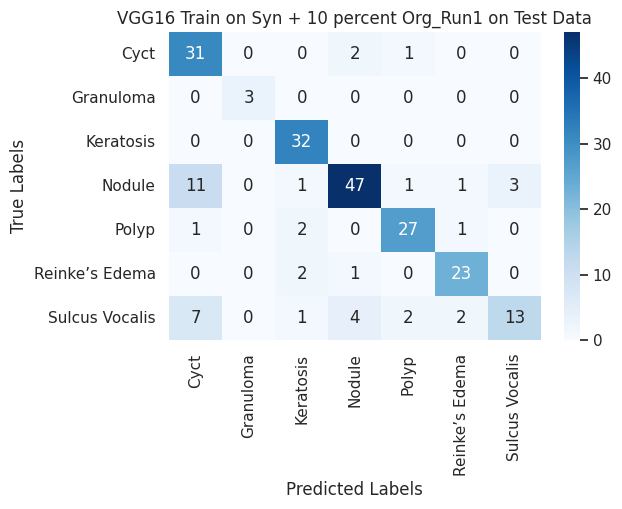

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 292ms/step - loss: 5.4295 - accuracy: 0.7395 - val_loss: 0.2347 - val_accuracy: 0.9307
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.3006 - accuracy: 0.9147 - val_loss: 0.1847 - val_accuracy: 0.9516
Epoch 3/20
96/96 [==============================] - 28s 294ms/step - loss: 0.2215 - accuracy: 0.9372 - val_loss: 0.1314 - val_accuracy: 0.9621
Epoch 4/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1570 - accuracy: 0.9506 - val_loss: 0.2010 - val_accuracy: 0.9582
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1689 - accuracy: 0.9555 - val_loss: 0.1611 - val_accuracy: 0.9673
Epoch 6/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1908 - accuracy: 0.9497 - val_loss: 0.2334 - val_accuracy: 0.9556
Epoch 7/20
96/96 [===================

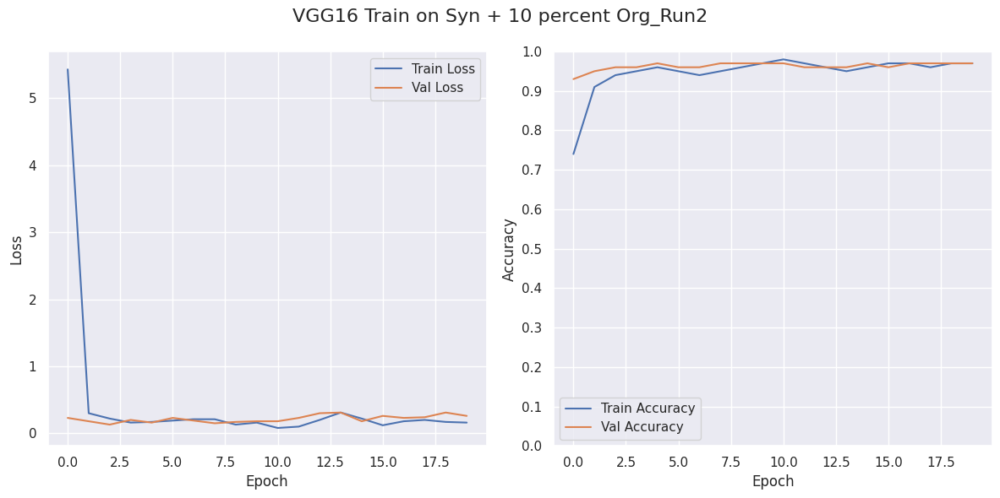

7/7 [==============================] - 2s 220ms/step
{'Test Loss': 2.0869, 'Test Accuracy': 0.8174, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.82, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


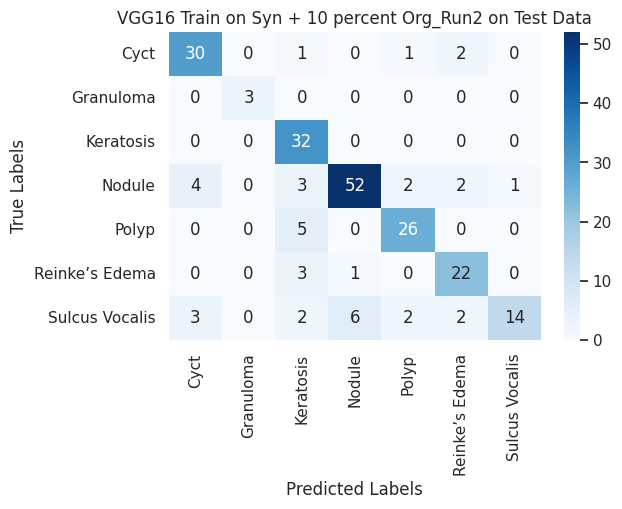

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 294ms/step - loss: 5.0029 - accuracy: 0.7218 - val_loss: 0.2416 - val_accuracy: 0.9386
Epoch 2/20
96/96 [==============================] - 28s 297ms/step - loss: 0.3235 - accuracy: 0.9072 - val_loss: 0.2225 - val_accuracy: 0.9490
Epoch 3/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2073 - accuracy: 0.9408 - val_loss: 0.1667 - val_accuracy: 0.9608
Epoch 4/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1333 - accuracy: 0.9634 - val_loss: 0.1257 - val_accuracy: 0.9725
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2066 - accuracy: 0.9513 - val_loss: 0.1847 - val_accuracy: 0.9634
Epoch 6/20
96/96 [==============================] - 28s 297ms/step - loss: 0.2169 - accuracy: 0.9503 - val_loss: 0.1872 - val_accuracy: 0.9686
Epoch 7/20
96/96 [===================

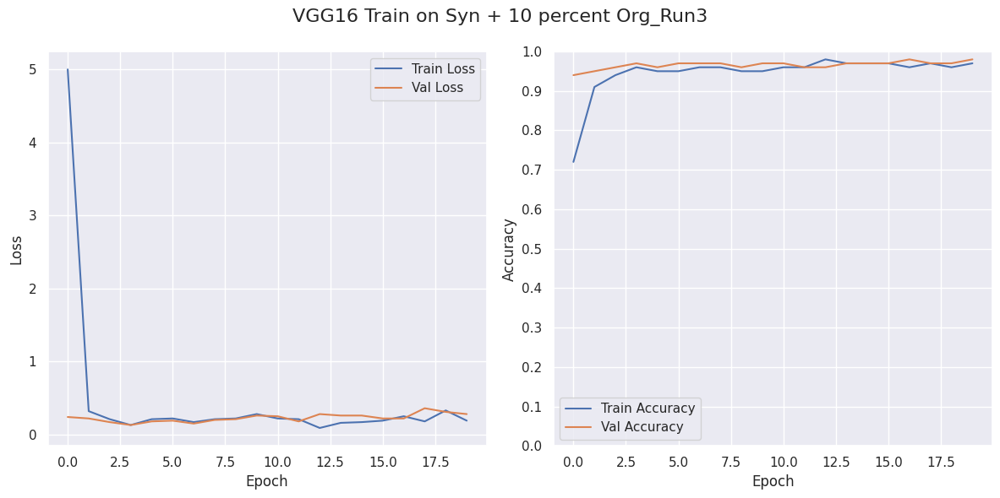

7/7 [==============================] - 2s 219ms/step
{'Test Loss': 3.057, 'Test Accuracy': 0.7717, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.77, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


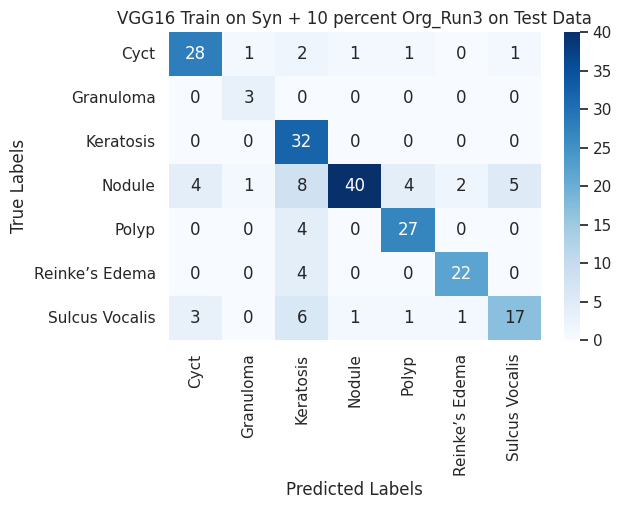

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 293ms/step - loss: 5.1150 - accuracy: 0.7283 - val_loss: 0.3090 - val_accuracy: 0.9294
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.3252 - accuracy: 0.9134 - val_loss: 0.1626 - val_accuracy: 0.9542
Epoch 3/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1676 - accuracy: 0.9490 - val_loss: 0.1417 - val_accuracy: 0.9647
Epoch 4/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1081 - accuracy: 0.9627 - val_loss: 0.1237 - val_accuracy: 0.9725
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1853 - accuracy: 0.9497 - val_loss: 0.1263 - val_accuracy: 0.9699
Epoch 6/20
96/96 [==============================] - 28s 297ms/step - loss: 0.1319 - accuracy: 0.9598 - val_loss: 0.1955 - val_accuracy: 0.9634
Epoch 7/20
96/96 [===================

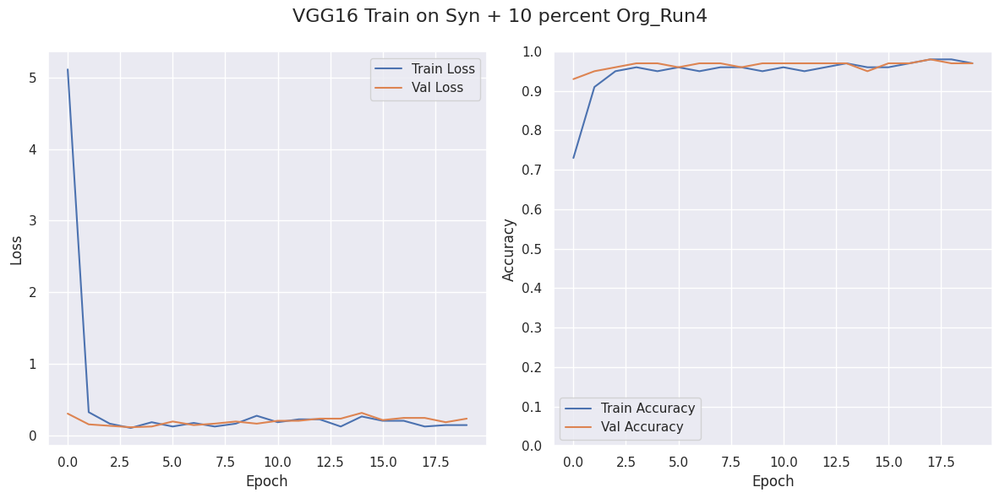

7/7 [==============================] - 2s 218ms/step
{'Test Loss': 2.5537, 'Test Accuracy': 0.8128, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.81, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


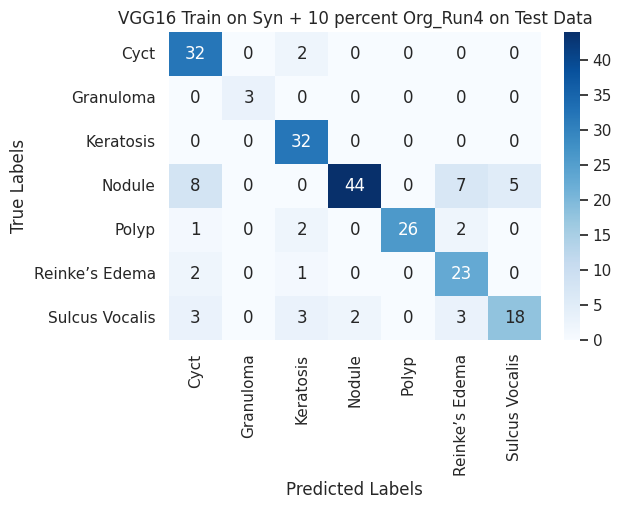

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 292ms/step - loss: 6.1228 - accuracy: 0.7486 - val_loss: 0.5982 - val_accuracy: 0.9216
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.4060 - accuracy: 0.9225 - val_loss: 0.2234 - val_accuracy: 0.9608
Epoch 3/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2160 - accuracy: 0.9516 - val_loss: 0.2322 - val_accuracy: 0.9595
Epoch 4/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1758 - accuracy: 0.9575 - val_loss: 0.2332 - val_accuracy: 0.9621
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1606 - accuracy: 0.9640 - val_loss: 0.1878 - val_accuracy: 0.9752
Epoch 6/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1882 - accuracy: 0.9611 - val_loss: 0.2421 - val_accuracy: 0.9673
Epoch 7/20
96/96 [===================

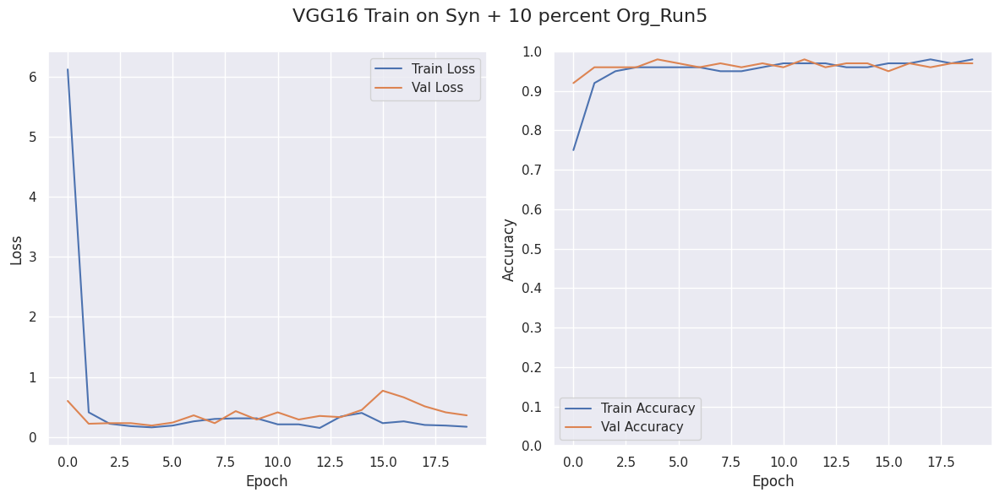

7/7 [==============================] - 2s 217ms/step
{'Test Loss': 2.731, 'Test Accuracy': 0.8037, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


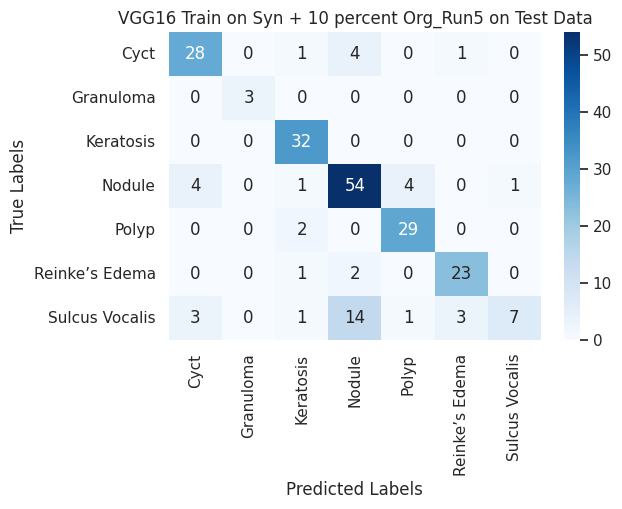

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 292ms/step - loss: 6.1683 - accuracy: 0.6986 - val_loss: 0.3159 - val_accuracy: 0.9268
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2603 - accuracy: 0.9225 - val_loss: 0.1783 - val_accuracy: 0.9556
Epoch 3/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2164 - accuracy: 0.9408 - val_loss: 0.1985 - val_accuracy: 0.9542
Epoch 4/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1764 - accuracy: 0.9516 - val_loss: 0.1765 - val_accuracy: 0.9660
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1447 - accuracy: 0.9582 - val_loss: 0.2057 - val_accuracy: 0.9647
Epoch 6/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1780 - accuracy: 0.9565 - val_loss: 0.2872 - val_accuracy: 0.9660
Epoch 7/20
96/96 [===================

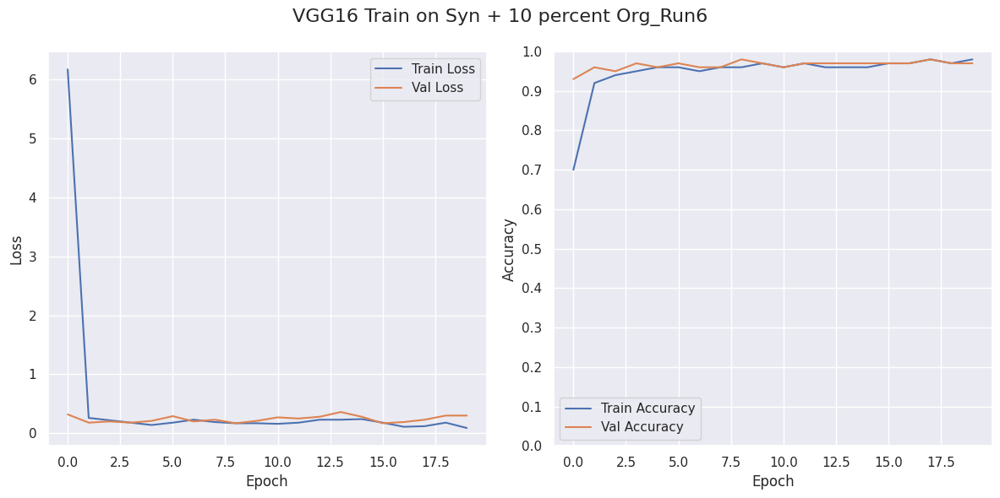

7/7 [==============================] - 2s 221ms/step
{'Test Loss': 2.1231, 'Test Accuracy': 0.7991, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.8, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


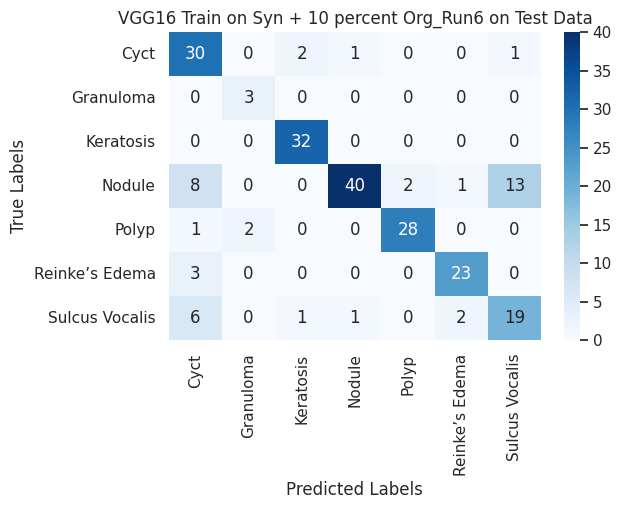

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 292ms/step - loss: 5.3786 - accuracy: 0.7342 - val_loss: 0.4003 - val_accuracy: 0.9059
Epoch 2/20
96/96 [==============================] - 28s 295ms/step - loss: 0.3886 - accuracy: 0.9121 - val_loss: 0.1960 - val_accuracy: 0.9438
Epoch 3/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2764 - accuracy: 0.9376 - val_loss: 0.1849 - val_accuracy: 0.9582
Epoch 4/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1698 - accuracy: 0.9549 - val_loss: 0.1322 - val_accuracy: 0.9739
Epoch 5/20
96/96 [==============================] - 28s 297ms/step - loss: 0.1750 - accuracy: 0.9516 - val_loss: 0.1219 - val_accuracy: 0.9686
Epoch 6/20
96/96 [==============================] - 28s 297ms/step - loss: 0.1948 - accuracy: 0.9546 - val_loss: 0.2048 - val_accuracy: 0.9686
Epoch 7/20
96/96 [===================

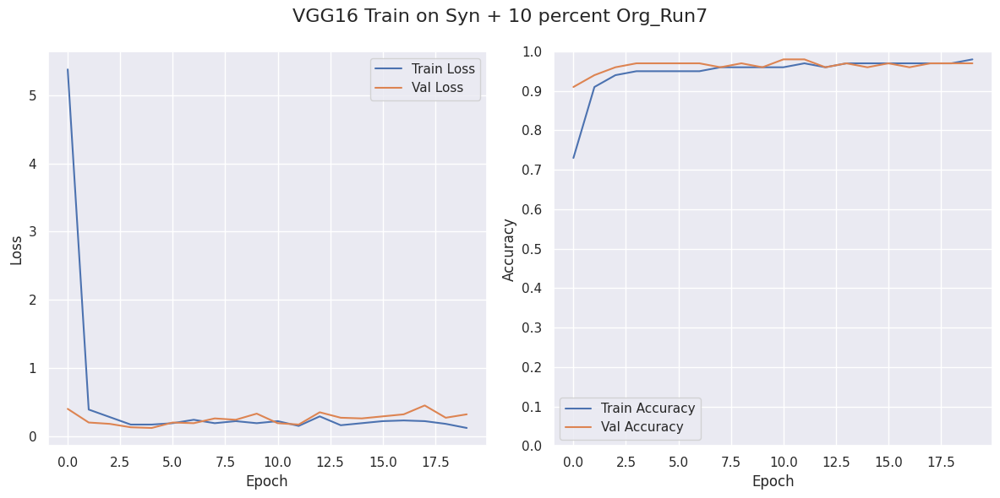

7/7 [==============================] - 2s 217ms/step
{'Test Loss': 2.8207, 'Test Accuracy': 0.7808, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.78, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


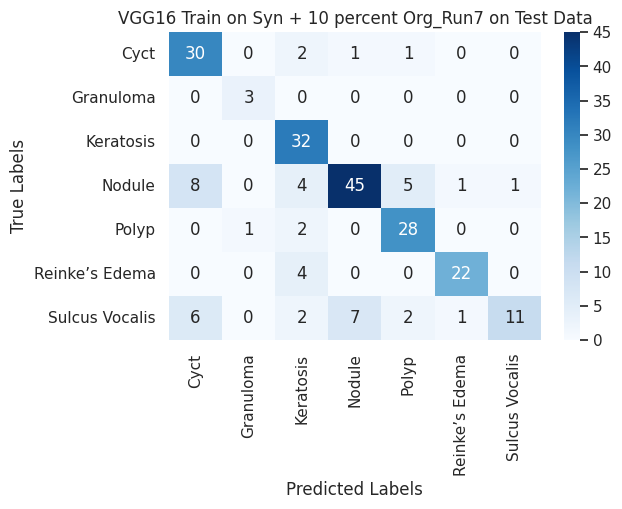

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 291ms/step - loss: 5.6083 - accuracy: 0.7417 - val_loss: 0.2866 - val_accuracy: 0.9425
Epoch 2/20
96/96 [==============================] - 28s 294ms/step - loss: 0.2642 - accuracy: 0.9291 - val_loss: 0.1765 - val_accuracy: 0.9647
Epoch 3/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2232 - accuracy: 0.9454 - val_loss: 0.2965 - val_accuracy: 0.9595
Epoch 4/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2275 - accuracy: 0.9519 - val_loss: 0.2361 - val_accuracy: 0.9621
Epoch 5/20
96/96 [==============================] - 28s 294ms/step - loss: 0.1670 - accuracy: 0.9601 - val_loss: 0.2658 - val_accuracy: 0.9582
Epoch 6/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1720 - accuracy: 0.9618 - val_loss: 0.2321 - val_accuracy: 0.9582
Epoch 7/20
96/96 [===================

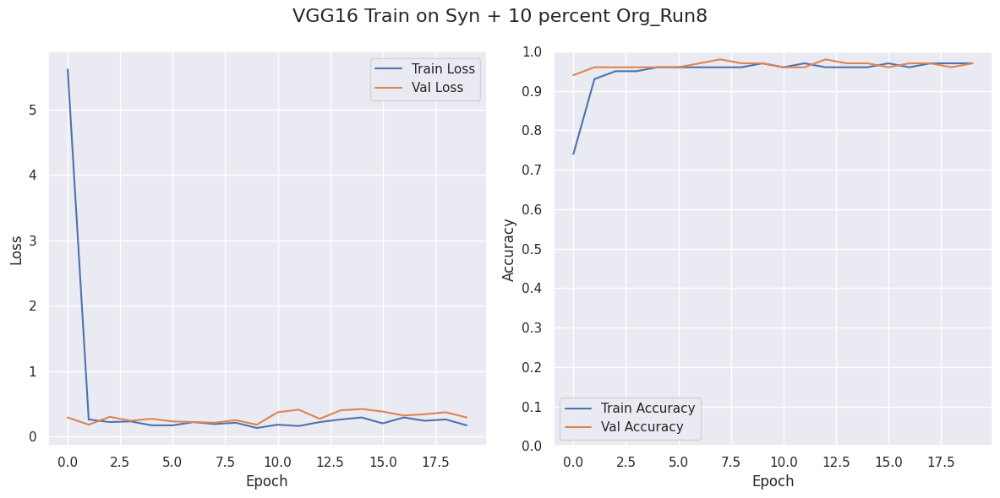

7/7 [==============================] - 2s 219ms/step
{'Test Loss': 3.8045, 'Test Accuracy': 0.7945, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.79, 'Precision': 0.8, 'Specificity (With Structural Pathology)': 0.96}


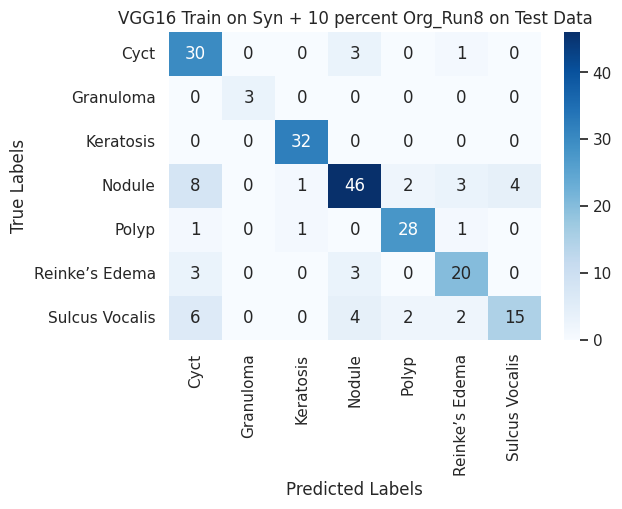

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 291ms/step - loss: 5.0609 - accuracy: 0.7431 - val_loss: 0.3552 - val_accuracy: 0.9346
Epoch 2/20
96/96 [==============================] - 28s 294ms/step - loss: 0.3056 - accuracy: 0.9258 - val_loss: 0.2269 - val_accuracy: 0.9582
Epoch 3/20
96/96 [==============================] - 28s 294ms/step - loss: 0.2096 - accuracy: 0.9500 - val_loss: 0.2032 - val_accuracy: 0.9608
Epoch 4/20
96/96 [==============================] - 28s 295ms/step - loss: 0.2109 - accuracy: 0.9513 - val_loss: 0.1942 - val_accuracy: 0.9634
Epoch 5/20
96/96 [==============================] - 28s 294ms/step - loss: 0.1853 - accuracy: 0.9568 - val_loss: 0.1647 - val_accuracy: 0.9660
Epoch 6/20
96/96 [==============================] - 28s 294ms/step - loss: 0.1667 - accuracy: 0.9608 - val_loss: 0.2089 - val_accuracy: 0.9660
Epoch 7/20
96/96 [===================

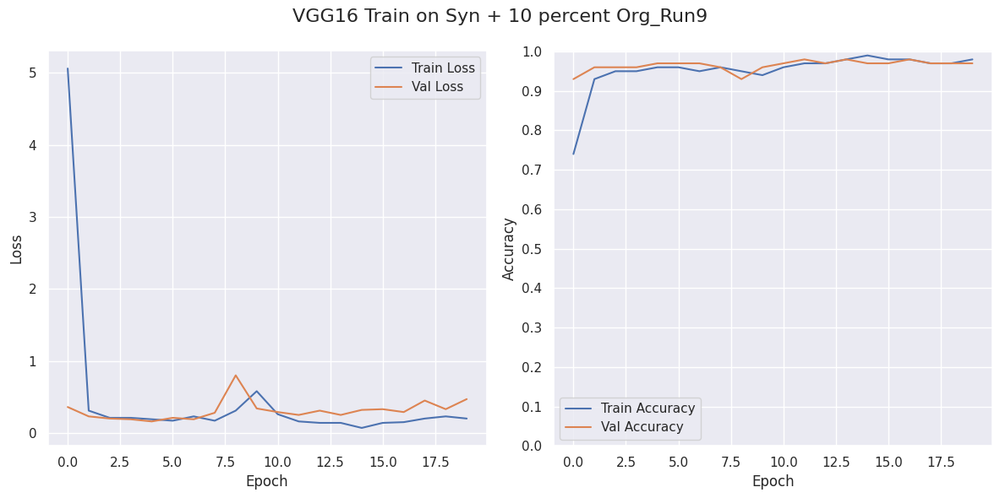

7/7 [==============================] - 2s 218ms/step
{'Test Loss': 3.1526, 'Test Accuracy': 0.8174, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.82, 'Precision': 0.85, 'Specificity (With Structural Pathology)': 0.97}


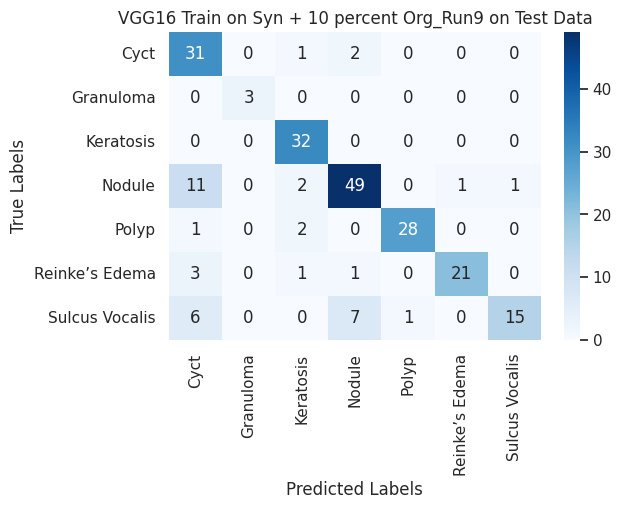

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 29s 292ms/step - loss: 5.3086 - accuracy: 0.7427 - val_loss: 0.3252 - val_accuracy: 0.9203
Epoch 2/20
96/96 [==============================] - 28s 294ms/step - loss: 0.2798 - accuracy: 0.9212 - val_loss: 0.1678 - val_accuracy: 0.9608
Epoch 3/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2323 - accuracy: 0.9395 - val_loss: 0.1561 - val_accuracy: 0.9660
Epoch 4/20
96/96 [==============================] - 28s 296ms/step - loss: 0.2385 - accuracy: 0.9461 - val_loss: 0.2061 - val_accuracy: 0.9582
Epoch 5/20
96/96 [==============================] - 28s 296ms/step - loss: 0.1288 - accuracy: 0.9689 - val_loss: 0.2211 - val_accuracy: 0.9673
Epoch 6/20
96/96 [==============================] - 28s 295ms/step - loss: 0.1341 - accuracy: 0.9657 - val_loss: 0.1742 - val_accuracy: 0.9647
Epoch 7/20
96/96 [===================

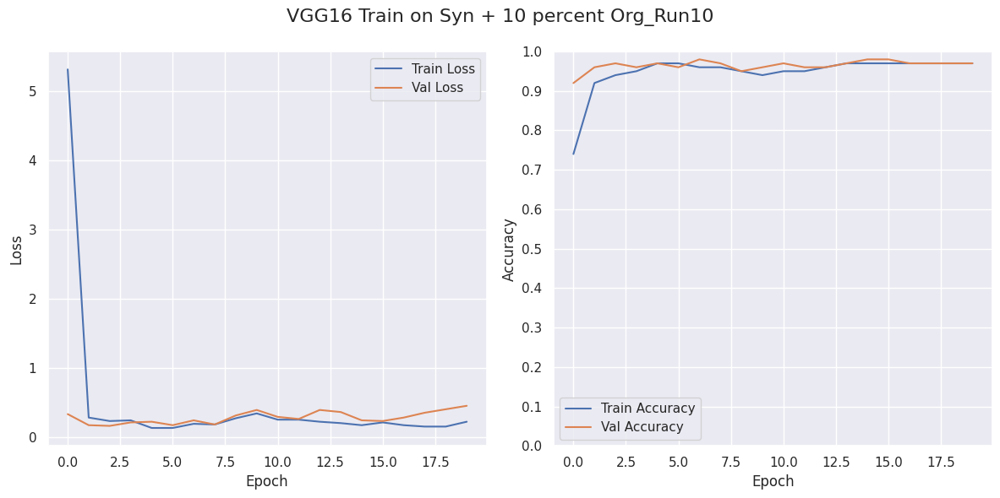

7/7 [==============================] - 2s 217ms/step
{'Test Loss': 3.7972, 'Test Accuracy': 0.7626, 'F1 Score': 0.74, 'Sensitivity (Recall)': 0.76, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


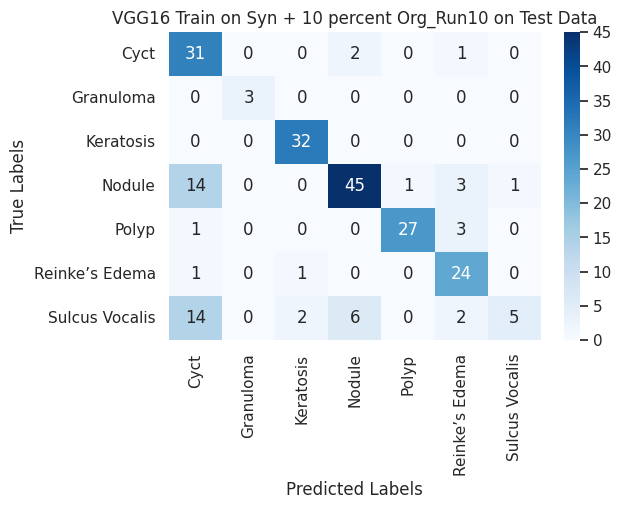

In [10]:
dataset_dir_org = f'{path_dir}/10_percent/Original'
dataset_dir_ddpm = f'{path_dir}/10_percent/Generated_CLEAN_1'

title = "VGG16 Train on Syn + 10 percent Org"
file_name = f"{path_dir}/Trained_Models/VGG16_Synthetic_10percent_Original.png"

n=10
epochs=20
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 50 percent of Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 30s 294ms/step - loss: 4.7366 - accuracy: 0.7199 - val_loss: 0.4597 - val_accuracy: 0.8990
Epoch 2/20
98/98 [==============================] - 29s 295ms/step - loss: 0.4044 - accuracy: 0.8969 - val_loss: 0.2832 - val_accuracy: 0.9284
Epoch 3/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2916 - accuracy: 0.9216 - val_loss: 0.2186 - val_accuracy: 0.9514
Epoch 4/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2833 - accuracy: 0.9305 - val_loss: 0.2060 - val_accuracy: 0.9565
Epoch 5/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2192 - accuracy: 0.9501 - val_loss: 0.1899 - val_accuracy: 0.9565
Epoch 6/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2286 - accuracy: 0.9440 - val_loss: 0.1992 - val_accuracy: 0.9565
Epoch 7/20
98/98 [===================

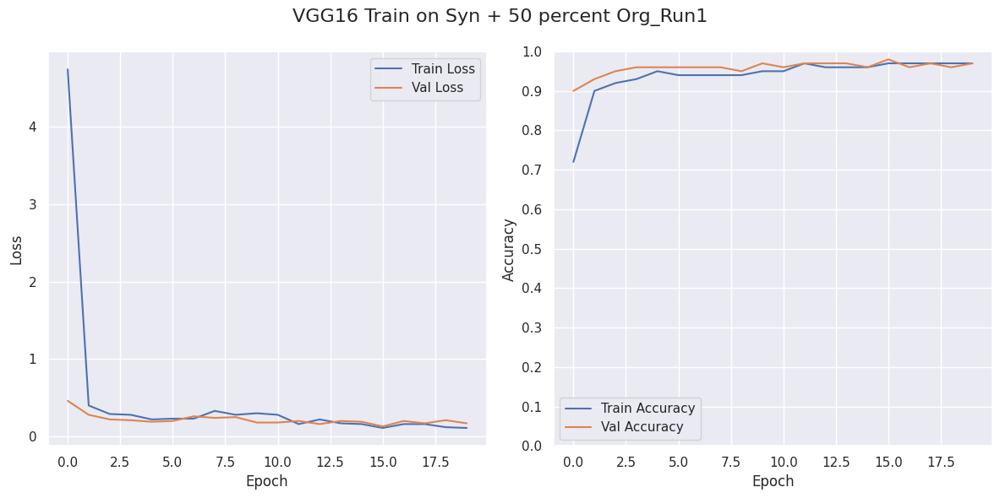

5/5 [==============================] - 1s 191ms/step
{'Test Loss': 2.1489, 'Test Accuracy': 0.8273, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.83, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


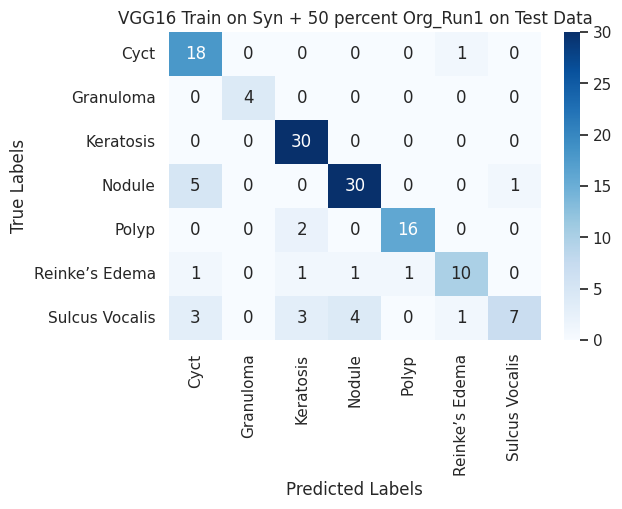

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 30s 295ms/step - loss: 5.5512 - accuracy: 0.6985 - val_loss: 0.3047 - val_accuracy: 0.8913
Epoch 2/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3946 - accuracy: 0.8748 - val_loss: 0.2601 - val_accuracy: 0.9297
Epoch 3/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3161 - accuracy: 0.9078 - val_loss: 0.2525 - val_accuracy: 0.9425
Epoch 4/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2658 - accuracy: 0.9235 - val_loss: 0.1871 - val_accuracy: 0.9514
Epoch 5/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2076 - accuracy: 0.9405 - val_loss: 0.1952 - val_accuracy: 0.9527
Epoch 6/20
98/98 [==============================] - 29s 295ms/step - loss: 0.1930 - accuracy: 0.9472 - val_loss: 0.1940 - val_accuracy: 0.9540
Epoch 7/20
98/98 [===================

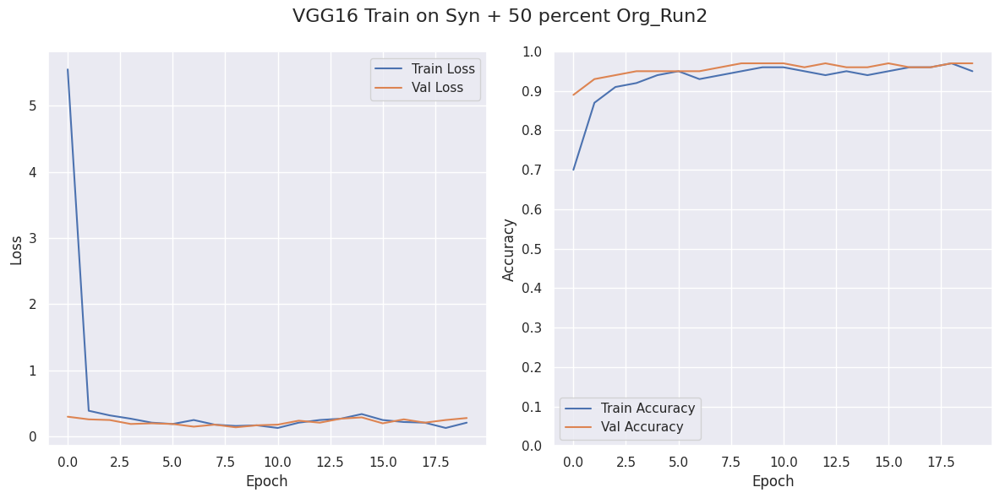

5/5 [==============================] - 1s 191ms/step
{'Test Loss': 1.6352, 'Test Accuracy': 0.8201, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.82, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.97}


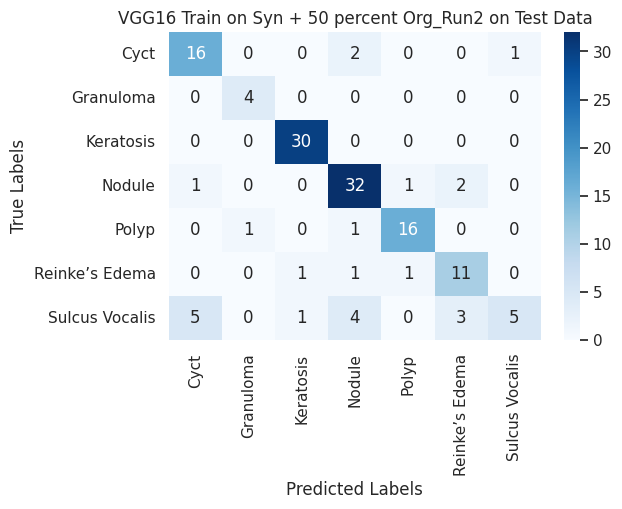

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 293ms/step - loss: 5.1832 - accuracy: 0.7186 - val_loss: 0.2621 - val_accuracy: 0.9130
Epoch 2/20
98/98 [==============================] - 29s 294ms/step - loss: 0.3806 - accuracy: 0.8883 - val_loss: 0.2453 - val_accuracy: 0.9220
Epoch 3/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2737 - accuracy: 0.9155 - val_loss: 0.1799 - val_accuracy: 0.9514
Epoch 4/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2332 - accuracy: 0.9328 - val_loss: 0.1959 - val_accuracy: 0.9540
Epoch 5/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2047 - accuracy: 0.9424 - val_loss: 0.1515 - val_accuracy: 0.9488
Epoch 6/20
98/98 [==============================] - 29s 295ms/step - loss: 0.3448 - accuracy: 0.9171 - val_loss: 0.2463 - val_accuracy: 0.9412
Epoch 7/20
98/98 [===================

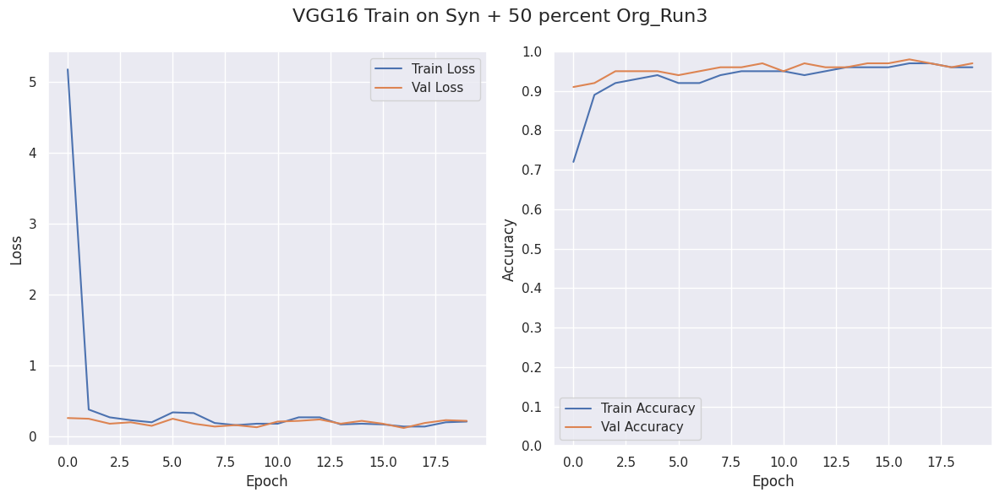

5/5 [==============================] - 1s 190ms/step
{'Test Loss': 2.1062, 'Test Accuracy': 0.8201, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.82, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


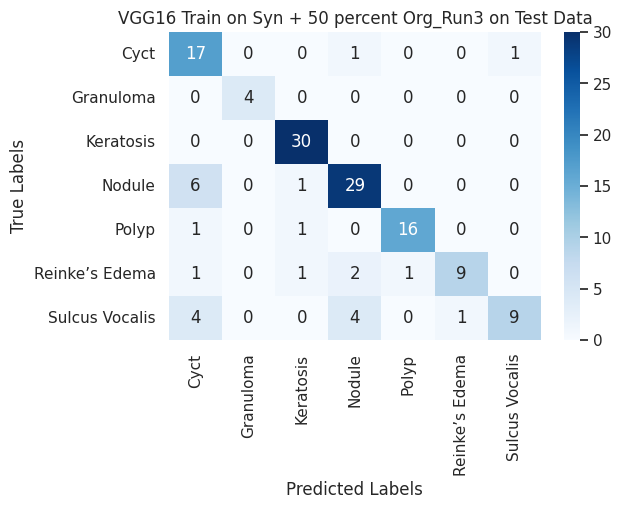

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 294ms/step - loss: 5.2994 - accuracy: 0.7298 - val_loss: 0.4010 - val_accuracy: 0.8939
Epoch 2/20
98/98 [==============================] - 29s 295ms/step - loss: 0.3383 - accuracy: 0.9072 - val_loss: 0.2260 - val_accuracy: 0.9488
Epoch 3/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2919 - accuracy: 0.9267 - val_loss: 0.1602 - val_accuracy: 0.9591
Epoch 4/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2044 - accuracy: 0.9449 - val_loss: 0.1622 - val_accuracy: 0.9629
Epoch 5/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2834 - accuracy: 0.9341 - val_loss: 0.2995 - val_accuracy: 0.9463
Epoch 6/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3525 - accuracy: 0.9312 - val_loss: 0.2211 - val_accuracy: 0.9565
Epoch 7/20
98/98 [===================

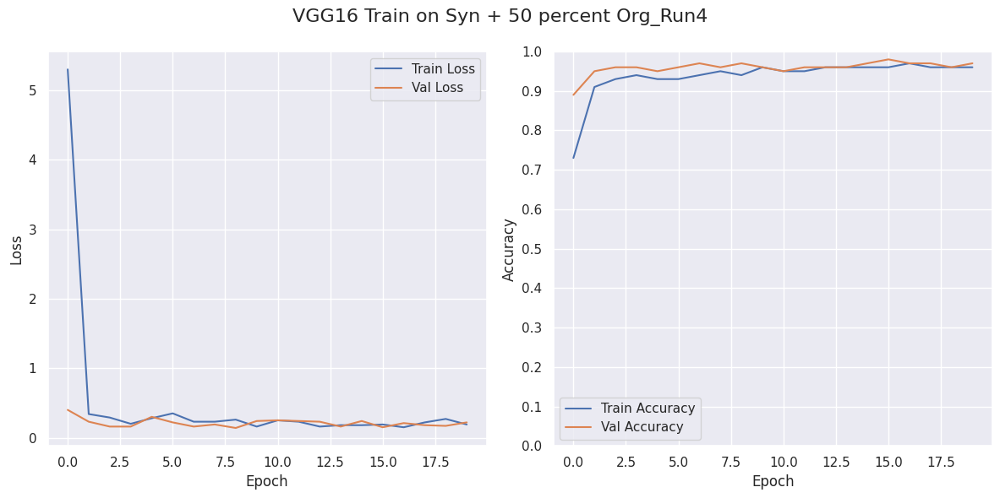

5/5 [==============================] - 1s 190ms/step
{'Test Loss': 1.9157, 'Test Accuracy': 0.8129, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.81, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.97}


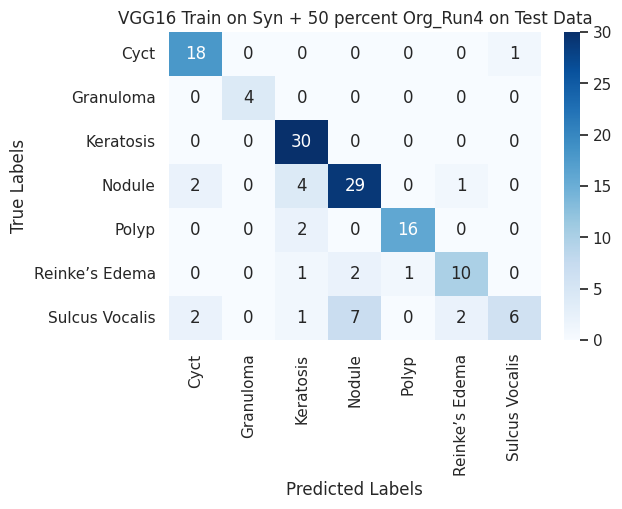

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 293ms/step - loss: 4.8804 - accuracy: 0.7173 - val_loss: 0.2988 - val_accuracy: 0.9003
Epoch 2/20
98/98 [==============================] - 29s 294ms/step - loss: 0.3728 - accuracy: 0.8896 - val_loss: 0.2383 - val_accuracy: 0.9373
Epoch 3/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2805 - accuracy: 0.9193 - val_loss: 0.1830 - val_accuracy: 0.9463
Epoch 4/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2835 - accuracy: 0.9251 - val_loss: 0.2271 - val_accuracy: 0.9501
Epoch 5/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2169 - accuracy: 0.9395 - val_loss: 0.2778 - val_accuracy: 0.9348
Epoch 6/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2342 - accuracy: 0.9427 - val_loss: 0.1521 - val_accuracy: 0.9552
Epoch 7/20
98/98 [===================

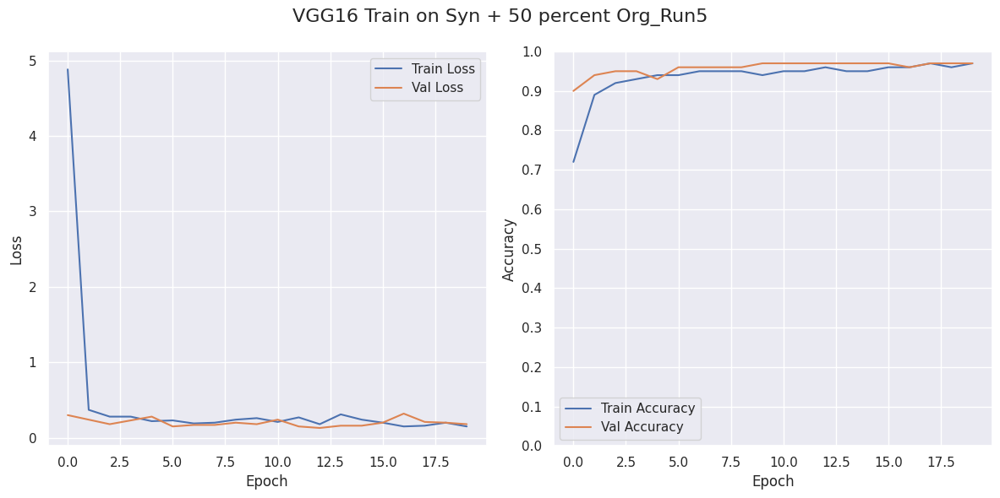

5/5 [==============================] - 1s 192ms/step
{'Test Loss': 0.957, 'Test Accuracy': 0.8561, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87, 'Specificity (With Structural Pathology)': 0.97}


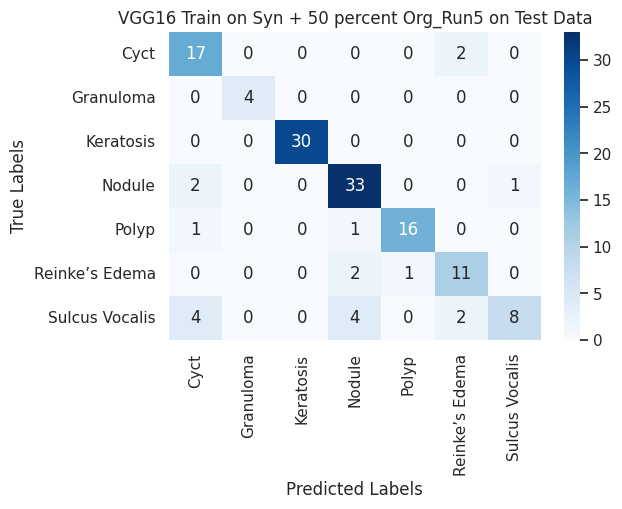

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 292ms/step - loss: 4.9250 - accuracy: 0.7292 - val_loss: 0.3474 - val_accuracy: 0.9105
Epoch 2/20
98/98 [==============================] - 29s 293ms/step - loss: 0.3556 - accuracy: 0.8953 - val_loss: 0.2557 - val_accuracy: 0.9271
Epoch 3/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2607 - accuracy: 0.9273 - val_loss: 0.1739 - val_accuracy: 0.9552
Epoch 4/20
98/98 [==============================] - 29s 293ms/step - loss: 0.1895 - accuracy: 0.9440 - val_loss: 0.2192 - val_accuracy: 0.9425
Epoch 5/20
98/98 [==============================] - 29s 294ms/step - loss: 0.1728 - accuracy: 0.9494 - val_loss: 0.1917 - val_accuracy: 0.9616
Epoch 6/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2318 - accuracy: 0.9437 - val_loss: 0.2573 - val_accuracy: 0.9527
Epoch 7/20
98/98 [===================

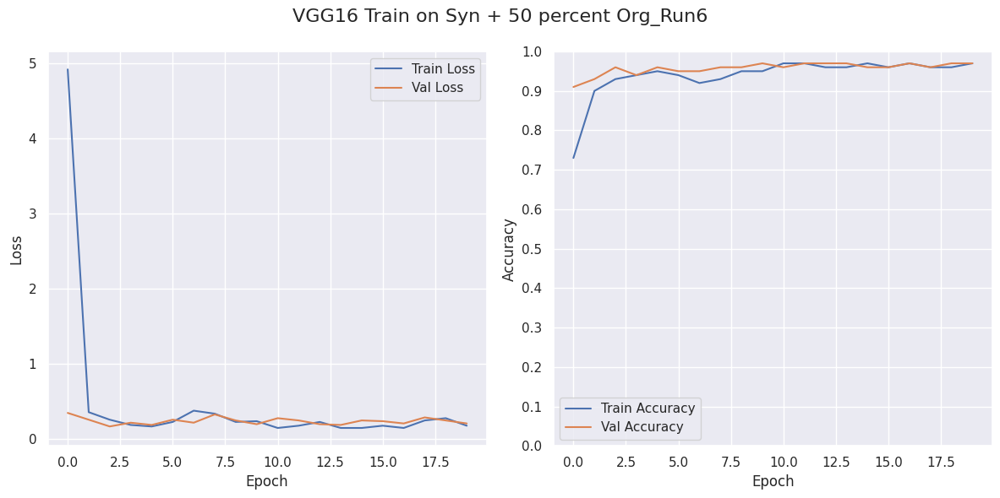

5/5 [==============================] - 1s 194ms/step
{'Test Loss': 2.1981, 'Test Accuracy': 0.8058, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.81, 'Precision': 0.85, 'Specificity (With Structural Pathology)': 0.97}


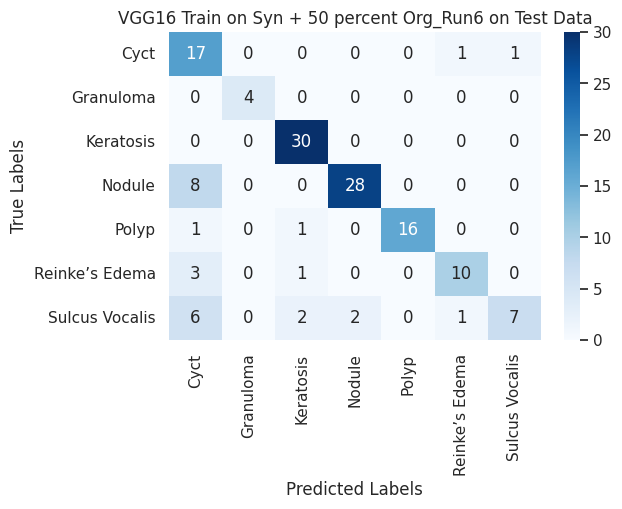

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 30s 294ms/step - loss: 6.1431 - accuracy: 0.7372 - val_loss: 0.5024 - val_accuracy: 0.9156
Epoch 2/20
98/98 [==============================] - 29s 296ms/step - loss: 0.4994 - accuracy: 0.9081 - val_loss: 0.3223 - val_accuracy: 0.9361
Epoch 3/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3121 - accuracy: 0.9357 - val_loss: 0.1971 - val_accuracy: 0.9642
Epoch 4/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2498 - accuracy: 0.9392 - val_loss: 0.4089 - val_accuracy: 0.9399
Epoch 5/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2899 - accuracy: 0.9392 - val_loss: 0.2342 - val_accuracy: 0.9540
Epoch 6/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3262 - accuracy: 0.9369 - val_loss: 0.2763 - val_accuracy: 0.9527
Epoch 7/20
98/98 [===================

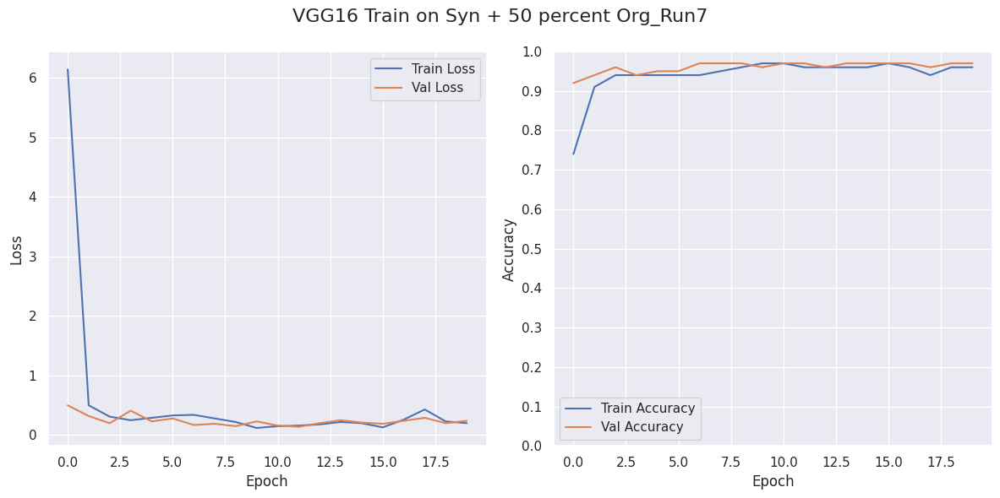

5/5 [==============================] - 1s 190ms/step
{'Test Loss': 2.8232, 'Test Accuracy': 0.8345, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.83, 'Precision': 0.86, 'Specificity (With Structural Pathology)': 0.97}


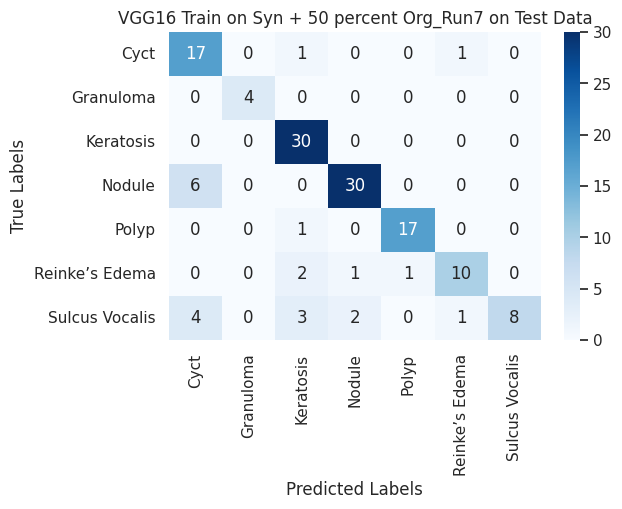

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 294ms/step - loss: 4.6723 - accuracy: 0.7196 - val_loss: 0.3149 - val_accuracy: 0.9130
Epoch 2/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3303 - accuracy: 0.9027 - val_loss: 0.2072 - val_accuracy: 0.9488
Epoch 3/20
98/98 [==============================] - 29s 297ms/step - loss: 0.2354 - accuracy: 0.9353 - val_loss: 0.1664 - val_accuracy: 0.9527
Epoch 4/20
98/98 [==============================] - 29s 296ms/step - loss: 0.2604 - accuracy: 0.9286 - val_loss: 0.1834 - val_accuracy: 0.9604
Epoch 5/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2523 - accuracy: 0.9360 - val_loss: 0.1653 - val_accuracy: 0.9552
Epoch 6/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2628 - accuracy: 0.9289 - val_loss: 0.2832 - val_accuracy: 0.9412
Epoch 7/20
98/98 [===================

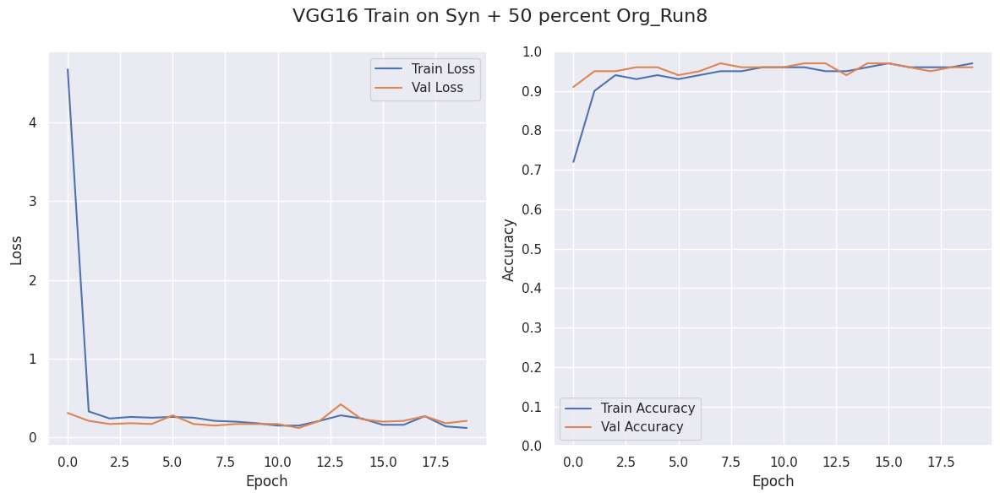

5/5 [==============================] - 1s 189ms/step
{'Test Loss': 1.3426, 'Test Accuracy': 0.8417, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.84, 'Precision': 0.86, 'Specificity (With Structural Pathology)': 0.97}


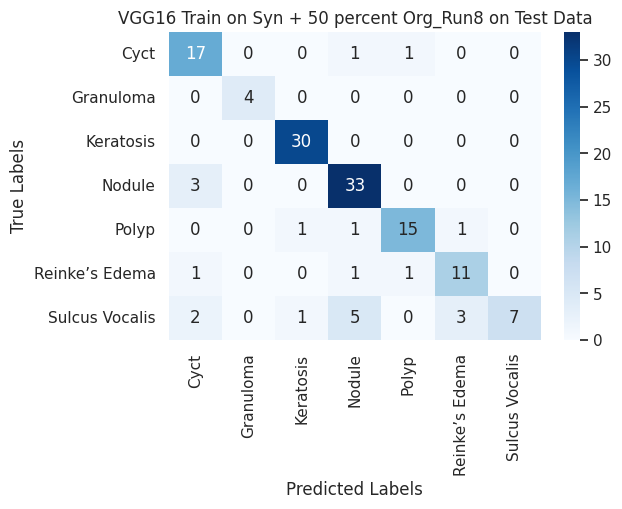

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 292ms/step - loss: 5.3916 - accuracy: 0.7270 - val_loss: 0.3896 - val_accuracy: 0.8913
Epoch 2/20
98/98 [==============================] - 29s 296ms/step - loss: 0.4099 - accuracy: 0.8873 - val_loss: 0.2109 - val_accuracy: 0.9361
Epoch 3/20
98/98 [==============================] - 29s 296ms/step - loss: 0.3182 - accuracy: 0.9213 - val_loss: 0.1688 - val_accuracy: 0.9591
Epoch 4/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2500 - accuracy: 0.9353 - val_loss: 0.1494 - val_accuracy: 0.9616
Epoch 5/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2271 - accuracy: 0.9401 - val_loss: 0.1853 - val_accuracy: 0.9540
Epoch 6/20
98/98 [==============================] - 29s 295ms/step - loss: 0.2217 - accuracy: 0.9449 - val_loss: 0.1982 - val_accuracy: 0.9578
Epoch 7/20
98/98 [===================

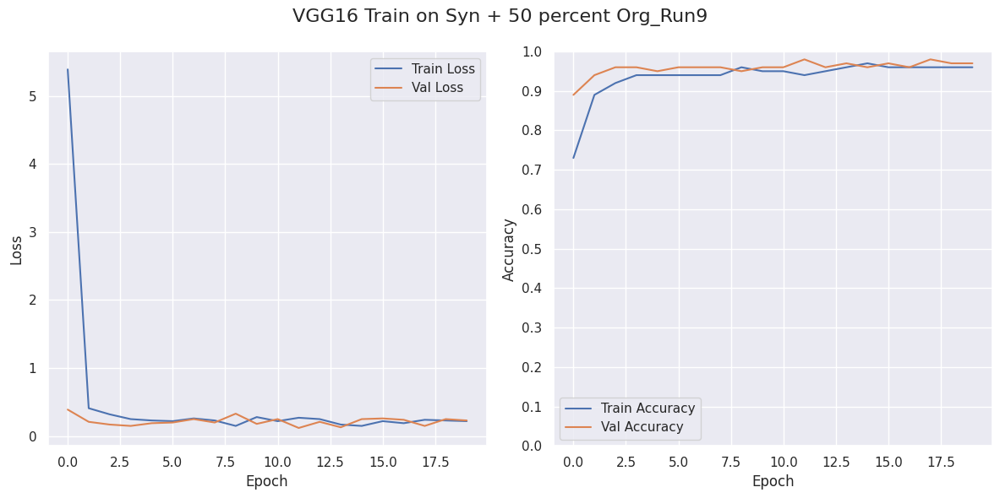

5/5 [==============================] - 1s 194ms/step
{'Test Loss': 1.7094, 'Test Accuracy': 0.8417, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.84, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


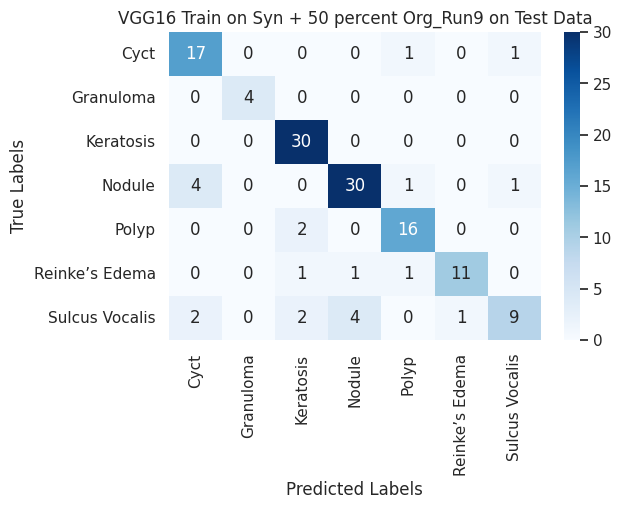

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 29s 292ms/step - loss: 6.0308 - accuracy: 0.7177 - val_loss: 0.2982 - val_accuracy: 0.9194
Epoch 2/20
98/98 [==============================] - 29s 293ms/step - loss: 0.3573 - accuracy: 0.8937 - val_loss: 0.2433 - val_accuracy: 0.9309
Epoch 3/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2652 - accuracy: 0.9238 - val_loss: 0.2040 - val_accuracy: 0.9399
Epoch 4/20
98/98 [==============================] - 29s 294ms/step - loss: 0.1922 - accuracy: 0.9405 - val_loss: 0.1969 - val_accuracy: 0.9552
Epoch 5/20
98/98 [==============================] - 29s 294ms/step - loss: 0.1941 - accuracy: 0.9449 - val_loss: 0.2209 - val_accuracy: 0.9578
Epoch 6/20
98/98 [==============================] - 29s 294ms/step - loss: 0.2529 - accuracy: 0.9401 - val_loss: 0.1879 - val_accuracy: 0.9706
Epoch 7/20
98/98 [===================

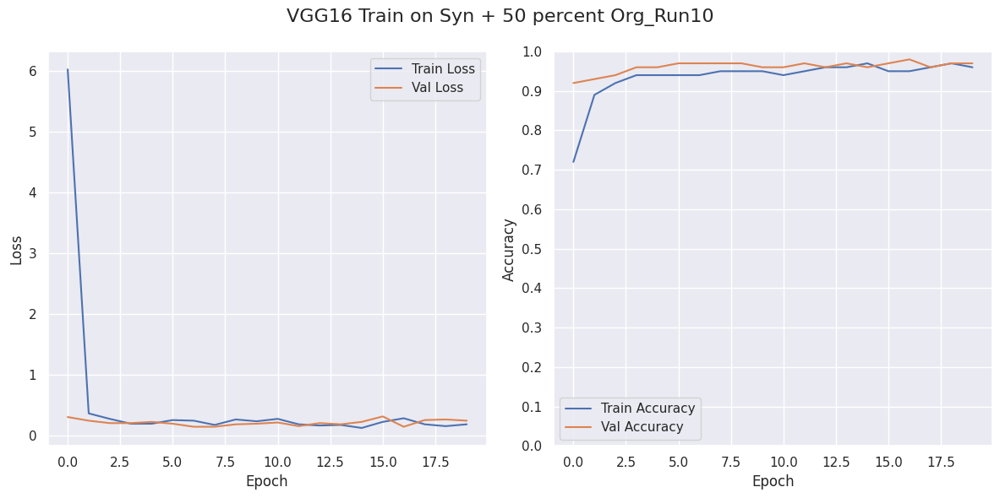

5/5 [==============================] - 1s 194ms/step
{'Test Loss': 1.3144, 'Test Accuracy': 0.8633, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87, 'Specificity (With Structural Pathology)': 0.97}


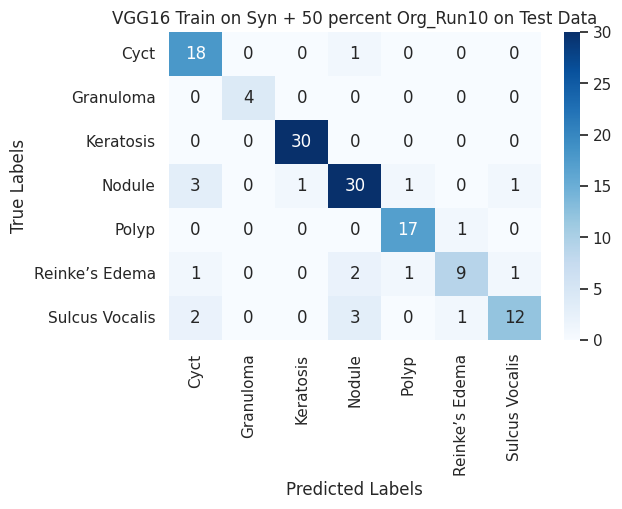

In [11]:
dataset_dir_org = f'{path_dir}/50_percent/Original'
dataset_dir_ddpm = f'{path_dir}/50_percent/Generated_CLEAN_1'

title = "VGG16 Train on Syn + 50 percent Org"
file_name = f"{path_dir}/Trained_Models/VGG16_Synthetic_50percent_Original.png"

n=10
epochs=20
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

## Resnet50

#### Train on Syn and test on entire Original Dataset


Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 212ms/step - loss: 4.5840 - accuracy: 0.6950 - val_loss: 0.2608 - val_accuracy: 0.9224
Epoch 2/20
95/95 [==============================] - 19s 198ms/step - loss: 0.3216 - accuracy: 0.8897 - val_loss: 0.1916 - val_accuracy: 0.9368
Epoch 3/20
95/95 [==============================] - 19s 197ms/step - loss: 0.2632 - accuracy: 0.9107 - val_loss: 0.1471 - val_accuracy: 0.9487
Epoch 4/20
95/95 [==============================] - 19s 198ms/step - loss: 0.1613 - accuracy: 0.9427 - val_loss: 0.1523 - val_accuracy: 0.9553
Epoch 5/20
95/95 [==============================] - 19s 202ms/step - loss: 0.1625 - accuracy: 0.9443 - val_loss: 0.1555 - val_accuracy: 0.9632
Epoch 6/20
95/95 [==============================] - 19s 202ms/step - loss: 0.1621 - accuracy: 0.9437 - val_loss: 0.1294 - val_accuracy: 0.9671
Epoch 7/20
95/95 [===================

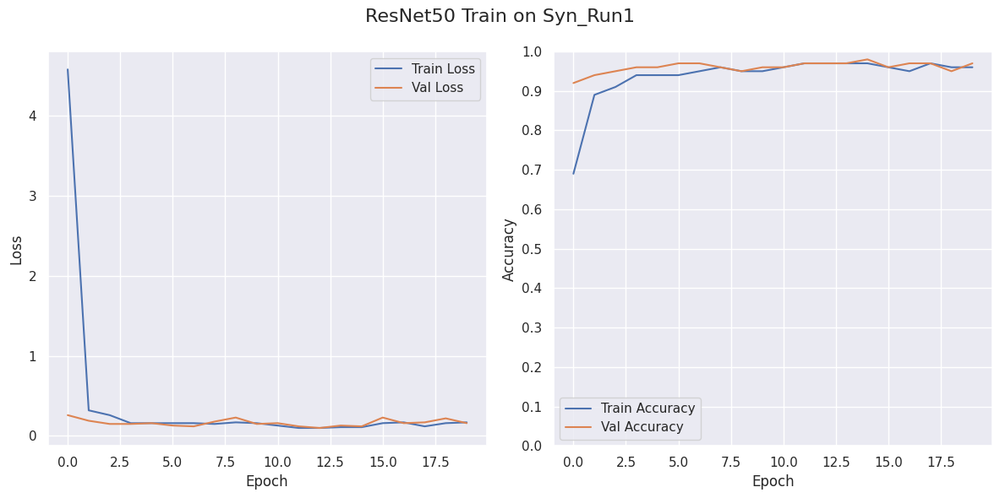

8/8 [==============================] - 2s 128ms/step
{'Test Loss': 1.839, 'Test Accuracy': 0.7449, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.74, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.96}


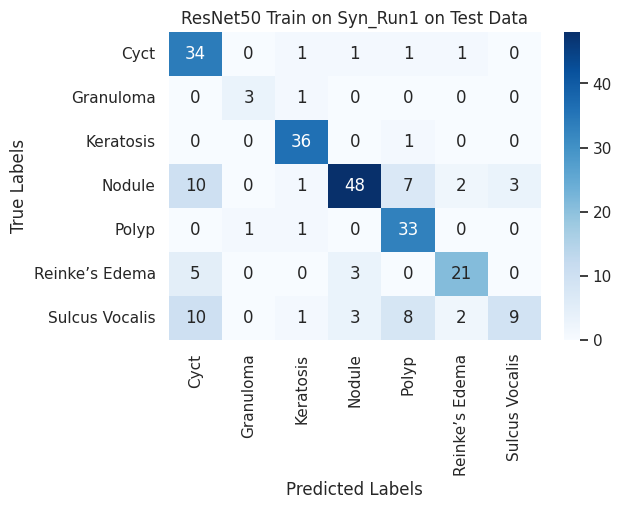

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 211ms/step - loss: 4.0288 - accuracy: 0.7164 - val_loss: 0.2442 - val_accuracy: 0.9132
Epoch 2/20
95/95 [==============================] - 19s 199ms/step - loss: 0.3125 - accuracy: 0.8989 - val_loss: 0.2082 - val_accuracy: 0.9382
Epoch 3/20
95/95 [==============================] - 19s 203ms/step - loss: 0.2002 - accuracy: 0.9318 - val_loss: 0.2344 - val_accuracy: 0.9368
Epoch 4/20
95/95 [==============================] - 19s 203ms/step - loss: 0.1687 - accuracy: 0.9493 - val_loss: 0.2106 - val_accuracy: 0.9526
Epoch 5/20
95/95 [==============================] - 19s 204ms/step - loss: 0.1283 - accuracy: 0.9569 - val_loss: 0.1364 - val_accuracy: 0.9618
Epoch 6/20
95/95 [==============================] - 19s 205ms/step - loss: 0.1580 - accuracy: 0.9496 - val_loss: 0.1762 - val_accuracy: 0.9592
Epoch 7/20
95/95 [===================

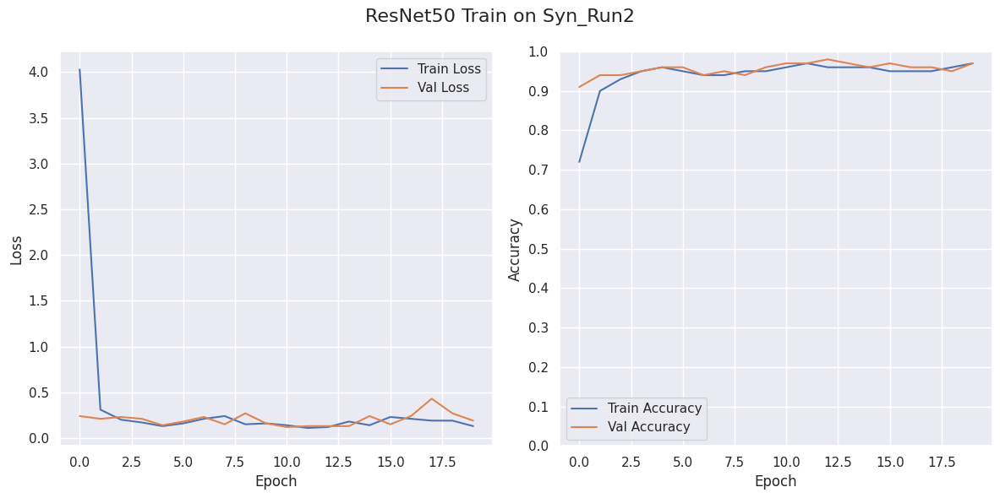

8/8 [==============================] - 2s 130ms/step
{'Test Loss': 1.9767, 'Test Accuracy': 0.7652, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.77, 'Precision': 0.78, 'Specificity (With Structural Pathology)': 0.96}


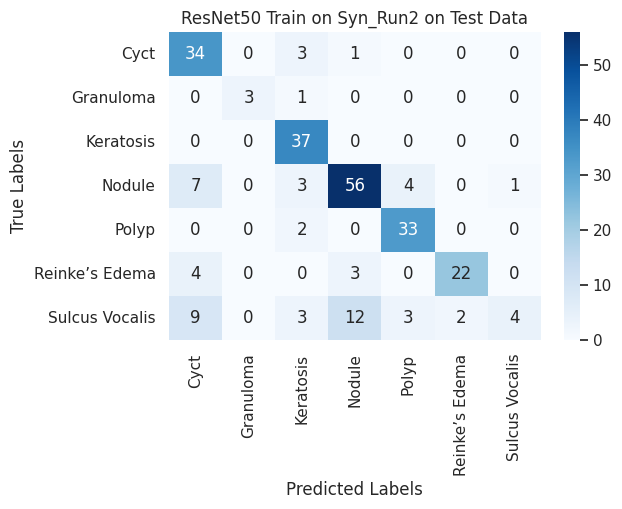

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 215ms/step - loss: 3.4641 - accuracy: 0.6845 - val_loss: 0.3720 - val_accuracy: 0.8829
Epoch 2/20
95/95 [==============================] - 19s 202ms/step - loss: 0.3972 - accuracy: 0.8709 - val_loss: 0.2879 - val_accuracy: 0.9118
Epoch 3/20
95/95 [==============================] - 19s 203ms/step - loss: 0.2508 - accuracy: 0.9153 - val_loss: 0.2865 - val_accuracy: 0.9316
Epoch 4/20
95/95 [==============================] - 20s 206ms/step - loss: 0.2082 - accuracy: 0.9325 - val_loss: 0.1706 - val_accuracy: 0.9566
Epoch 5/20
95/95 [==============================] - 19s 205ms/step - loss: 0.1797 - accuracy: 0.9417 - val_loss: 0.1400 - val_accuracy: 0.9553
Epoch 6/20
95/95 [==============================] - 20s 209ms/step - loss: 0.2376 - accuracy: 0.9295 - val_loss: 0.2036 - val_accuracy: 0.9513
Epoch 7/20
95/95 [===================

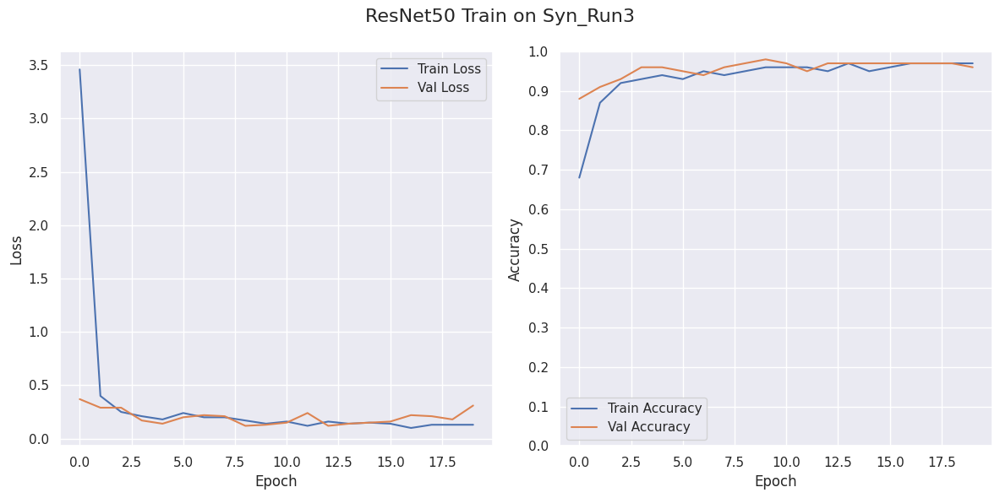

8/8 [==============================] - 2s 125ms/step
{'Test Loss': 2.0544, 'Test Accuracy': 0.7368, 'F1 Score': 0.72, 'Sensitivity (Recall)': 0.74, 'Precision': 0.76, 'Specificity (With Structural Pathology)': 0.96}


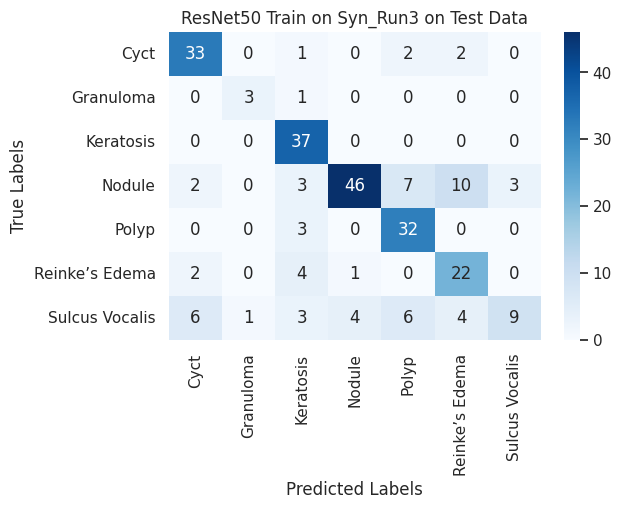

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 24s 216ms/step - loss: 4.1336 - accuracy: 0.7042 - val_loss: 0.2405 - val_accuracy: 0.9250
Epoch 2/20
95/95 [==============================] - 19s 204ms/step - loss: 0.3115 - accuracy: 0.8953 - val_loss: 0.2380 - val_accuracy: 0.9355
Epoch 3/20
95/95 [==============================] - 20s 208ms/step - loss: 0.2294 - accuracy: 0.9302 - val_loss: 0.1808 - val_accuracy: 0.9539
Epoch 4/20
95/95 [==============================] - 20s 208ms/step - loss: 0.1929 - accuracy: 0.9424 - val_loss: 0.1795 - val_accuracy: 0.9592
Epoch 5/20
95/95 [==============================] - 20s 209ms/step - loss: 0.1791 - accuracy: 0.9483 - val_loss: 0.1951 - val_accuracy: 0.9474
Epoch 6/20
95/95 [==============================] - 20s 211ms/step - loss: 0.1847 - accuracy: 0.9407 - val_loss: 0.1866 - val_accuracy: 0.9553
Epoch 7/20
95/95 [===================

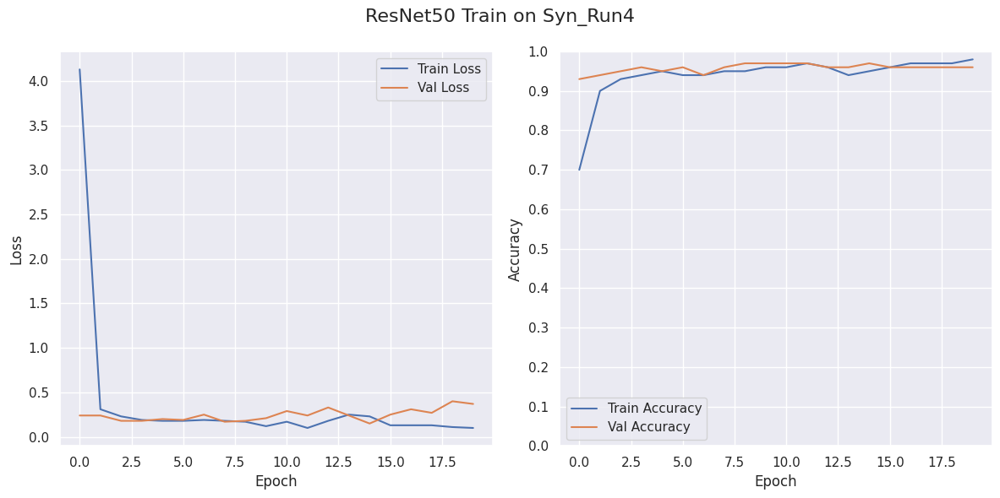

8/8 [==============================] - 2s 125ms/step
{'Test Loss': 2.1534, 'Test Accuracy': 0.7287, 'F1 Score': 0.7, 'Sensitivity (Recall)': 0.73, 'Precision': 0.76, 'Specificity (With Structural Pathology)': 0.95}


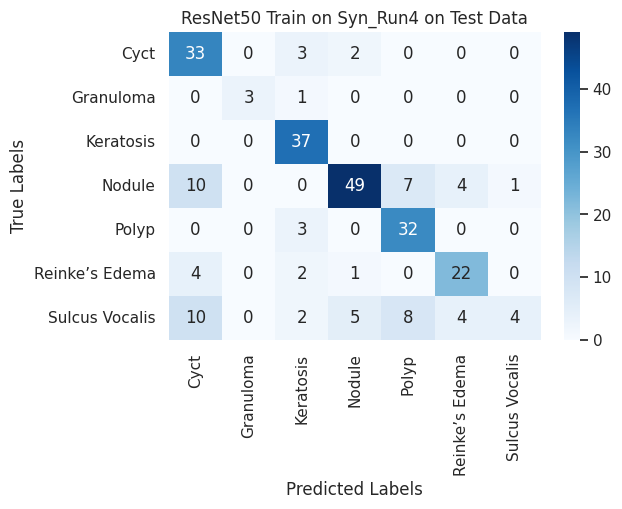

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 215ms/step - loss: 4.8596 - accuracy: 0.6976 - val_loss: 0.2572 - val_accuracy: 0.9013
Epoch 2/20
95/95 [==============================] - 19s 205ms/step - loss: 0.3155 - accuracy: 0.8972 - val_loss: 0.2005 - val_accuracy: 0.9342
Epoch 3/20
95/95 [==============================] - 20s 207ms/step - loss: 0.2146 - accuracy: 0.9275 - val_loss: 0.1865 - val_accuracy: 0.9395
Epoch 4/20
95/95 [==============================] - 20s 209ms/step - loss: 0.2014 - accuracy: 0.9361 - val_loss: 0.1948 - val_accuracy: 0.9434
Epoch 5/20
95/95 [==============================] - 20s 208ms/step - loss: 0.1739 - accuracy: 0.9503 - val_loss: 0.2055 - val_accuracy: 0.9539
Epoch 6/20
95/95 [==============================] - 20s 208ms/step - loss: 0.1480 - accuracy: 0.9522 - val_loss: 0.2036 - val_accuracy: 0.9539
Epoch 7/20
95/95 [===================

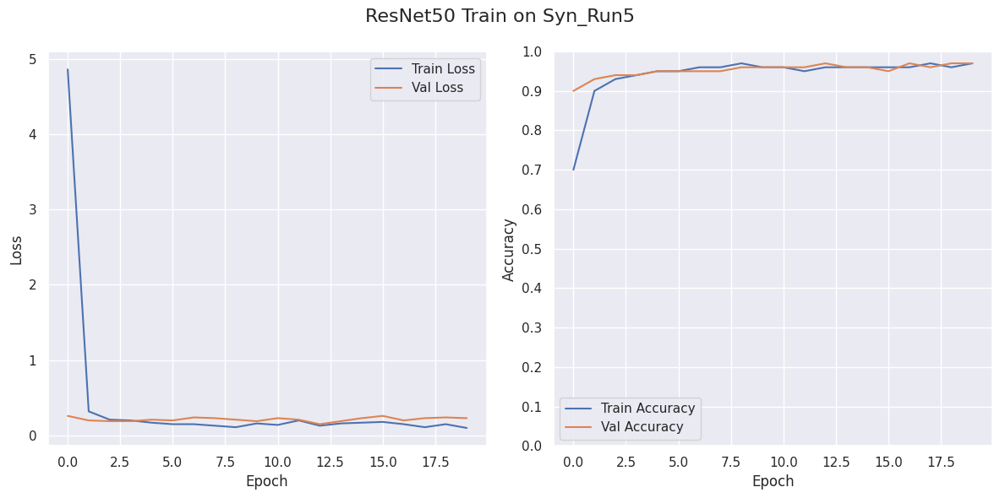

8/8 [==============================] - 2s 135ms/step
{'Test Loss': 2.3344, 'Test Accuracy': 0.7692, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.77, 'Precision': 0.78, 'Specificity (With Structural Pathology)': 0.96}


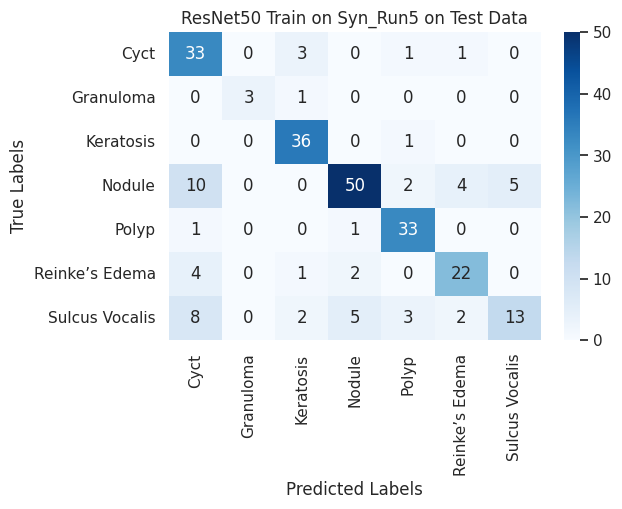

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 211ms/step - loss: 4.3381 - accuracy: 0.7128 - val_loss: 0.2223 - val_accuracy: 0.9316
Epoch 2/20
95/95 [==============================] - 19s 200ms/step - loss: 0.3089 - accuracy: 0.8926 - val_loss: 0.1995 - val_accuracy: 0.9368
Epoch 3/20
95/95 [==============================] - 19s 201ms/step - loss: 0.1671 - accuracy: 0.9443 - val_loss: 0.1550 - val_accuracy: 0.9579
Epoch 4/20
95/95 [==============================] - 19s 198ms/step - loss: 0.1552 - accuracy: 0.9440 - val_loss: 0.1783 - val_accuracy: 0.9461
Epoch 5/20
95/95 [==============================] - 19s 201ms/step - loss: 0.1354 - accuracy: 0.9542 - val_loss: 0.1442 - val_accuracy: 0.9605
Epoch 6/20
95/95 [==============================] - 19s 205ms/step - loss: 0.1522 - accuracy: 0.9555 - val_loss: 0.1295 - val_accuracy: 0.9539
Epoch 7/20
95/95 [===================

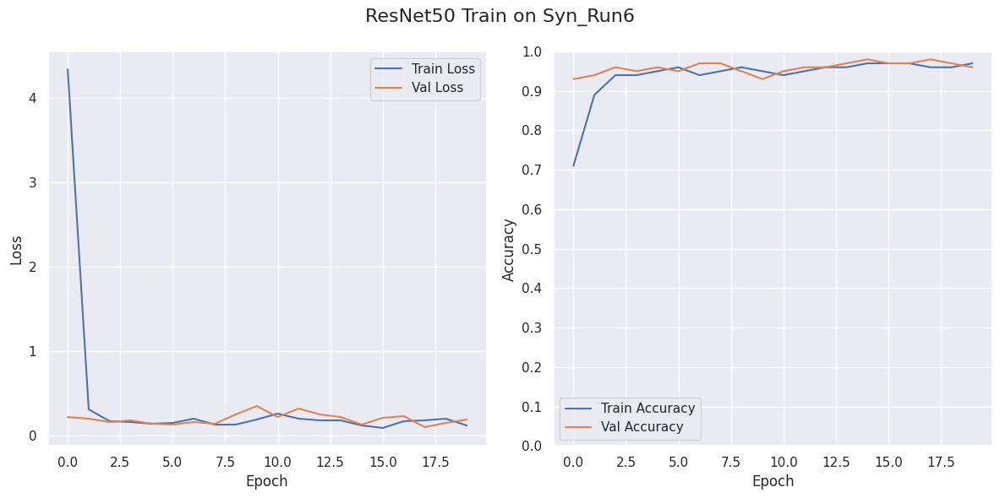

8/8 [==============================] - 2s 124ms/step
{'Test Loss': 1.7123, 'Test Accuracy': 0.753, 'F1 Score': 0.74, 'Sensitivity (Recall)': 0.75, 'Precision': 0.79, 'Specificity (With Structural Pathology)': 0.96}


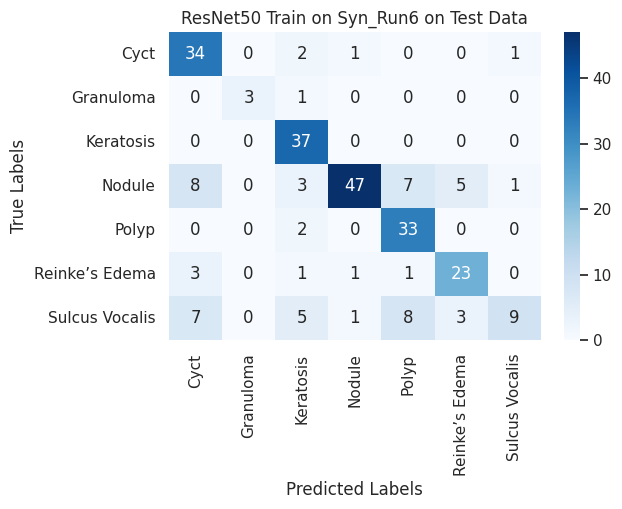

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 214ms/step - loss: 4.8348 - accuracy: 0.6999 - val_loss: 0.2991 - val_accuracy: 0.8961
Epoch 2/20
95/95 [==============================] - 19s 201ms/step - loss: 0.2998 - accuracy: 0.8986 - val_loss: 0.2557 - val_accuracy: 0.9382
Epoch 3/20
95/95 [==============================] - 19s 205ms/step - loss: 0.2171 - accuracy: 0.9295 - val_loss: 0.1245 - val_accuracy: 0.9553
Epoch 4/20
95/95 [==============================] - 19s 205ms/step - loss: 0.1638 - accuracy: 0.9437 - val_loss: 0.1891 - val_accuracy: 0.9539
Epoch 5/20
95/95 [==============================] - 20s 206ms/step - loss: 0.1677 - accuracy: 0.9476 - val_loss: 0.1483 - val_accuracy: 0.9566
Epoch 6/20
95/95 [==============================] - 20s 209ms/step - loss: 0.1932 - accuracy: 0.9463 - val_loss: 0.2015 - val_accuracy: 0.9592
Epoch 7/20
95/95 [===================

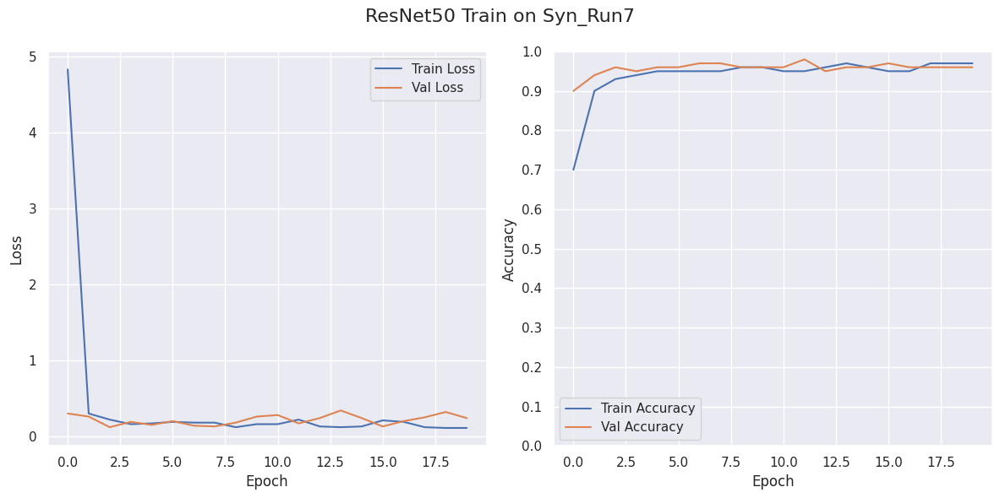

8/8 [==============================] - 2s 129ms/step
{'Test Loss': 1.9489, 'Test Accuracy': 0.749, 'F1 Score': 0.74, 'Sensitivity (Recall)': 0.75, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.96}


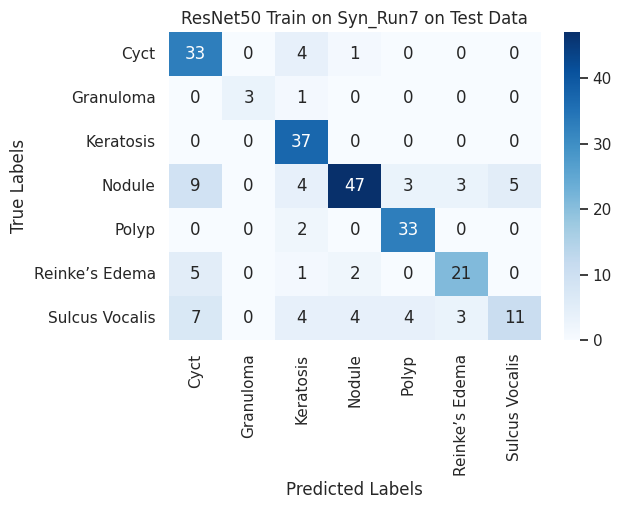

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 218ms/step - loss: 3.9847 - accuracy: 0.7121 - val_loss: 0.2999 - val_accuracy: 0.8908
Epoch 2/20
95/95 [==============================] - 19s 203ms/step - loss: 0.3127 - accuracy: 0.8989 - val_loss: 0.2748 - val_accuracy: 0.9066
Epoch 3/20
95/95 [==============================] - 19s 203ms/step - loss: 0.2742 - accuracy: 0.9216 - val_loss: 0.2329 - val_accuracy: 0.9447
Epoch 4/20
95/95 [==============================] - 19s 202ms/step - loss: 0.1868 - accuracy: 0.9433 - val_loss: 0.2089 - val_accuracy: 0.9513
Epoch 5/20
95/95 [==============================] - 19s 205ms/step - loss: 0.2062 - accuracy: 0.9387 - val_loss: 0.2359 - val_accuracy: 0.9553
Epoch 6/20
95/95 [==============================] - 19s 206ms/step - loss: 0.2932 - accuracy: 0.9272 - val_loss: 0.2850 - val_accuracy: 0.9395
Epoch 7/20
95/95 [===================

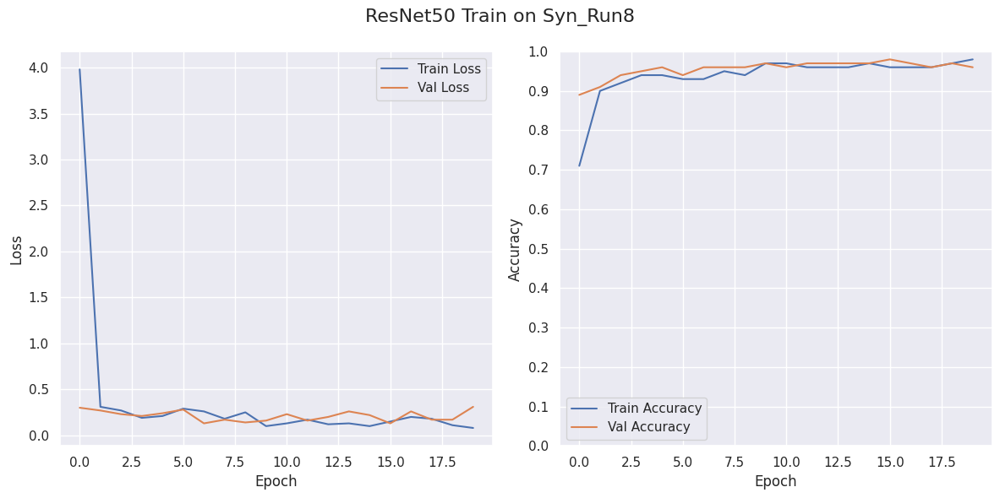

8/8 [==============================] - 2s 129ms/step
{'Test Loss': 3.4912, 'Test Accuracy': 0.6883, 'F1 Score': 0.67, 'Sensitivity (Recall)': 0.69, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.95}


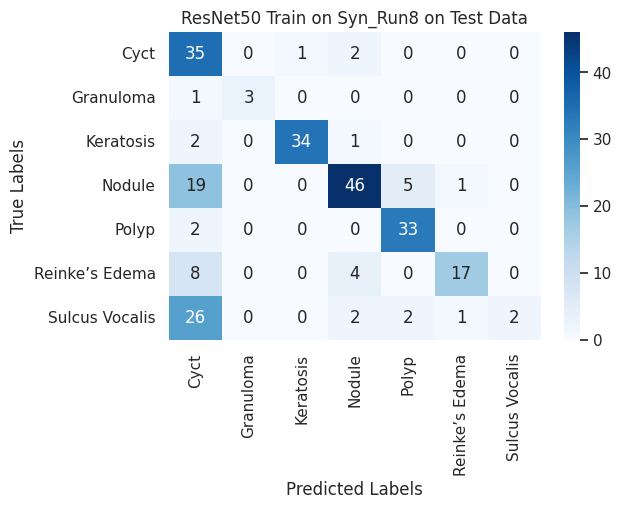

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 213ms/step - loss: 4.1723 - accuracy: 0.6729 - val_loss: 0.2791 - val_accuracy: 0.9053
Epoch 2/20
95/95 [==============================] - 19s 203ms/step - loss: 0.4060 - accuracy: 0.8607 - val_loss: 0.2058 - val_accuracy: 0.9263
Epoch 3/20
95/95 [==============================] - 19s 203ms/step - loss: 0.2762 - accuracy: 0.9048 - val_loss: 0.1853 - val_accuracy: 0.9342
Epoch 4/20
95/95 [==============================] - 19s 204ms/step - loss: 0.2167 - accuracy: 0.9213 - val_loss: 0.1900 - val_accuracy: 0.9461
Epoch 5/20
95/95 [==============================] - 20s 208ms/step - loss: 0.1739 - accuracy: 0.9384 - val_loss: 0.1652 - val_accuracy: 0.9579
Epoch 6/20
95/95 [==============================] - 20s 210ms/step - loss: 0.1615 - accuracy: 0.9440 - val_loss: 0.1416 - val_accuracy: 0.9618
Epoch 7/20
95/95 [===================

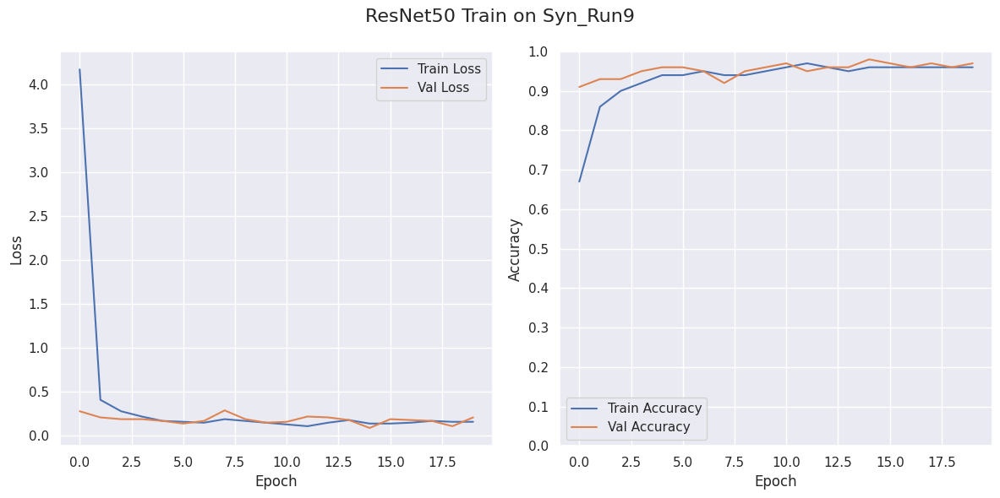

8/8 [==============================] - 2s 124ms/step
{'Test Loss': 2.1856, 'Test Accuracy': 0.749, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.75, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.96}


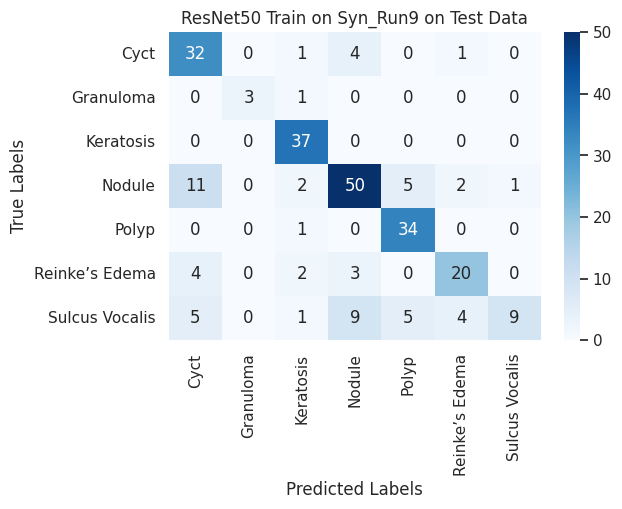

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
95/95 [==============================] - 23s 216ms/step - loss: 3.9210 - accuracy: 0.7075 - val_loss: 0.3171 - val_accuracy: 0.8947
Epoch 2/20
95/95 [==============================] - 19s 204ms/step - loss: 0.3149 - accuracy: 0.8913 - val_loss: 0.1859 - val_accuracy: 0.9395
Epoch 3/20
95/95 [==============================] - 19s 198ms/step - loss: 0.2309 - accuracy: 0.9265 - val_loss: 0.2174 - val_accuracy: 0.9342
Epoch 4/20
95/95 [==============================] - 19s 200ms/step - loss: 0.1657 - accuracy: 0.9404 - val_loss: 0.2152 - val_accuracy: 0.9526
Epoch 5/20
95/95 [==============================] - 19s 200ms/step - loss: 0.1360 - accuracy: 0.9542 - val_loss: 0.1288 - val_accuracy: 0.9658
Epoch 6/20
95/95 [==============================] - 19s 203ms/step - loss: 0.1947 - accuracy: 0.9453 - val_loss: 0.2594 - val_accuracy: 0.9500
Epoch 7/20
95/95 [===================

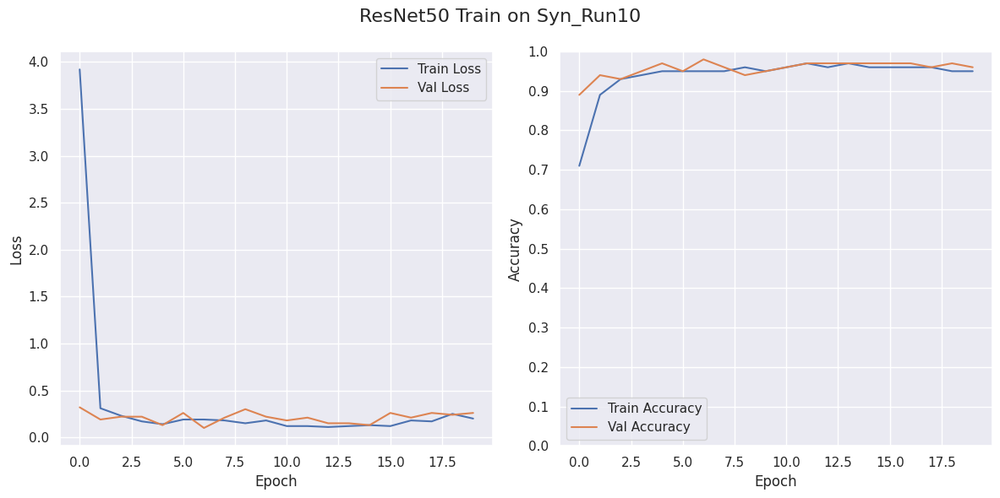

8/8 [==============================] - 2s 134ms/step
{'Test Loss': 2.5979, 'Test Accuracy': 0.7206, 'F1 Score': 0.68, 'Sensitivity (Recall)': 0.72, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.95}


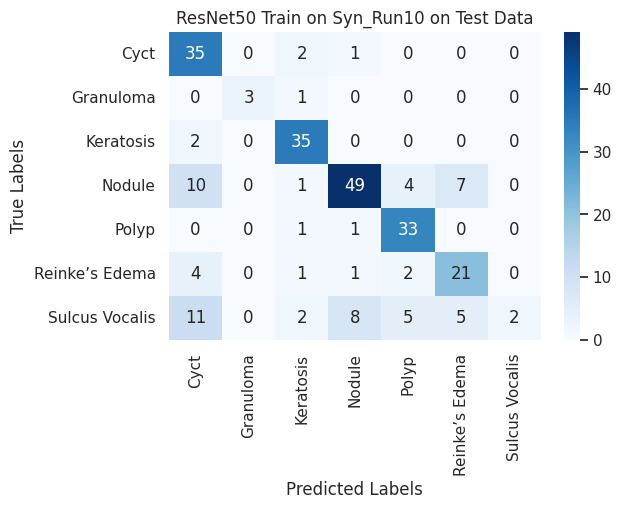

In [12]:
dataset_dir_org = f'{path_dir}/Original'
dataset_dir_ddpm = f'{path_dir}/Generated_CLEAN_1'

title = "ResNet50 Train on Syn"
file_name = f"{path_dir}/Trained_Models/VGG16_Synthetic.png"

epochs=20
cv = 1
n=10
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        resnet_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 10 percent of Original Dataset


Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 215ms/step - loss: 5.7656 - accuracy: 0.6999 - val_loss: 0.3082 - val_accuracy: 0.8850
Epoch 2/20
96/96 [==============================] - 19s 203ms/step - loss: 0.2901 - accuracy: 0.8954 - val_loss: 0.2027 - val_accuracy: 0.9451
Epoch 3/20
96/96 [==============================] - 19s 203ms/step - loss: 0.2462 - accuracy: 0.9215 - val_loss: 0.1588 - val_accuracy: 0.9595
Epoch 4/20
96/96 [==============================] - 20s 205ms/step - loss: 0.1889 - accuracy: 0.9382 - val_loss: 0.1427 - val_accuracy: 0.9634
Epoch 5/20
96/96 [==============================] - 20s 207ms/step - loss: 0.1609 - accuracy: 0.9490 - val_loss: 0.1345 - val_accuracy: 0.9582
Epoch 6/20
96/96 [==============================] - 20s 208ms/step - loss: 0.1125 - accuracy: 0.9585 - val_loss: 0.1087 - val_accuracy: 0.9712
Epoch 7/20
96/96 [===================

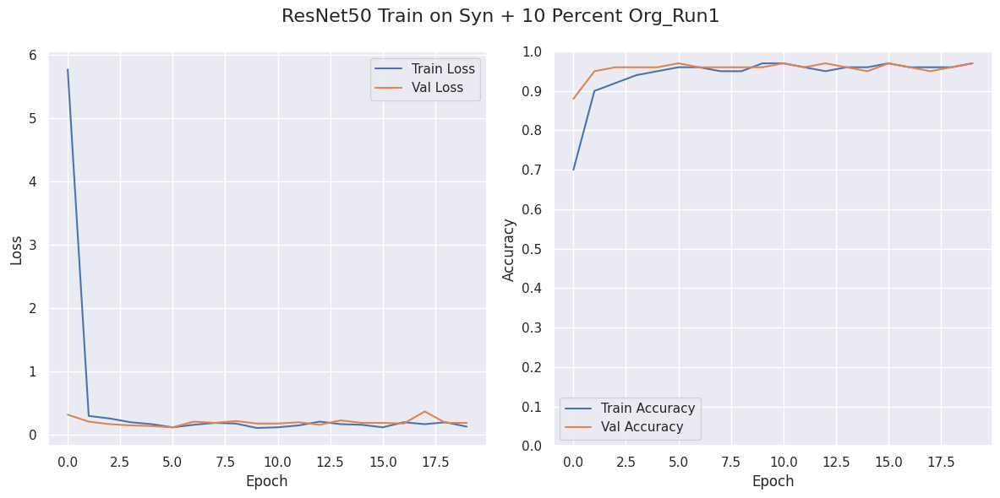

7/7 [==============================] - 2s 128ms/step
{'Test Loss': 2.452, 'Test Accuracy': 0.7352, 'F1 Score': 0.71, 'Sensitivity (Recall)': 0.74, 'Precision': 0.76, 'Specificity (With Structural Pathology)': 0.95}


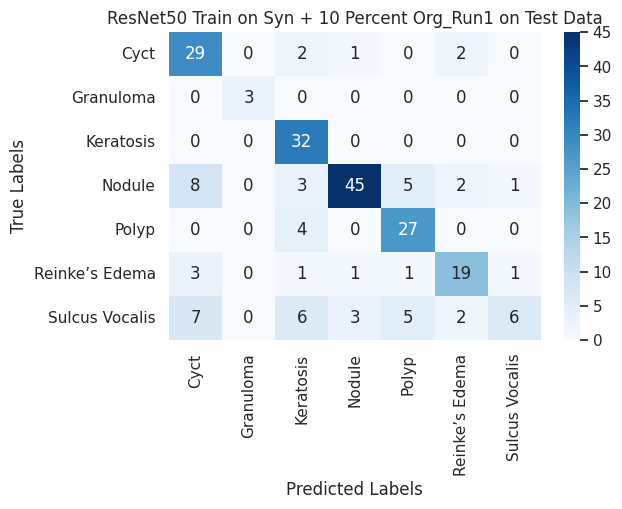

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 213ms/step - loss: 5.1529 - accuracy: 0.6617 - val_loss: 0.3343 - val_accuracy: 0.8810
Epoch 2/20
96/96 [==============================] - 19s 201ms/step - loss: 0.4026 - accuracy: 0.8565 - val_loss: 0.1843 - val_accuracy: 0.9425
Epoch 3/20
96/96 [==============================] - 20s 205ms/step - loss: 0.2364 - accuracy: 0.9176 - val_loss: 0.1434 - val_accuracy: 0.9556
Epoch 4/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1834 - accuracy: 0.9405 - val_loss: 0.1528 - val_accuracy: 0.9529
Epoch 5/20
96/96 [==============================] - 20s 209ms/step - loss: 0.2047 - accuracy: 0.9330 - val_loss: 0.1218 - val_accuracy: 0.9595
Epoch 6/20
96/96 [==============================] - 20s 210ms/step - loss: 0.1534 - accuracy: 0.9467 - val_loss: 0.1504 - val_accuracy: 0.9621
Epoch 7/20
96/96 [===================

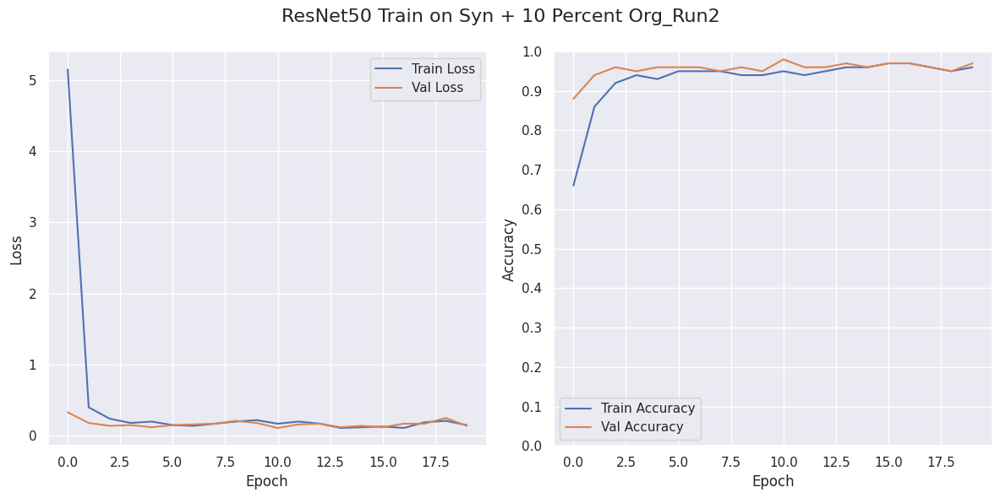

7/7 [==============================] - 2s 136ms/step
{'Test Loss': 1.2506, 'Test Accuracy': 0.7991, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.97}


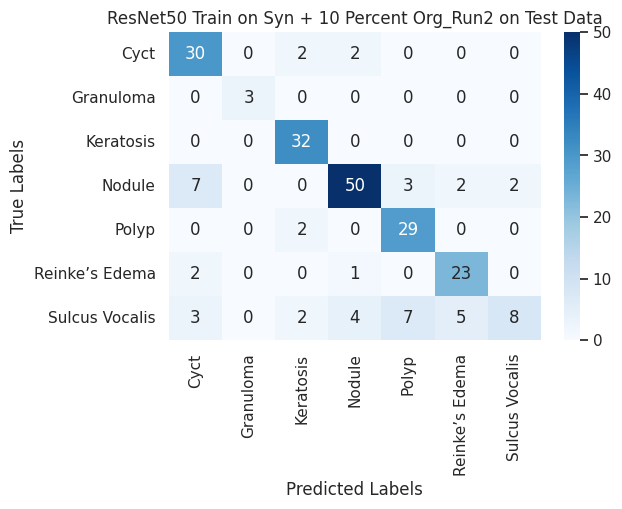

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 24s 219ms/step - loss: 4.4097 - accuracy: 0.6770 - val_loss: 0.3489 - val_accuracy: 0.8902
Epoch 2/20
96/96 [==============================] - 20s 205ms/step - loss: 0.3544 - accuracy: 0.8771 - val_loss: 0.1753 - val_accuracy: 0.9451
Epoch 3/20
96/96 [==============================] - 20s 209ms/step - loss: 0.2405 - accuracy: 0.9144 - val_loss: 0.1344 - val_accuracy: 0.9569
Epoch 4/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1687 - accuracy: 0.9385 - val_loss: 0.1897 - val_accuracy: 0.9582
Epoch 5/20
96/96 [==============================] - 20s 211ms/step - loss: 0.1819 - accuracy: 0.9474 - val_loss: 0.1607 - val_accuracy: 0.9477
Epoch 6/20
96/96 [==============================] - 20s 212ms/step - loss: 0.1720 - accuracy: 0.9418 - val_loss: 0.1159 - val_accuracy: 0.9686
Epoch 7/20
96/96 [===================

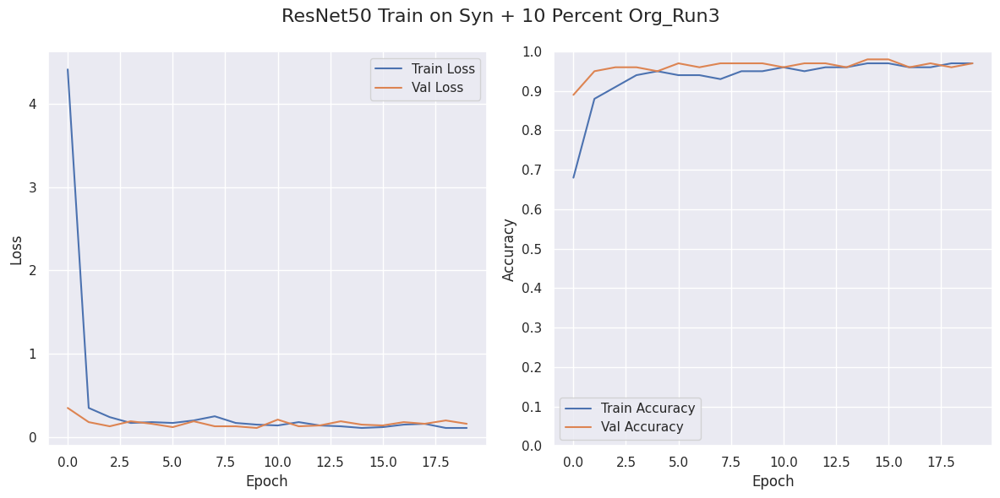

7/7 [==============================] - 2s 131ms/step
{'Test Loss': 2.0555, 'Test Accuracy': 0.7443, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.74, 'Precision': 0.74, 'Specificity (With Structural Pathology)': 0.96}


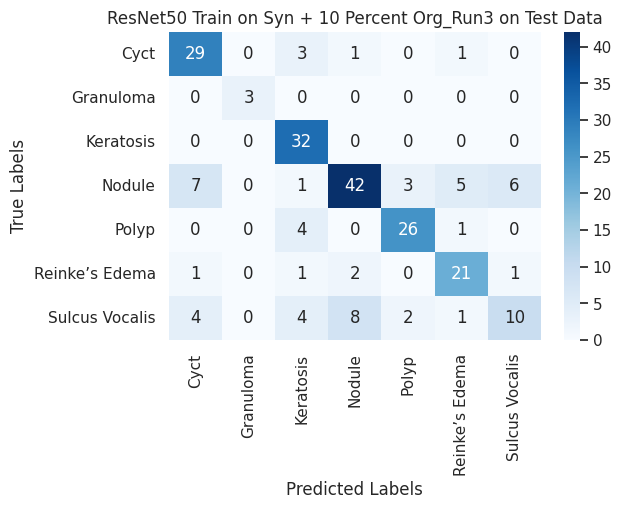

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 214ms/step - loss: 5.3689 - accuracy: 0.6806 - val_loss: 0.3248 - val_accuracy: 0.8993
Epoch 2/20
96/96 [==============================] - 20s 204ms/step - loss: 0.3197 - accuracy: 0.8889 - val_loss: 0.1832 - val_accuracy: 0.9399
Epoch 3/20
96/96 [==============================] - 20s 207ms/step - loss: 0.2210 - accuracy: 0.9179 - val_loss: 0.1732 - val_accuracy: 0.9542
Epoch 4/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1874 - accuracy: 0.9402 - val_loss: 0.1873 - val_accuracy: 0.9503
Epoch 5/20
96/96 [==============================] - 20s 208ms/step - loss: 0.1592 - accuracy: 0.9506 - val_loss: 0.1203 - val_accuracy: 0.9725
Epoch 6/20
96/96 [==============================] - 20s 210ms/step - loss: 0.1523 - accuracy: 0.9526 - val_loss: 0.1466 - val_accuracy: 0.9516
Epoch 7/20
96/96 [===================

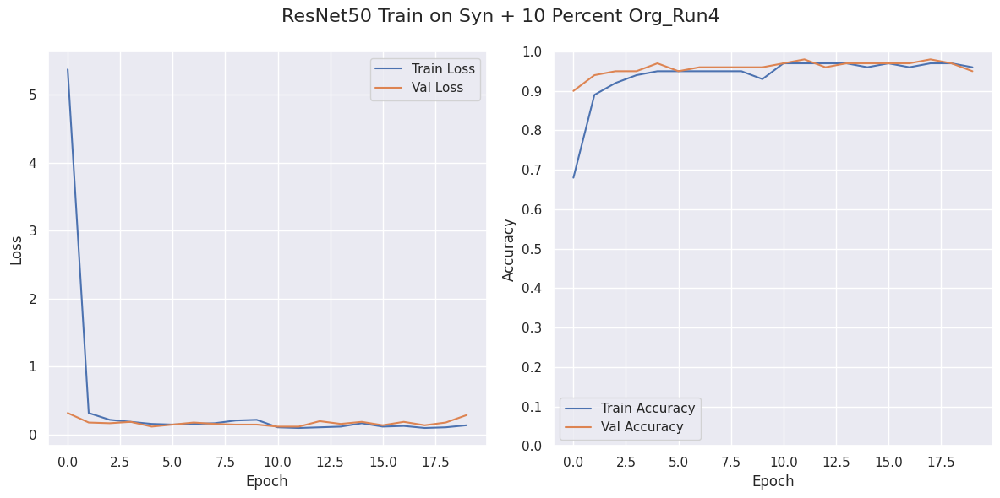

7/7 [==============================] - 2s 128ms/step
{'Test Loss': 1.7396, 'Test Accuracy': 0.7671, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.77, 'Precision': 0.8, 'Specificity (With Structural Pathology)': 0.96}


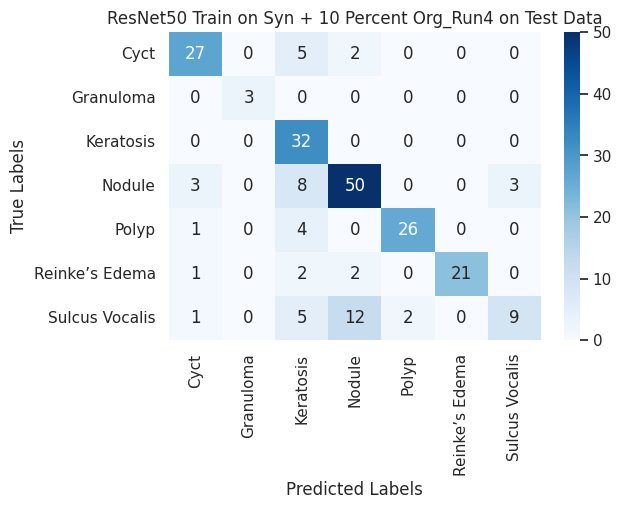

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 24s 218ms/step - loss: 4.7813 - accuracy: 0.6692 - val_loss: 0.3207 - val_accuracy: 0.8954
Epoch 2/20
96/96 [==============================] - 19s 201ms/step - loss: 0.3283 - accuracy: 0.8804 - val_loss: 0.1837 - val_accuracy: 0.9412
Epoch 3/20
96/96 [==============================] - 20s 205ms/step - loss: 0.2601 - accuracy: 0.9094 - val_loss: 0.1237 - val_accuracy: 0.9647
Epoch 4/20
96/96 [==============================] - 19s 203ms/step - loss: 0.1948 - accuracy: 0.9287 - val_loss: 0.1259 - val_accuracy: 0.9634
Epoch 5/20
96/96 [==============================] - 19s 201ms/step - loss: 0.2092 - accuracy: 0.9340 - val_loss: 0.1605 - val_accuracy: 0.9529
Epoch 6/20
96/96 [==============================] - 19s 201ms/step - loss: 0.1780 - accuracy: 0.9398 - val_loss: 0.1059 - val_accuracy: 0.9699
Epoch 7/20
96/96 [===================

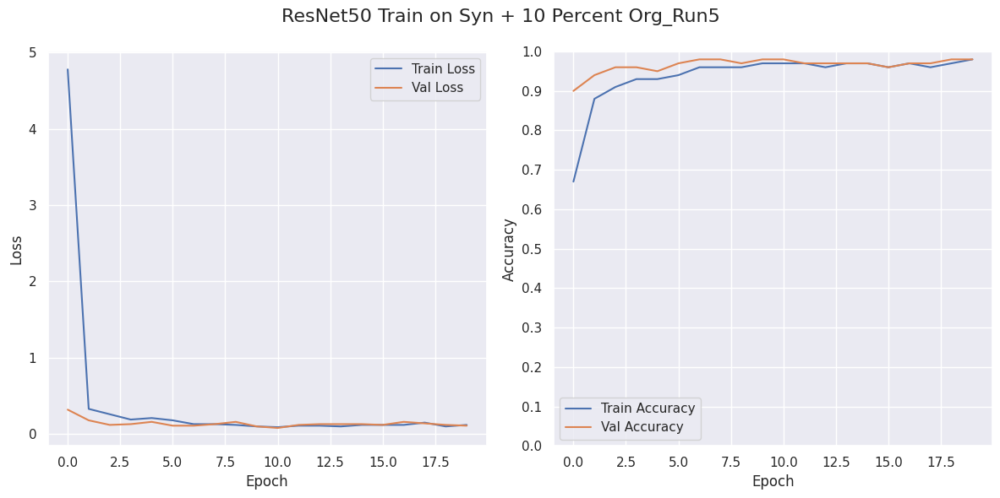

7/7 [==============================] - 2s 133ms/step
{'Test Loss': 1.0336, 'Test Accuracy': 0.8082, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.81, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.97}


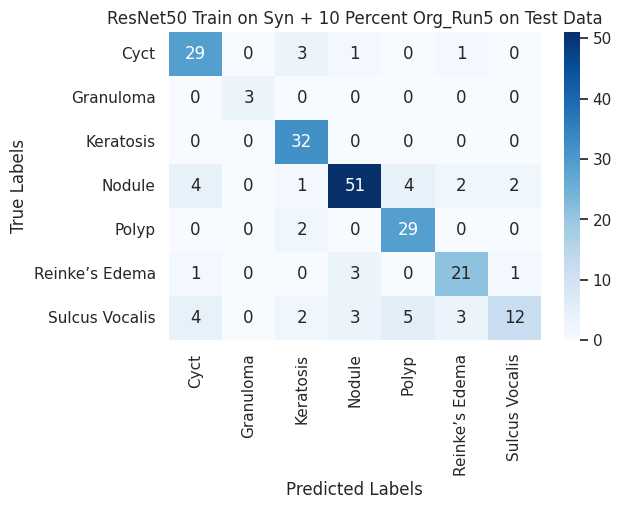

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 25s 217ms/step - loss: 4.7245 - accuracy: 0.6751 - val_loss: 0.2966 - val_accuracy: 0.8954
Epoch 2/20
96/96 [==============================] - 19s 203ms/step - loss: 0.3715 - accuracy: 0.8709 - val_loss: 0.2581 - val_accuracy: 0.9137
Epoch 3/20
96/96 [==============================] - 19s 203ms/step - loss: 0.2873 - accuracy: 0.8974 - val_loss: 0.1234 - val_accuracy: 0.9634
Epoch 4/20
96/96 [==============================] - 20s 205ms/step - loss: 0.1903 - accuracy: 0.9327 - val_loss: 0.1443 - val_accuracy: 0.9490
Epoch 5/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1728 - accuracy: 0.9389 - val_loss: 0.1517 - val_accuracy: 0.9556
Epoch 6/20
96/96 [==============================] - 20s 208ms/step - loss: 0.1584 - accuracy: 0.9444 - val_loss: 0.1373 - val_accuracy: 0.9621
Epoch 7/20
96/96 [===================

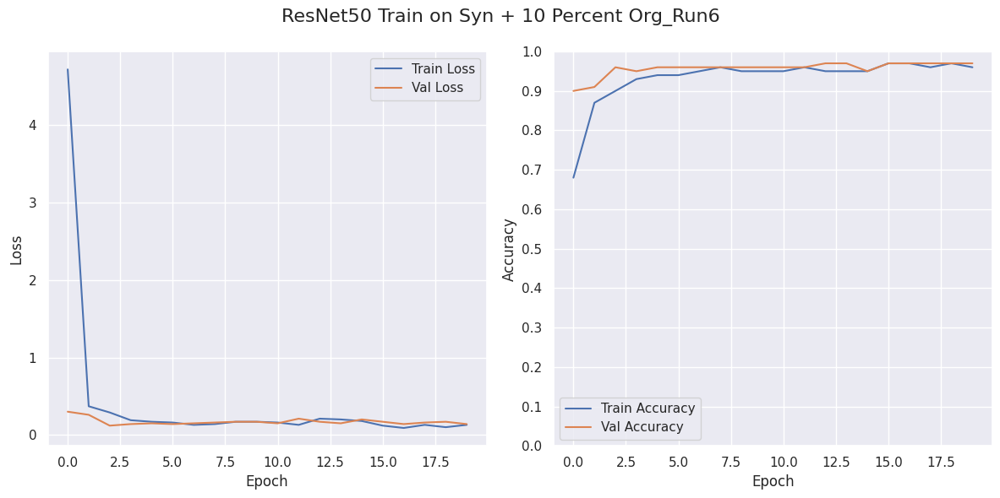

7/7 [==============================] - 2s 130ms/step
{'Test Loss': 1.2456, 'Test Accuracy': 0.7717, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.77, 'Precision': 0.78, 'Specificity (With Structural Pathology)': 0.96}


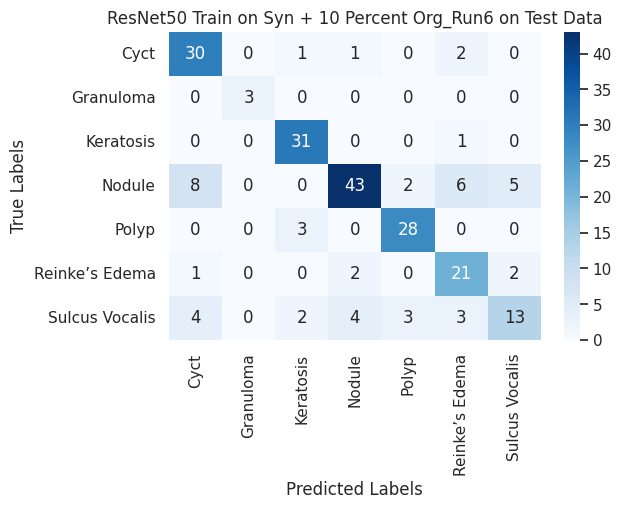

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 214ms/step - loss: 6.7004 - accuracy: 0.6979 - val_loss: 0.2785 - val_accuracy: 0.9059
Epoch 2/20
96/96 [==============================] - 20s 205ms/step - loss: 0.3002 - accuracy: 0.9009 - val_loss: 0.2040 - val_accuracy: 0.9333
Epoch 3/20
96/96 [==============================] - 20s 206ms/step - loss: 0.1986 - accuracy: 0.9353 - val_loss: 0.1336 - val_accuracy: 0.9634
Epoch 4/20
96/96 [==============================] - 20s 207ms/step - loss: 0.1404 - accuracy: 0.9503 - val_loss: 0.1215 - val_accuracy: 0.9621
Epoch 5/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1598 - accuracy: 0.9519 - val_loss: 0.1636 - val_accuracy: 0.9621
Epoch 6/20
96/96 [==============================] - 20s 210ms/step - loss: 0.1568 - accuracy: 0.9546 - val_loss: 0.1715 - val_accuracy: 0.9660
Epoch 7/20
96/96 [===================

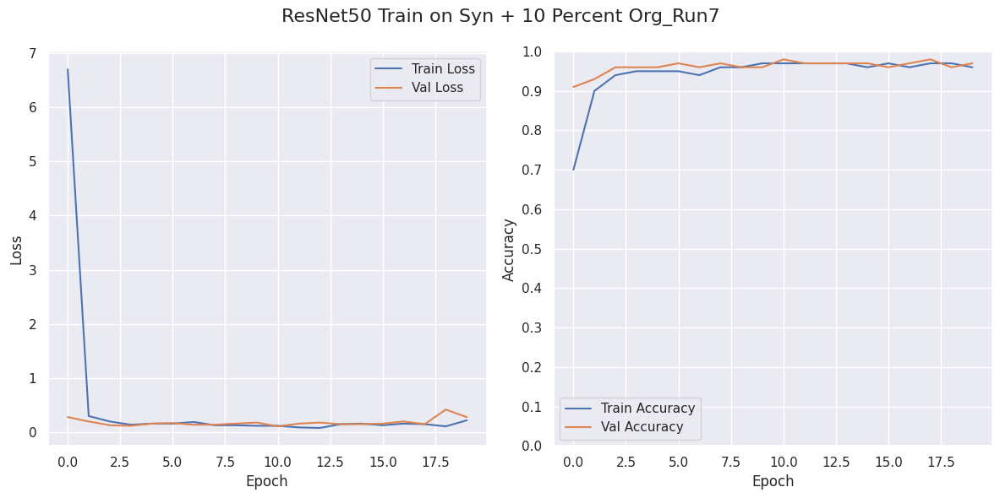

7/7 [==============================] - 2s 134ms/step
{'Test Loss': 3.7575, 'Test Accuracy': 0.726, 'F1 Score': 0.71, 'Sensitivity (Recall)': 0.73, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.95}


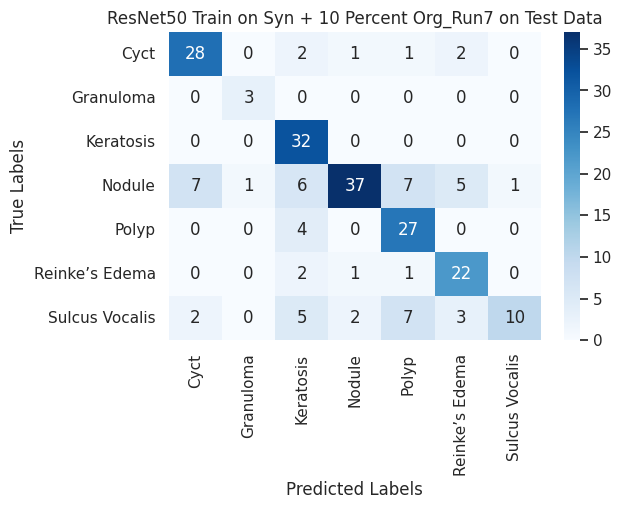

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 216ms/step - loss: 3.5659 - accuracy: 0.7038 - val_loss: 0.2784 - val_accuracy: 0.9085
Epoch 2/20
96/96 [==============================] - 19s 203ms/step - loss: 0.3357 - accuracy: 0.8902 - val_loss: 0.2053 - val_accuracy: 0.9464
Epoch 3/20
96/96 [==============================] - 20s 204ms/step - loss: 0.2307 - accuracy: 0.9251 - val_loss: 0.1792 - val_accuracy: 0.9595
Epoch 4/20
96/96 [==============================] - 20s 205ms/step - loss: 0.1928 - accuracy: 0.9392 - val_loss: 0.1483 - val_accuracy: 0.9529
Epoch 5/20
96/96 [==============================] - 20s 206ms/step - loss: 0.1568 - accuracy: 0.9483 - val_loss: 0.1157 - val_accuracy: 0.9699
Epoch 6/20
96/96 [==============================] - 20s 209ms/step - loss: 0.1471 - accuracy: 0.9565 - val_loss: 0.1212 - val_accuracy: 0.9686
Epoch 7/20
96/96 [===================

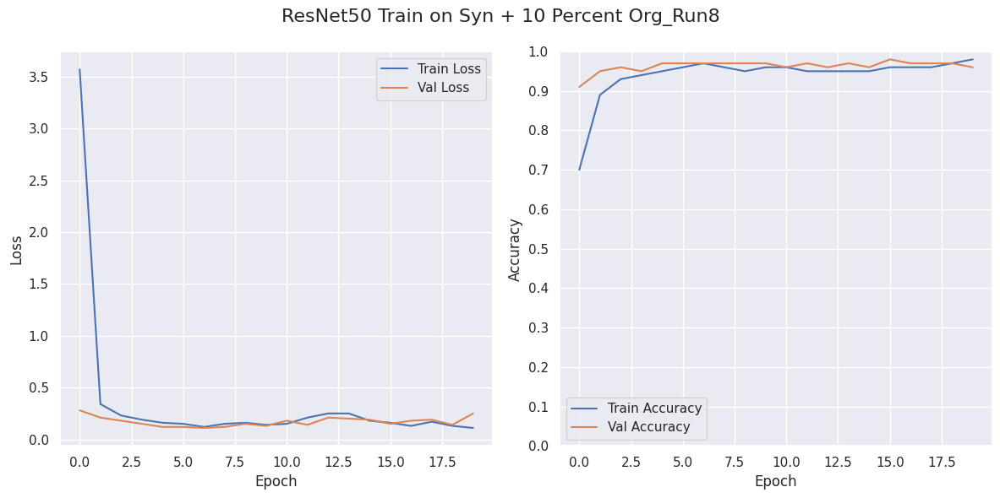

7/7 [==============================] - 2s 128ms/step
{'Test Loss': 1.8517, 'Test Accuracy': 0.7991, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81, 'Specificity (With Structural Pathology)': 0.96}


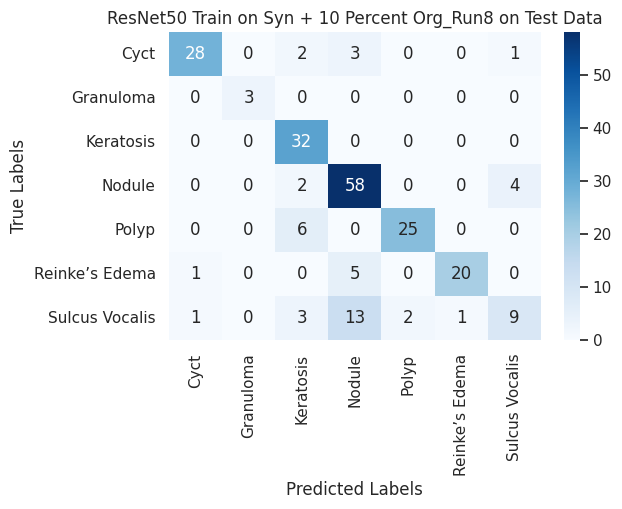

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 213ms/step - loss: 5.0118 - accuracy: 0.6734 - val_loss: 0.3271 - val_accuracy: 0.8941
Epoch 2/20
96/96 [==============================] - 19s 200ms/step - loss: 0.3856 - accuracy: 0.8620 - val_loss: 0.2347 - val_accuracy: 0.9203
Epoch 3/20
96/96 [==============================] - 19s 201ms/step - loss: 0.2542 - accuracy: 0.9062 - val_loss: 0.1318 - val_accuracy: 0.9582
Epoch 4/20
96/96 [==============================] - 19s 202ms/step - loss: 0.1929 - accuracy: 0.9330 - val_loss: 0.1189 - val_accuracy: 0.9582
Epoch 5/20
96/96 [==============================] - 20s 204ms/step - loss: 0.1513 - accuracy: 0.9457 - val_loss: 0.1113 - val_accuracy: 0.9660
Epoch 6/20
96/96 [==============================] - 20s 207ms/step - loss: 0.1354 - accuracy: 0.9503 - val_loss: 0.1627 - val_accuracy: 0.9529
Epoch 7/20
96/96 [===================

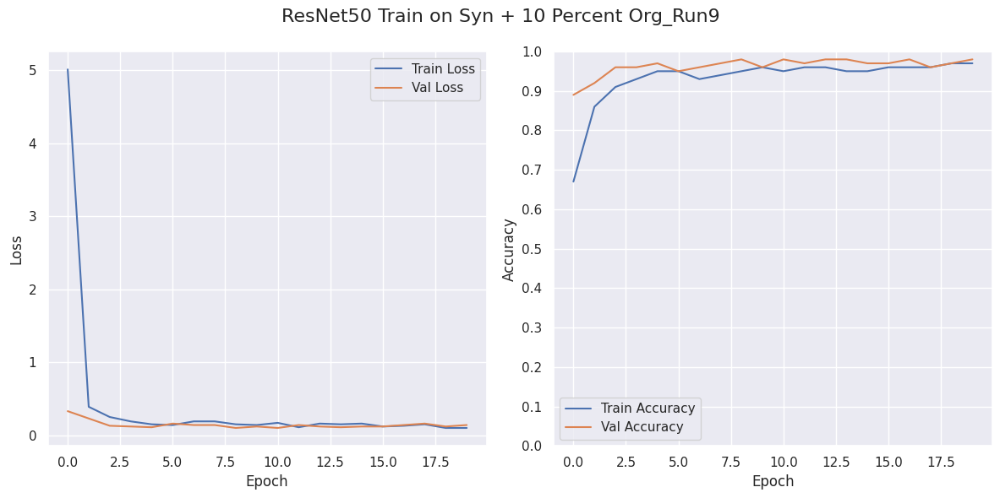

7/7 [==============================] - 2s 129ms/step
{'Test Loss': 1.2816, 'Test Accuracy': 0.7945, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.79, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.96}


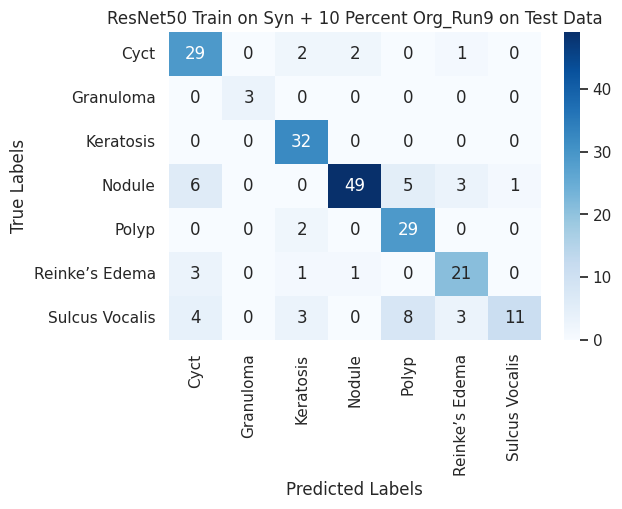

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
96/96 [==============================] - 23s 212ms/step - loss: 3.6291 - accuracy: 0.7077 - val_loss: 0.2622 - val_accuracy: 0.9216
Epoch 2/20
96/96 [==============================] - 19s 201ms/step - loss: 0.3103 - accuracy: 0.8970 - val_loss: 0.1777 - val_accuracy: 0.9451
Epoch 3/20
96/96 [==============================] - 19s 201ms/step - loss: 0.2536 - accuracy: 0.9170 - val_loss: 0.1386 - val_accuracy: 0.9634
Epoch 4/20
96/96 [==============================] - 19s 203ms/step - loss: 0.2238 - accuracy: 0.9323 - val_loss: 0.1299 - val_accuracy: 0.9660
Epoch 5/20
96/96 [==============================] - 20s 206ms/step - loss: 0.1745 - accuracy: 0.9434 - val_loss: 0.1205 - val_accuracy: 0.9647
Epoch 6/20
96/96 [==============================] - 20s 206ms/step - loss: 0.1483 - accuracy: 0.9483 - val_loss: 0.1170 - val_accuracy: 0.9673
Epoch 7/20
96/96 [===================

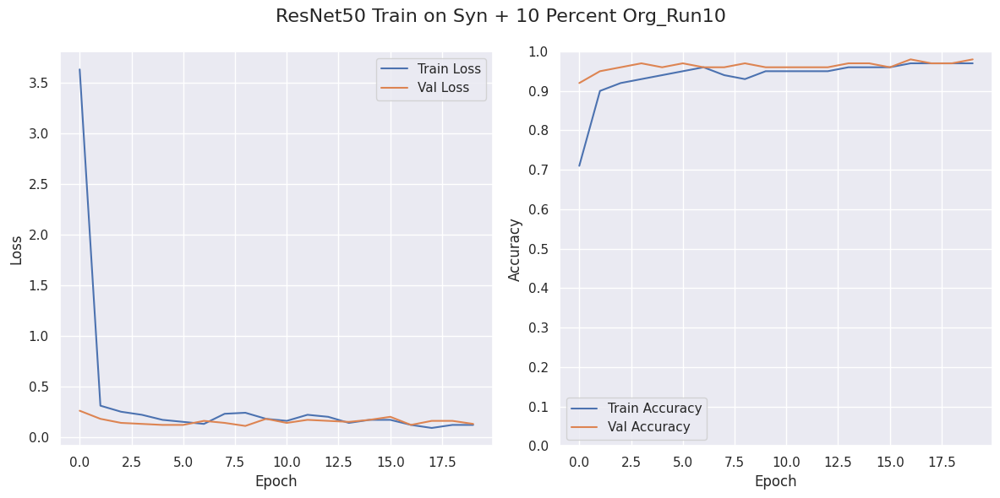

7/7 [==============================] - 2s 129ms/step
{'Test Loss': 1.2954, 'Test Accuracy': 0.7945, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.79, 'Precision': 0.79, 'Specificity (With Structural Pathology)': 0.97}


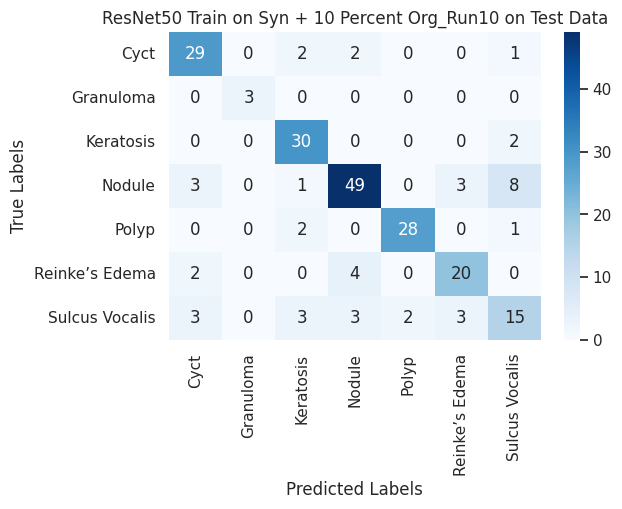

In [13]:
dataset_dir_org = f'{path_dir}/10_percent/Original'
dataset_dir_ddpm = f'{path_dir}/10_percent/Generated_CLEAN_1'

title = "ResNet50 Train on Syn + 10 Percent Org"
file_name = f"{path_dir}/Trained_Models/ResNet50_Synthetic_10percent_Original.png"

epochs=20
cv = 1
n=10
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        resnet_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 50 percent of Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']


2024-12-28 11:38:19.939917: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Epoch 1/20
98/98 [==============================] - 25s 229ms/step - loss: 4.5264 - accuracy: 0.6965 - val_loss: 0.3247 - val_accuracy: 0.8926
Epoch 2/20
98/98 [==============================] - 21s 211ms/step - loss: 0.3526 - accuracy: 0.8844 - val_loss: 0.2227 - val_accuracy: 0.9309
Epoch 3/20
98/98 [==============================] - 21s 217ms/step - loss: 0.2707 - accuracy: 0.9113 - val_loss: 0.1990 - val_accuracy: 0.9437
Epoch 4/20
98/98 [==============================] - 22s 220ms/step - loss: 0.2396 - accuracy: 0.9257 - val_loss: 0.1552 - val_accuracy: 0.9540
Epoch 5/20
98/98 [==============================] - 21s 219ms/step - loss: 0.2913 - accuracy: 0.9165 - val_loss: 0.1802 - val_accuracy: 0.9527
Epoch 6/20
98/98 [==============================] - 22s 222ms/step - loss: 0.2098 - accuracy: 0.9398 - val_loss: 0.2241 - val_accuracy: 0.9565
Epoch 7/20
98/98 [==============================] - 21s 218ms/step - loss: 0.1957 - accuracy: 0.9478 - val_loss: 0.1112 - val_accuracy: 0.9655

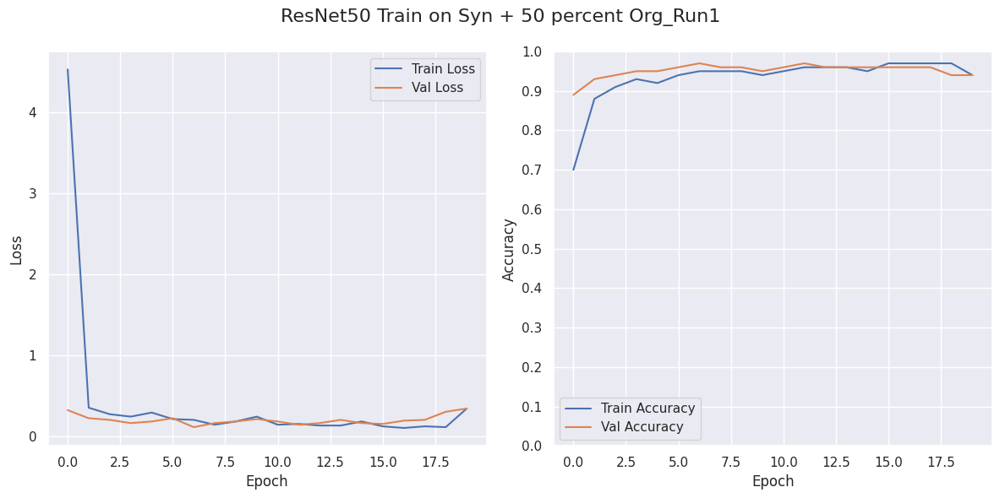

5/5 [==============================] - 2s 118ms/step
{'Test Loss': 2.2196, 'Test Accuracy': 0.7194, 'F1 Score': 0.68, 'Sensitivity (Recall)': 0.72, 'Precision': 0.77, 'Specificity (With Structural Pathology)': 0.95}


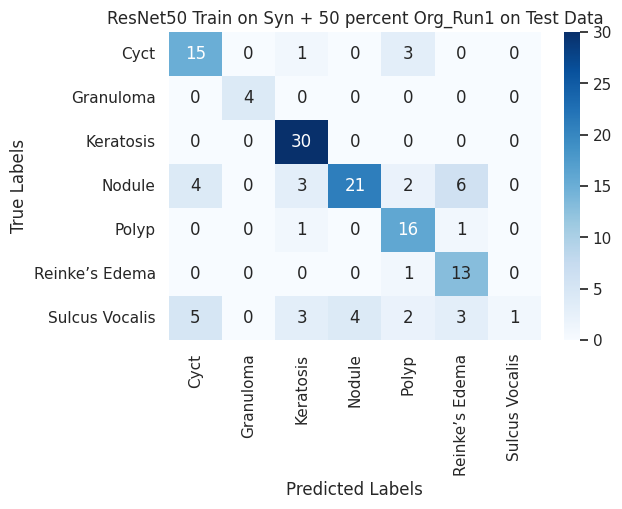

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 218ms/step - loss: 4.6587 - accuracy: 0.7068 - val_loss: 0.2750 - val_accuracy: 0.8990
Epoch 2/20
98/98 [==============================] - 21s 215ms/step - loss: 0.4088 - accuracy: 0.8809 - val_loss: 0.1951 - val_accuracy: 0.9386
Epoch 3/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2458 - accuracy: 0.9241 - val_loss: 0.1713 - val_accuracy: 0.9527
Epoch 4/20
98/98 [==============================] - 21s 213ms/step - loss: 0.2462 - accuracy: 0.9267 - val_loss: 0.1575 - val_accuracy: 0.9578
Epoch 5/20
98/98 [==============================] - 21s 216ms/step - loss: 0.2025 - accuracy: 0.9385 - val_loss: 0.1424 - val_accuracy: 0.9540
Epoch 6/20
98/98 [==============================] - 21s 216ms/step - loss: 0.2129 - accuracy: 0.9357 - val_loss: 0.2087 - val_accuracy: 0.9488
Epoch 7/20
98/98 [===================

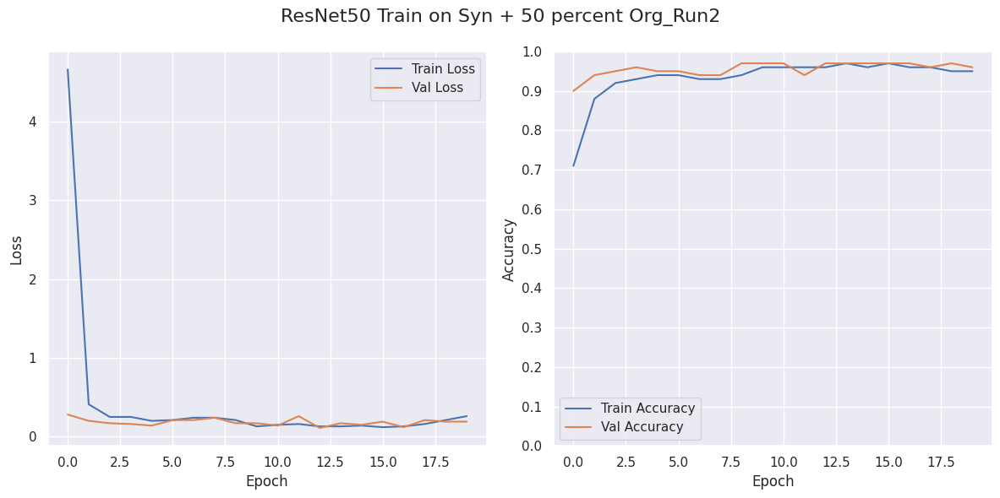

5/5 [==============================] - 2s 117ms/step
{'Test Loss': 1.2253, 'Test Accuracy': 0.8417, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85, 'Specificity (With Structural Pathology)': 0.97}


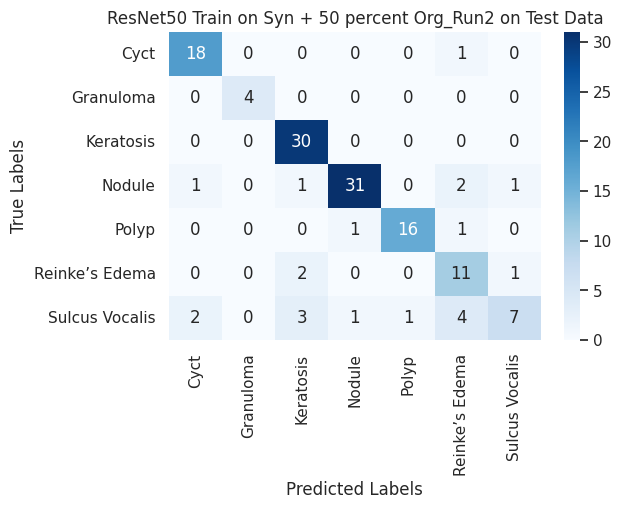

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 216ms/step - loss: 5.0931 - accuracy: 0.6440 - val_loss: 0.3500 - val_accuracy: 0.8747
Epoch 2/20
98/98 [==============================] - 20s 209ms/step - loss: 0.4463 - accuracy: 0.8483 - val_loss: 0.2521 - val_accuracy: 0.9194
Epoch 3/20
98/98 [==============================] - 21s 211ms/step - loss: 0.2796 - accuracy: 0.9030 - val_loss: 0.1743 - val_accuracy: 0.9373
Epoch 4/20
98/98 [==============================] - 21s 212ms/step - loss: 0.2567 - accuracy: 0.9184 - val_loss: 0.1613 - val_accuracy: 0.9425
Epoch 5/20
98/98 [==============================] - 21s 212ms/step - loss: 0.2439 - accuracy: 0.9177 - val_loss: 0.1696 - val_accuracy: 0.9552
Epoch 6/20
98/98 [==============================] - 21s 211ms/step - loss: 0.2099 - accuracy: 0.9299 - val_loss: 0.1694 - val_accuracy: 0.9552
Epoch 7/20
98/98 [===================

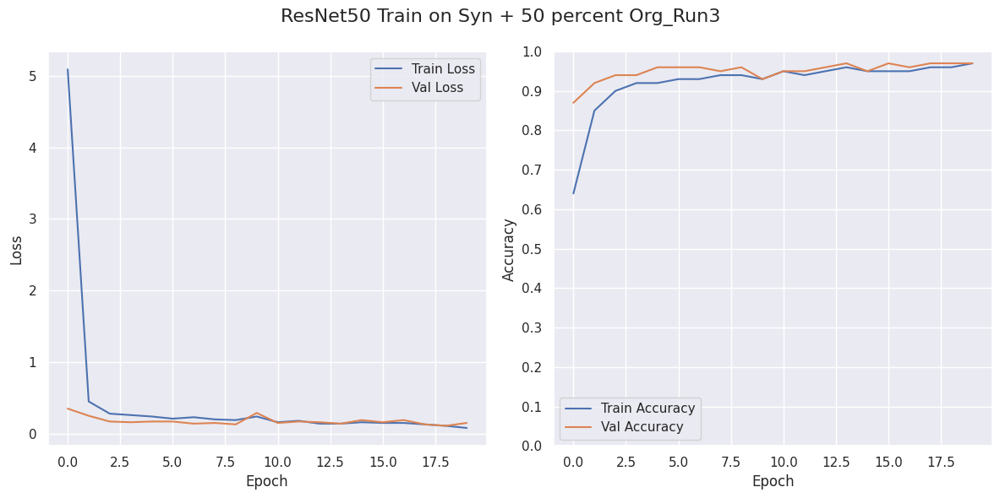

5/5 [==============================] - 2s 122ms/step
{'Test Loss': 0.9319, 'Test Accuracy': 0.8633, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88, 'Specificity (With Structural Pathology)': 0.98}


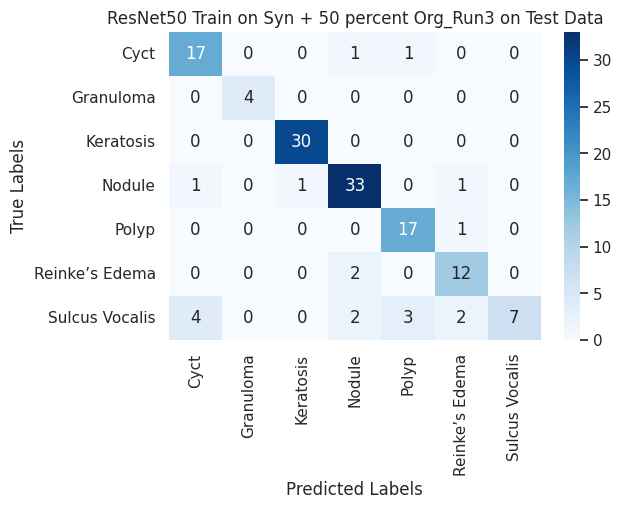

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 219ms/step - loss: 5.0864 - accuracy: 0.6492 - val_loss: 0.3119 - val_accuracy: 0.8887
Epoch 2/20
98/98 [==============================] - 21s 211ms/step - loss: 0.4411 - accuracy: 0.8643 - val_loss: 0.2164 - val_accuracy: 0.9284
Epoch 3/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2743 - accuracy: 0.8995 - val_loss: 0.1856 - val_accuracy: 0.9412
Epoch 4/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2430 - accuracy: 0.9187 - val_loss: 0.1320 - val_accuracy: 0.9616
Epoch 5/20
98/98 [==============================] - 21s 217ms/step - loss: 0.2013 - accuracy: 0.9293 - val_loss: 0.1568 - val_accuracy: 0.9540
Epoch 6/20
98/98 [==============================] - 21s 217ms/step - loss: 0.1745 - accuracy: 0.9385 - val_loss: 0.1258 - val_accuracy: 0.9642
Epoch 7/20
98/98 [===================

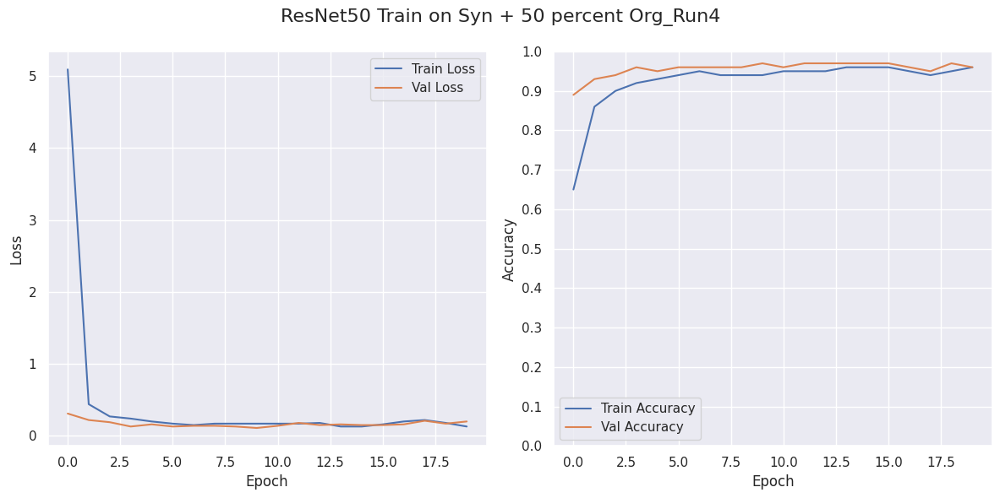

5/5 [==============================] - 1s 121ms/step
{'Test Loss': 1.0188, 'Test Accuracy': 0.8201, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.82, 'Precision': 0.85, 'Specificity (With Structural Pathology)': 0.97}


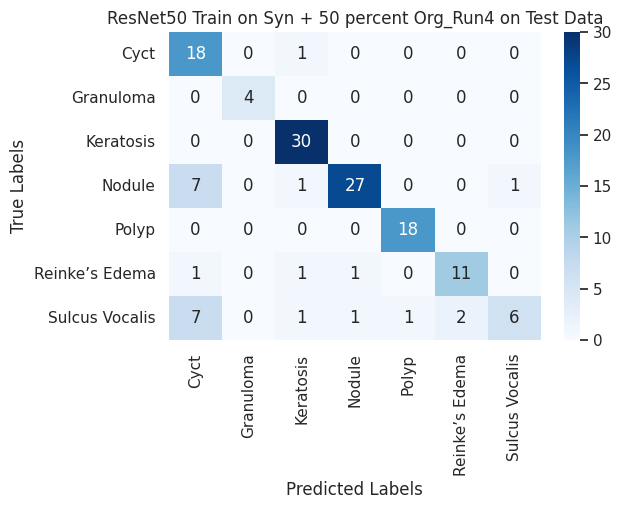

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 217ms/step - loss: 4.0068 - accuracy: 0.6821 - val_loss: 0.3598 - val_accuracy: 0.8887
Epoch 2/20
98/98 [==============================] - 21s 210ms/step - loss: 0.4448 - accuracy: 0.8668 - val_loss: 0.2139 - val_accuracy: 0.9309
Epoch 3/20
98/98 [==============================] - 21s 211ms/step - loss: 0.3035 - accuracy: 0.9036 - val_loss: 0.1924 - val_accuracy: 0.9335
Epoch 4/20
98/98 [==============================] - 21s 215ms/step - loss: 0.2460 - accuracy: 0.9216 - val_loss: 0.1495 - val_accuracy: 0.9540
Epoch 5/20
98/98 [==============================] - 22s 221ms/step - loss: 0.1920 - accuracy: 0.9321 - val_loss: 0.1889 - val_accuracy: 0.9437
Epoch 6/20
98/98 [==============================] - 21s 218ms/step - loss: 0.2623 - accuracy: 0.9283 - val_loss: 0.1680 - val_accuracy: 0.9361
Epoch 7/20
98/98 [===================

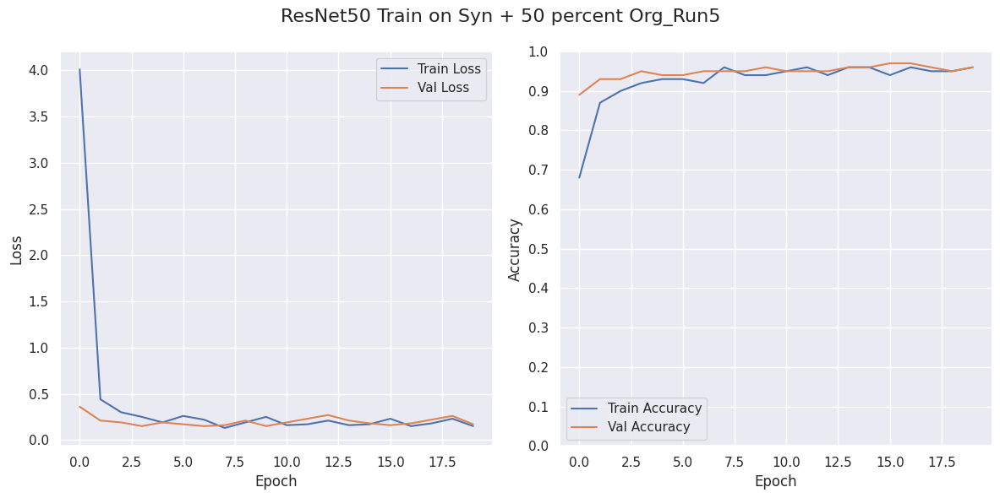

5/5 [==============================] - 1s 118ms/step
{'Test Loss': 1.2491, 'Test Accuracy': 0.8058, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.81, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


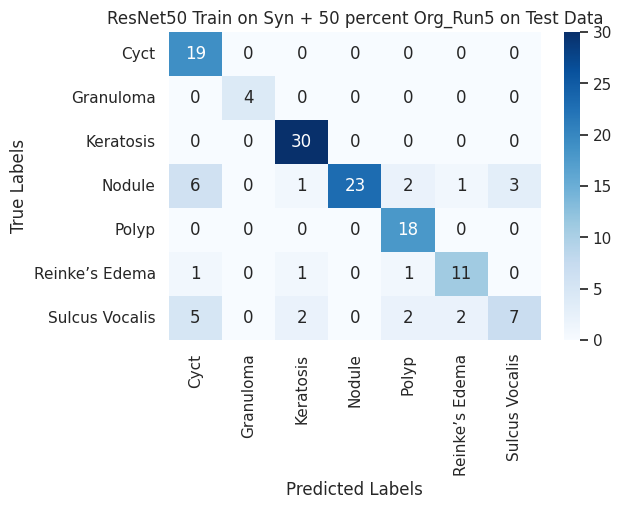

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 221ms/step - loss: 4.1513 - accuracy: 0.6735 - val_loss: 0.2760 - val_accuracy: 0.9066
Epoch 2/20
98/98 [==============================] - 21s 213ms/step - loss: 0.3543 - accuracy: 0.8816 - val_loss: 0.2518 - val_accuracy: 0.9066
Epoch 3/20
98/98 [==============================] - 21s 213ms/step - loss: 0.2615 - accuracy: 0.9075 - val_loss: 0.1764 - val_accuracy: 0.9412
Epoch 4/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2036 - accuracy: 0.9344 - val_loss: 0.1448 - val_accuracy: 0.9578
Epoch 5/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2108 - accuracy: 0.9299 - val_loss: 0.1765 - val_accuracy: 0.9437
Epoch 6/20
98/98 [==============================] - 21s 215ms/step - loss: 0.1972 - accuracy: 0.9325 - val_loss: 0.1339 - val_accuracy: 0.9629
Epoch 7/20
98/98 [===================

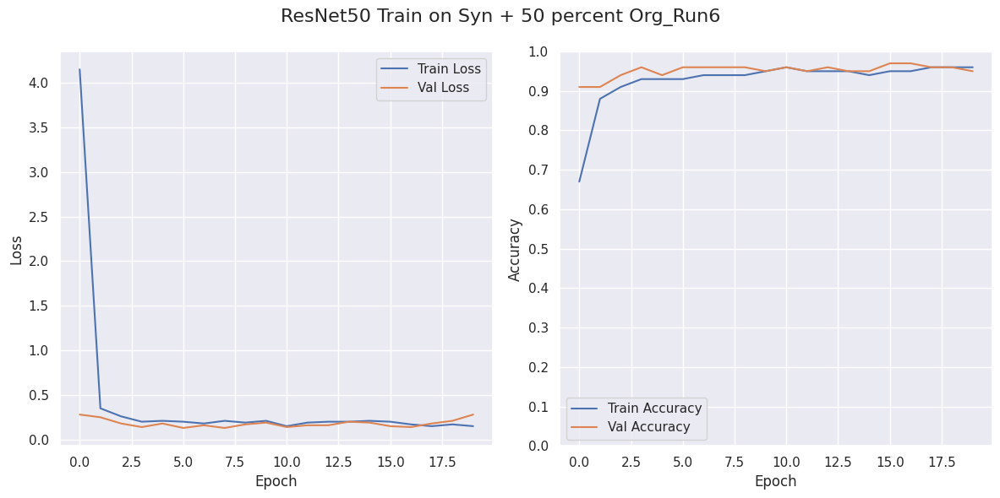

5/5 [==============================] - 2s 121ms/step
{'Test Loss': 1.1938, 'Test Accuracy': 0.8129, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.81, 'Precision': 0.85, 'Specificity (With Structural Pathology)': 0.97}


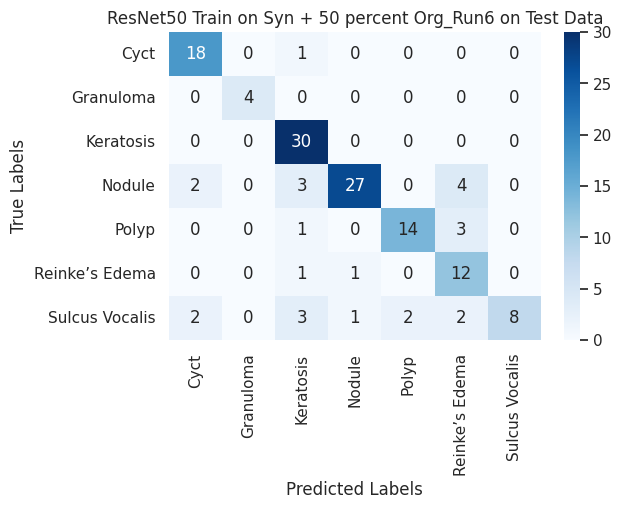

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 212ms/step - loss: 4.8566 - accuracy: 0.6450 - val_loss: 0.3885 - val_accuracy: 0.8900
Epoch 2/20
98/98 [==============================] - 19s 197ms/step - loss: 0.4397 - accuracy: 0.8451 - val_loss: 0.2481 - val_accuracy: 0.9194
Epoch 3/20
98/98 [==============================] - 20s 200ms/step - loss: 0.3236 - accuracy: 0.8880 - val_loss: 0.2385 - val_accuracy: 0.9194
Epoch 4/20
98/98 [==============================] - 20s 203ms/step - loss: 0.2548 - accuracy: 0.9126 - val_loss: 0.2053 - val_accuracy: 0.9373
Epoch 5/20
98/98 [==============================] - 20s 208ms/step - loss: 0.1998 - accuracy: 0.9286 - val_loss: 0.1589 - val_accuracy: 0.9412
Epoch 6/20
98/98 [==============================] - 21s 211ms/step - loss: 0.2224 - accuracy: 0.9267 - val_loss: 0.1892 - val_accuracy: 0.9450
Epoch 7/20
98/98 [===================

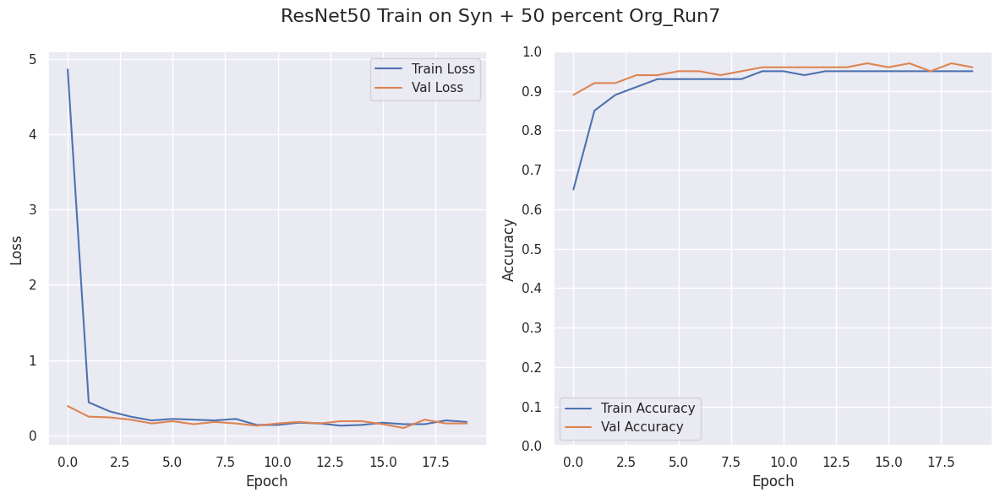

5/5 [==============================] - 1s 118ms/step
{'Test Loss': 0.9842, 'Test Accuracy': 0.7986, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.8, 'Precision': 0.82, 'Specificity (With Structural Pathology)': 0.97}


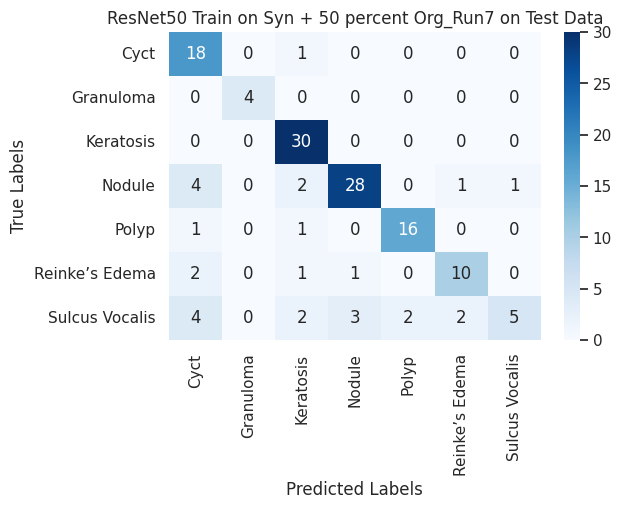

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 25s 215ms/step - loss: 4.6510 - accuracy: 0.6658 - val_loss: 0.3814 - val_accuracy: 0.8760
Epoch 2/20
98/98 [==============================] - 20s 206ms/step - loss: 0.4545 - accuracy: 0.8505 - val_loss: 0.2546 - val_accuracy: 0.9169
Epoch 3/20
98/98 [==============================] - 20s 209ms/step - loss: 0.3328 - accuracy: 0.8924 - val_loss: 0.2132 - val_accuracy: 0.9348
Epoch 4/20
98/98 [==============================] - 21s 210ms/step - loss: 0.2754 - accuracy: 0.9043 - val_loss: 0.1947 - val_accuracy: 0.9476
Epoch 5/20
98/98 [==============================] - 21s 212ms/step - loss: 0.2215 - accuracy: 0.9251 - val_loss: 0.2306 - val_accuracy: 0.9322
Epoch 6/20
98/98 [==============================] - 21s 217ms/step - loss: 0.2363 - accuracy: 0.9261 - val_loss: 0.1470 - val_accuracy: 0.9540
Epoch 7/20
98/98 [===================

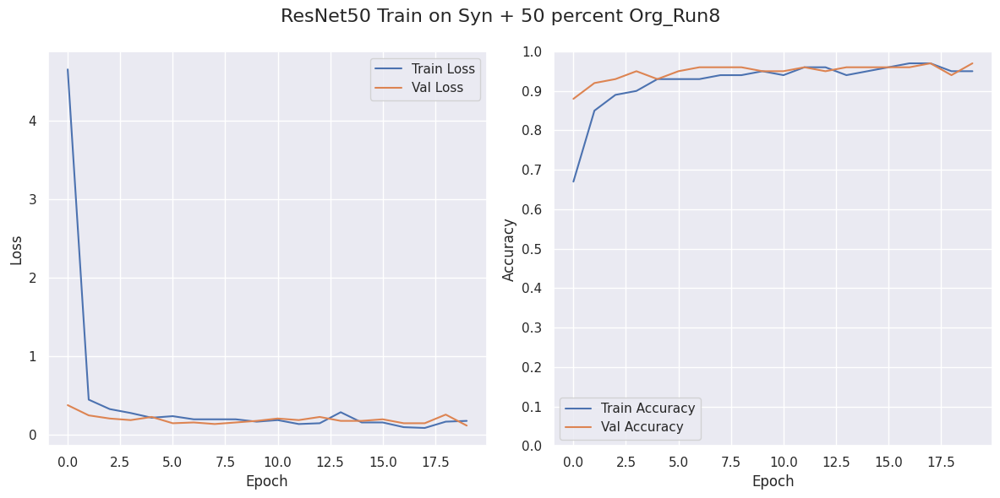

5/5 [==============================] - 2s 120ms/step
{'Test Loss': 0.8638, 'Test Accuracy': 0.8273, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.83, 'Precision': 0.84, 'Specificity (With Structural Pathology)': 0.97}


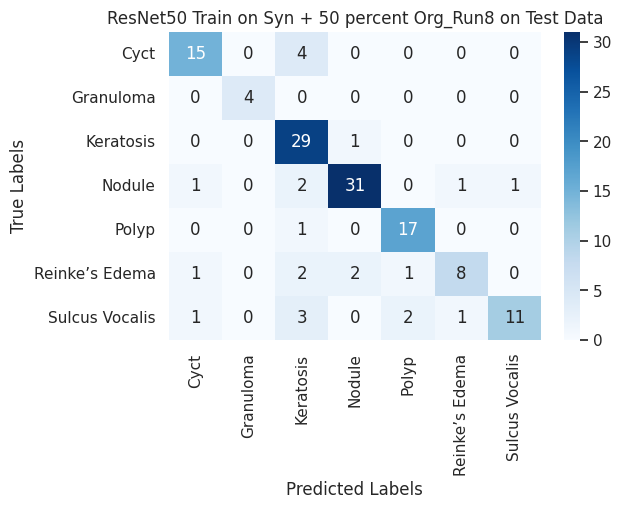

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 220ms/step - loss: 4.2049 - accuracy: 0.6908 - val_loss: 0.3511 - val_accuracy: 0.8964
Epoch 2/20
98/98 [==============================] - 21s 213ms/step - loss: 0.4055 - accuracy: 0.8720 - val_loss: 0.2042 - val_accuracy: 0.9335
Epoch 3/20
98/98 [==============================] - 21s 212ms/step - loss: 0.3050 - accuracy: 0.9014 - val_loss: 0.2091 - val_accuracy: 0.9335
Epoch 4/20
98/98 [==============================] - 21s 215ms/step - loss: 0.3040 - accuracy: 0.9008 - val_loss: 0.2116 - val_accuracy: 0.9386
Epoch 5/20
98/98 [==============================] - 21s 213ms/step - loss: 0.2750 - accuracy: 0.9152 - val_loss: 0.1653 - val_accuracy: 0.9540
Epoch 6/20
98/98 [==============================] - 22s 220ms/step - loss: 0.2052 - accuracy: 0.9373 - val_loss: 0.1353 - val_accuracy: 0.9604
Epoch 7/20
98/98 [===================

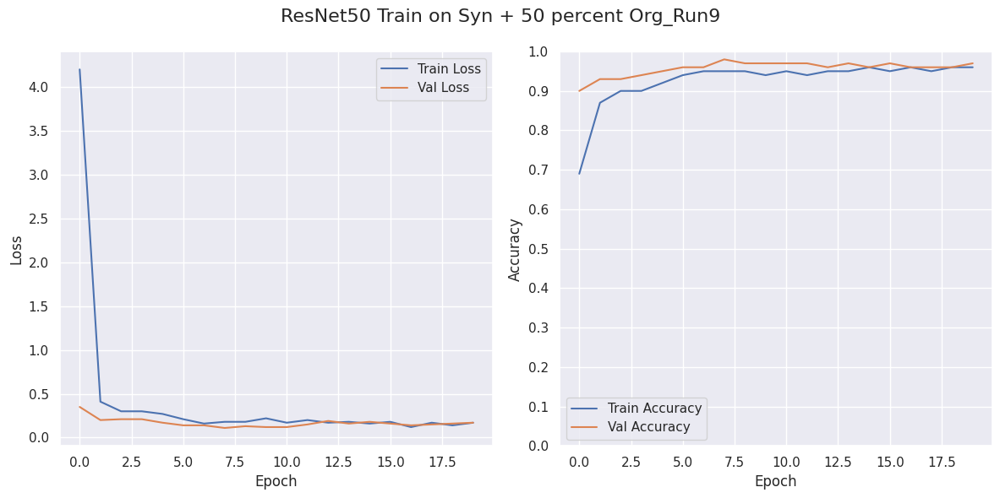

5/5 [==============================] - 2s 118ms/step
{'Test Loss': 0.8017, 'Test Accuracy': 0.8129, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.81, 'Precision': 0.83, 'Specificity (With Structural Pathology)': 0.97}


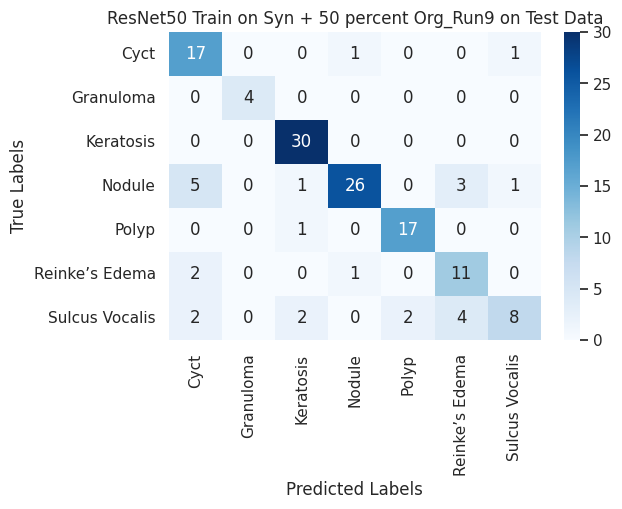

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/20
98/98 [==============================] - 24s 220ms/step - loss: 4.3563 - accuracy: 0.6828 - val_loss: 0.3244 - val_accuracy: 0.8900
Epoch 2/20
98/98 [==============================] - 21s 210ms/step - loss: 0.3901 - accuracy: 0.8688 - val_loss: 0.2287 - val_accuracy: 0.9271
Epoch 3/20
98/98 [==============================] - 21s 211ms/step - loss: 0.2859 - accuracy: 0.9085 - val_loss: 0.2077 - val_accuracy: 0.9233
Epoch 4/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2375 - accuracy: 0.9229 - val_loss: 0.1926 - val_accuracy: 0.9386
Epoch 5/20
98/98 [==============================] - 21s 215ms/step - loss: 0.2693 - accuracy: 0.9216 - val_loss: 0.1907 - val_accuracy: 0.9361
Epoch 6/20
98/98 [==============================] - 21s 214ms/step - loss: 0.2335 - accuracy: 0.9299 - val_loss: 0.1740 - val_accuracy: 0.9501
Epoch 7/20
98/98 [===================

In [ ]:
dataset_dir_org = f'{path_dir}/50_percent/Original'
dataset_dir_ddpm = f'{path_dir}/50_percent/Generated_CLEAN_1'

title = "ResNet50 Train on Syn + 50 percent Org"
file_name = f"{path_dir}/Trained_Models/ResNet50_Synthetic_50percent_Original.png"

epochs=20
cv = 1
n=10
for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        resnet_model,
        weights="imagenet",
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

## Untrained VGG16

#### Train on just Syn test of all Original Dataset

In [ ]:
dataset_dir_org = f'{path_dir}/Original'
dataset_dir_ddpm = f'{path_dir}/Generated_CLEAN_1'

title = "Untrained VGG16 Train on Syn"
file_name = f"{path_dir}/Trained_Models/Untrained_VGG16_Synthetic.png"

epochs=100
n=5

for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights=None,
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 10 percent of Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
96/96 [==============================] - 29s 296ms/step - loss: 2.0708 - accuracy: 0.2279 - val_loss: 1.7813 - val_accuracy: 0.3399
Epoch 2/100
96/96 [==============================] - 28s 297ms/step - loss: 1.8131 - accuracy: 0.2955 - val_loss: 1.7224 - val_accuracy: 0.3451
Epoch 3/100
96/96 [==============================] - 29s 299ms/step - loss: 1.7368 - accuracy: 0.3256 - val_loss: 1.6641 - val_accuracy: 0.4105
Epoch 4/100
96/96 [==============================] - 29s 301ms/step - loss: 1.6775 - accuracy: 0.3455 - val_loss: 1.5925 - val_accuracy: 0.4248
Epoch 5/100
96/96 [==============================] - 29s 302ms/step - loss: 1.6488 - accuracy: 0.3482 - val_loss: 1.6105 - val_accuracy: 0.4353
Epoch 6/100
96/96 [==============================] - 29s 302ms/step - loss: 1.5904 - accuracy: 0.3707 - val_loss: 1.5108 - val_accuracy: 0.4902
Epoch 7/100
96/96 [============

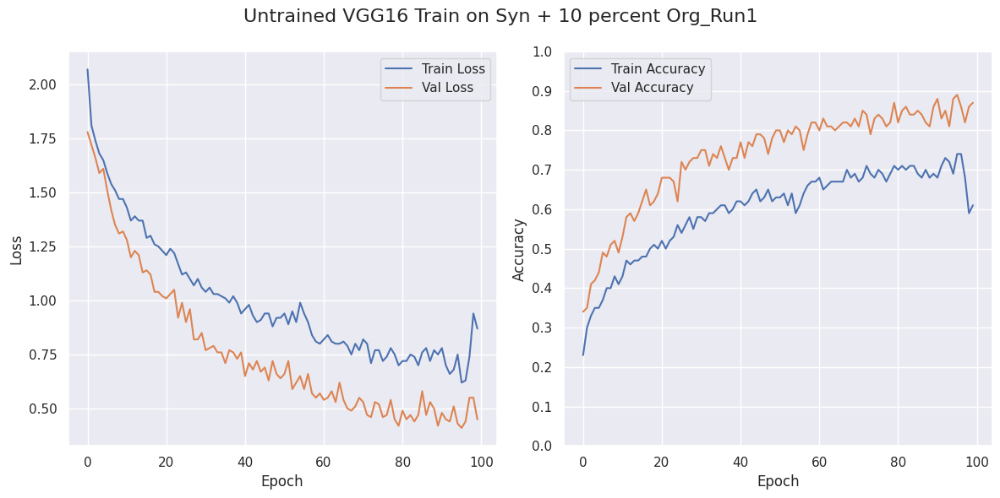

7/7 [==============================] - 2s 222ms/step
{'Test Loss': 1.0325, 'Test Accuracy': 0.6256, 'F1 Score': 0.61, 'Sensitivity (Recall)': 0.63, 'Precision': 0.66}


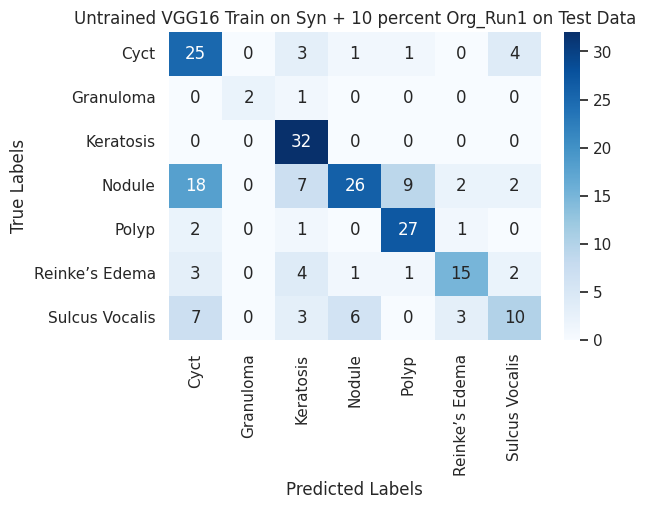

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
96/96 [==============================] - 29s 299ms/step - loss: 1.9269 - accuracy: 0.2723 - val_loss: 1.6792 - val_accuracy: 0.3765
Epoch 2/100
96/96 [==============================] - 29s 300ms/step - loss: 1.6953 - accuracy: 0.3328 - val_loss: 1.6404 - val_accuracy: 0.3686
Epoch 3/100
96/96 [==============================] - 29s 300ms/step - loss: 1.6283 - accuracy: 0.3665 - val_loss: 1.5193 - val_accuracy: 0.4497
Epoch 4/100
96/96 [==============================] - 29s 302ms/step - loss: 1.5874 - accuracy: 0.3772 - val_loss: 1.5557 - val_accuracy: 0.4248
Epoch 5/100
96/96 [==============================] - 29s 302ms/step - loss: 1.5796 - accuracy: 0.3893 - val_loss: 1.4970 - val_accuracy: 0.4366
Epoch 6/100
96/96 [==============================] - 29s 302ms/step - loss: 1.4910 - accuracy: 0.4148 - val_loss: 1.3763 - val_accuracy: 0.5490
Epoch 7/100
96/96 [============

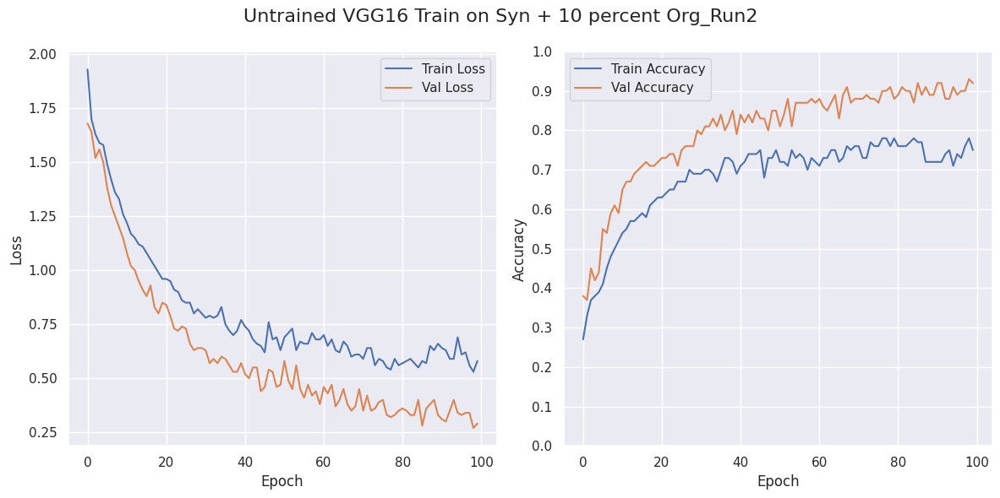

7/7 [==============================] - 2s 223ms/step
{'Test Loss': 0.7938, 'Test Accuracy': 0.7534, 'F1 Score': 0.74, 'Sensitivity (Recall)': 0.75, 'Precision': 0.78}


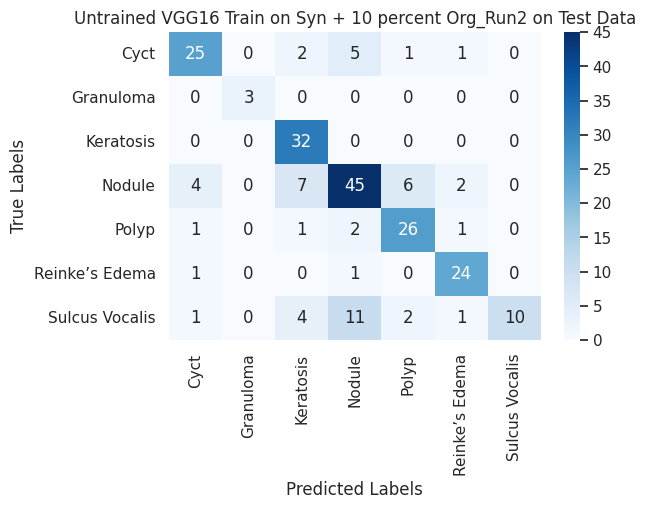

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
96/96 [==============================] - 29s 299ms/step - loss: 1.9391 - accuracy: 0.2498 - val_loss: 1.6914 - val_accuracy: 0.3072
Epoch 2/100
96/96 [==============================] - 29s 300ms/step - loss: 1.6811 - accuracy: 0.3580 - val_loss: 1.6120 - val_accuracy: 0.3817
Epoch 3/100
96/96 [==============================] - 29s 300ms/step - loss: 1.6047 - accuracy: 0.3779 - val_loss: 1.4960 - val_accuracy: 0.4523
Epoch 4/100
96/96 [==============================] - 29s 300ms/step - loss: 1.5576 - accuracy: 0.4050 - val_loss: 1.5219 - val_accuracy: 0.4405
Epoch 5/100
96/96 [==============================] - 29s 300ms/step - loss: 1.5195 - accuracy: 0.4220 - val_loss: 1.4285 - val_accuracy: 0.5346
Epoch 6/100
96/96 [==============================] - 29s 298ms/step - loss: 1.4471 - accuracy: 0.4691 - val_loss: 1.3044 - val_accuracy: 0.5673
Epoch 7/100
96/96 [============

In [ ]:
dataset_dir_org = f'{path_dir}/10_percent/Original'
dataset_dir_ddpm = f'{path_dir}/10_percent/Generated_CLEAN_1'

title = "Untrained VGG16 Train on Syn + 10 percent Org"
file_name = f"{path_dir}/Trained_Models/Untrained_VGG16_Synthetic_10percent_Original.png"

epochs=100
n=5

for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights=None,
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )

#### Train on Syn + 50 percent of Original Dataset

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']


2024-12-23 11:09:25.673973: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Epoch 1/100
98/98 [==============================] - 30s 300ms/step - loss: 1.9391 - accuracy: 0.2510 - val_loss: 1.7314 - val_accuracy: 0.3146
Epoch 2/100
98/98 [==============================] - 30s 302ms/step - loss: 1.7513 - accuracy: 0.3156 - val_loss: 1.6548 - val_accuracy: 0.3708
Epoch 3/100
98/98 [==============================] - 30s 306ms/step - loss: 1.6751 - accuracy: 0.3473 - val_loss: 1.5743 - val_accuracy: 0.4655
Epoch 4/100
98/98 [==============================] - 30s 306ms/step - loss: 1.6113 - accuracy: 0.3787 - val_loss: 1.4812 - val_accuracy: 0.5205
Epoch 5/100
98/98 [==============================] - 30s 307ms/step - loss: 1.5487 - accuracy: 0.4011 - val_loss: 1.4599 - val_accuracy: 0.5332
Epoch 6/100
98/98 [==============================] - 30s 308ms/step - loss: 1.5256 - accuracy: 0.4075 - val_loss: 1.4073 - val_accuracy: 0.5153
Epoch 7/100
98/98 [==============================] - 30s 309ms/step - loss: 1.4657 - accuracy: 0.4408 - val_loss: 1.3387 - val_accuracy:

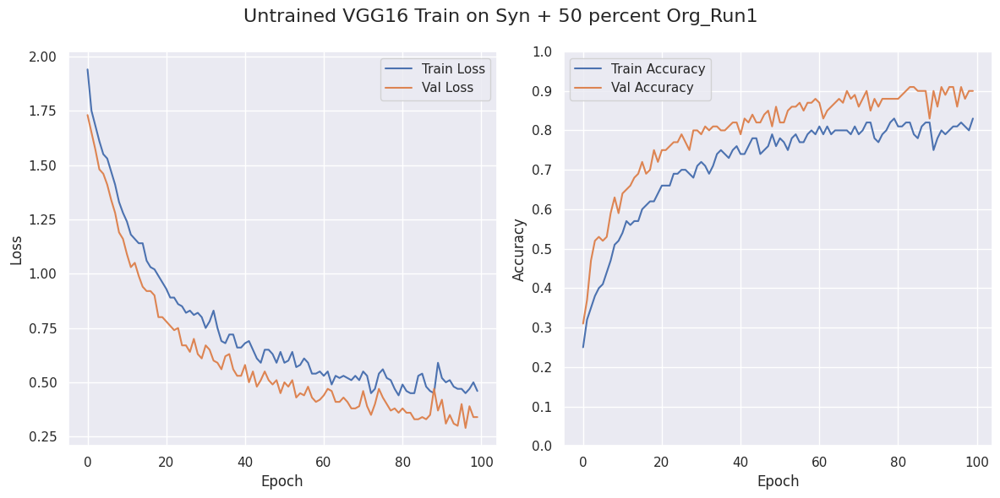

5/5 [==============================] - 1s 193ms/step
{'Test Loss': 0.7527, 'Test Accuracy': 0.7482, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.75, 'Precision': 0.8}


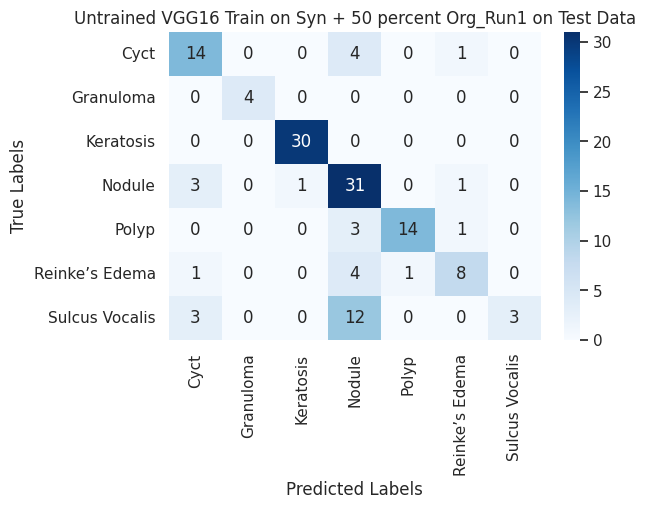

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
98/98 [==============================] - 31s 305ms/step - loss: 1.9800 - accuracy: 0.2500 - val_loss: 1.7529 - val_accuracy: 0.2992
Epoch 2/100
98/98 [==============================] - 30s 305ms/step - loss: 1.7627 - accuracy: 0.3044 - val_loss: 1.6598 - val_accuracy: 0.4028
Epoch 3/100
98/98 [==============================] - 30s 306ms/step - loss: 1.6859 - accuracy: 0.3473 - val_loss: 1.5601 - val_accuracy: 0.4693
Epoch 4/100
98/98 [==============================] - 30s 305ms/step - loss: 1.6078 - accuracy: 0.3809 - val_loss: 1.5072 - val_accuracy: 0.4680
Epoch 5/100
98/98 [==============================] - 30s 304ms/step - loss: 1.5357 - accuracy: 0.4088 - val_loss: 1.4747 - val_accuracy: 0.5141
Epoch 6/100
98/98 [==============================] - 30s 307ms/step - loss: 1.4884 - accuracy: 0.4264 - val_loss: 1.3553 - val_accuracy: 0.5703
Epoch 7/100
98/98 [============

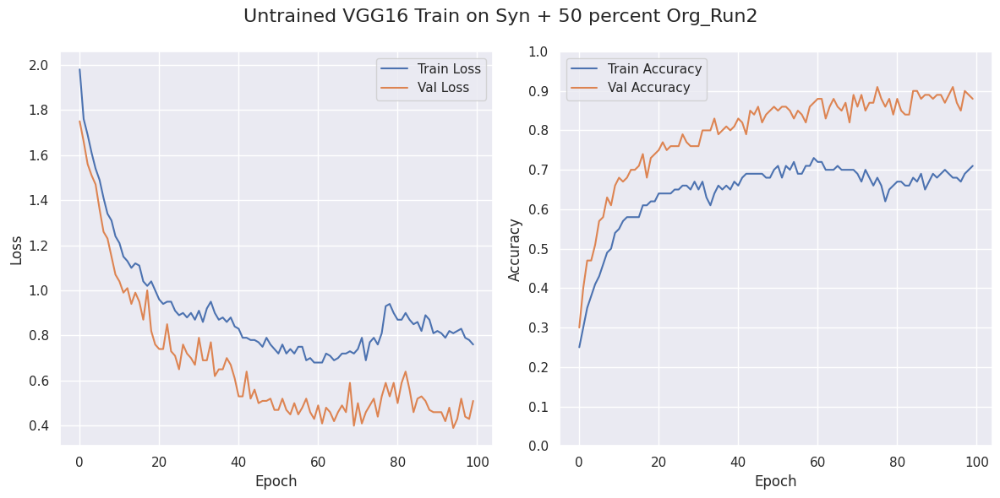

5/5 [==============================] - 1s 196ms/step
{'Test Loss': 0.6743, 'Test Accuracy': 0.7986, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81}


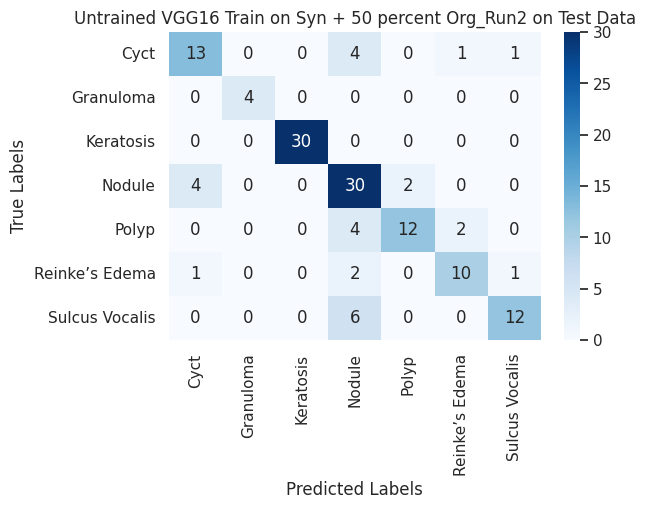

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
98/98 [==============================] - 30s 302ms/step - loss: 1.8826 - accuracy: 0.2801 - val_loss: 1.6905 - val_accuracy: 0.3414
Epoch 2/100
98/98 [==============================] - 30s 304ms/step - loss: 1.7016 - accuracy: 0.3444 - val_loss: 1.5988 - val_accuracy: 0.3951
Epoch 3/100
98/98 [==============================] - 30s 305ms/step - loss: 1.6265 - accuracy: 0.3777 - val_loss: 1.5330 - val_accuracy: 0.4693
Epoch 4/100
98/98 [==============================] - 30s 305ms/step - loss: 1.5602 - accuracy: 0.4078 - val_loss: 1.4477 - val_accuracy: 0.5026
Epoch 5/100
98/98 [==============================] - 30s 305ms/step - loss: 1.5030 - accuracy: 0.4305 - val_loss: 1.4458 - val_accuracy: 0.4962
Epoch 6/100
98/98 [==============================] - 30s 305ms/step - loss: 1.4265 - accuracy: 0.4699 - val_loss: 1.2939 - val_accuracy: 0.5524
Epoch 7/100
98/98 [============

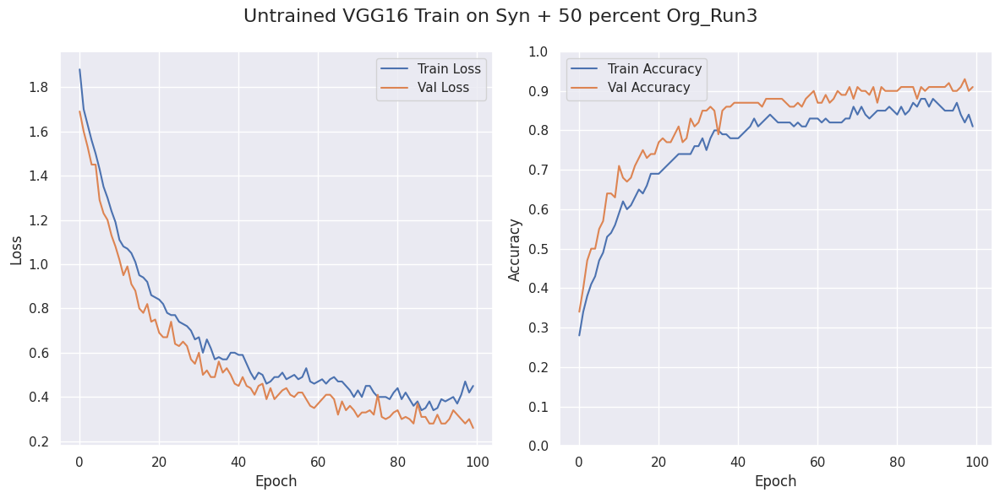

5/5 [==============================] - 1s 204ms/step
{'Test Loss': 0.7632, 'Test Accuracy': 0.7482, 'F1 Score': 0.74, 'Sensitivity (Recall)': 0.75, 'Precision': 0.81}


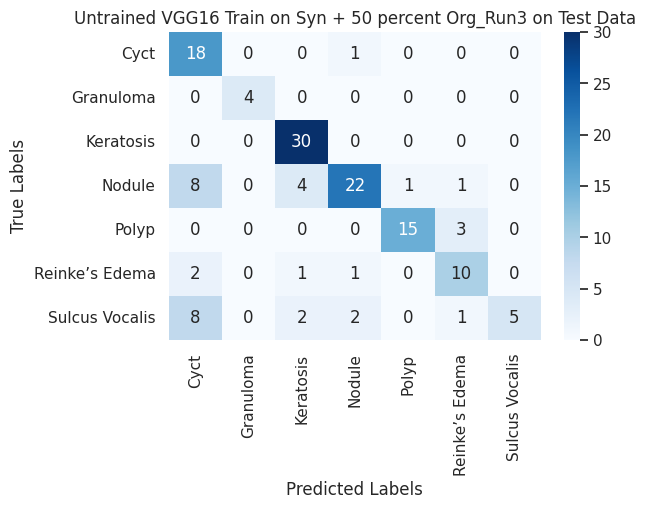

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
98/98 [==============================] - 31s 301ms/step - loss: 1.9916 - accuracy: 0.2625 - val_loss: 1.7449 - val_accuracy: 0.3824
Epoch 2/100
98/98 [==============================] - 29s 300ms/step - loss: 1.7682 - accuracy: 0.3115 - val_loss: 1.6508 - val_accuracy: 0.3542
Epoch 3/100
98/98 [==============================] - 29s 301ms/step - loss: 1.6966 - accuracy: 0.3399 - val_loss: 1.5820 - val_accuracy: 0.4297
Epoch 4/100
98/98 [==============================] - 29s 301ms/step - loss: 1.6188 - accuracy: 0.3604 - val_loss: 1.5090 - val_accuracy: 0.5090
Epoch 5/100
98/98 [==============================] - 29s 300ms/step - loss: 1.5616 - accuracy: 0.4008 - val_loss: 1.4680 - val_accuracy: 0.5269
Epoch 6/100
98/98 [==============================] - 29s 301ms/step - loss: 1.4914 - accuracy: 0.4251 - val_loss: 1.3680 - val_accuracy: 0.4770
Epoch 7/100
98/98 [============

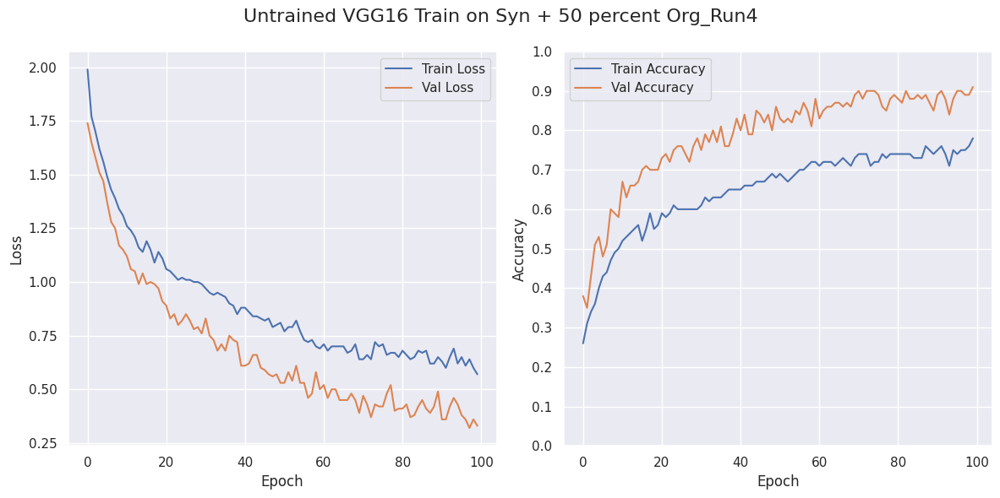

5/5 [==============================] - 1s 192ms/step
{'Test Loss': 0.9581, 'Test Accuracy': 0.7266, 'F1 Score': 0.71, 'Sensitivity (Recall)': 0.73, 'Precision': 0.75}


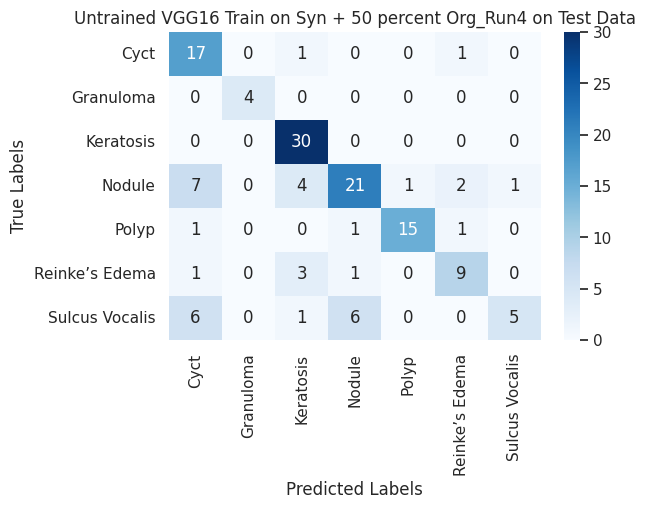

Class labels:  ['Cyct', 'Granuloma', 'Keratosis', 'Nodule', 'Polyp', 'Reinke’s Edema', 'Sulcus Vocalis']
Epoch 1/100
98/98 [==============================] - 30s 299ms/step - loss: 1.9874 - accuracy: 0.2538 - val_loss: 1.7599 - val_accuracy: 0.3082
Epoch 2/100
98/98 [==============================] - 29s 298ms/step - loss: 1.7828 - accuracy: 0.3102 - val_loss: 1.6757 - val_accuracy: 0.3427
Epoch 3/100
98/98 [==============================] - 29s 299ms/step - loss: 1.6882 - accuracy: 0.3486 - val_loss: 1.6034 - val_accuracy: 0.4309
Epoch 4/100
98/98 [==============================] - 29s 299ms/step - loss: 1.6501 - accuracy: 0.3540 - val_loss: 1.5351 - val_accuracy: 0.4629
Epoch 5/100
98/98 [==============================] - 29s 299ms/step - loss: 1.5960 - accuracy: 0.3915 - val_loss: 1.5708 - val_accuracy: 0.4719
Epoch 6/100
98/98 [==============================] - 29s 299ms/step - loss: 1.5325 - accuracy: 0.4043 - val_loss: 1.4094 - val_accuracy: 0.4834
Epoch 7/100
98/98 [============

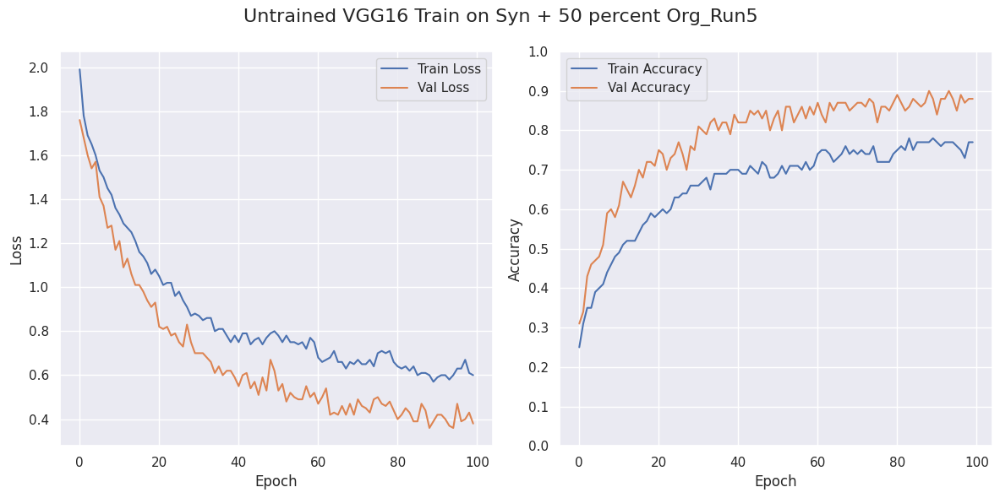

5/5 [==============================] - 1s 194ms/step
{'Test Loss': 0.7425, 'Test Accuracy': 0.7554, 'F1 Score': 0.75, 'Sensitivity (Recall)': 0.76, 'Precision': 0.76}


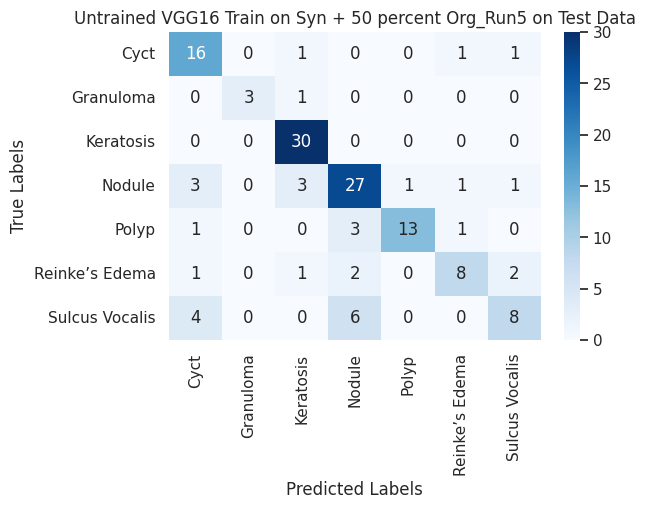

In [6]:
dataset_dir_org = f'{path_dir}/50_percent/Original'
dataset_dir_ddpm = f'{path_dir}/50_percent/Generated_CLEAN_1'

title = "Untrained VGG16 Train on Syn + 50 percent Org"
file_name = f"{path_dir}/Trained_Models/Untrained_VGG16_Synthetic_50percent_Original.png"

epochs=100
n=5

for i in range(0, n):
    trained_model, test_metrics, confusion_matrix = cv_train_and_evaluate_model(
        dataset_dir_ddpm,
        dataset_dir_org,
        class_labels,
        vgg_model,
        weights=None,
        input_shape=input_shape,
        title=f"{title}_Run{i+1}",
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv,
        epochs=epochs,
        batch_size=batch_size
    )